CLEAR

# PROPOSAL - Capstone project by Frederic NICOLA

# **Forecast of passengers's air trafic in Switzerland**

## 0. Setting up the environment

## 0.1 Importing the modules required

In [438]:
#Importing the modules
import os
import numpy as np
import pandas as pd

%matplotlib inline
import matplotlib as mpl

import matplotlib.dates as mdates
import matplotlib.pyplot as plt

import seaborn as sns

# recommended by Pandas
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

import glob
from glob import glob

import datetime

## 0.2 Changing the directory

In [439]:
# Change to the correct directory
os.chdir('/Users/BawBawBaw/Desktop/Extension School/Applied Datascience Machine learning/05-Capstone Project/Data/GVA/GVA_data')

# 1. The problem

## 1.1 Introduction

Air travel has been recently at the core of several but different topics in Switzerland.

The IATA (International Air Transport Association) forecasted that the number of air travelers will double worldwide by 2037, to 8.2 billions. (study published in october 2018).

The growth of the sector results in challenges that need to be addressed. Of particular interest for Switzerland, and why does it matters :

**Noise**
>The growth of the trafic has an impact on the population living close to the airport. Apart from the living comfort, the impact on health is the main issue.

**Sky police**
>With more airplanes in the swiss sky, the needs for more combat jet. Switzerland's army forces want to renew their jet's, for a budget of CHF 6 billions. A votation will take place, and the swiss citizens will have to decide whether to allocate this budget.

## 1.2 The project and its scope
With all these issues, a forecast of the air trafic through our main airports is crucial. I'll then intend to model the trafic  of air passengers passing through the three main airports of Switzerland. The project is focused on the number of passengers. Why ? For a variety of reasons. I would highlight the two most important ones :
1. Forecasting the number of passengers is more relevant for most economical studies. The number of aircrafts movements might be interesting for a narrower number of studies, such as airport's infrastructure planification and ecological studies.  
2. Forecasting the number of aircrats movements depends on a variety of factors which are near impossible to model as it would depend of airline's proprietary data, such as the model of airplanes used and in orders at the manufacturers.

## 1.3 What is out-of-scope of the project
The project will not tend to model or forecast the number of aircraft's movements, for the reasons explained above.  
The project focus on the three main airports. The other airports are much less relevant in terms of passenger's trafic :  
- Bern Belp Airport has seen the main company operating there collapsing
- Lugano Airport is now under bankruptcy (april 2020)

## 1.4 Final note - why using Time series ?
Working in the financial sector I encounter very often time series data. To be able to apply Python on time series would do the link between the knowledge acquired during the course and the industry in which I work.  

Time series analysis has been briefly studied during the course, it might then be a risk to work on that specific type of data.  
But, as John Fitzgerald Kennedy addressed in his famous speech at the Rice University on the Nation's Space Effort in 1962 : "*we choose to go to the moon (...) **not because they are easy**, but because **they are hard**"* (https://er.jsc.nasa.gov/seh/ricetalk.htm). 

# 2. Data

## (a) Overview of the data

**Source :**
The data come from the FOCA, the Federal Office of Civil Aviation. The office is responsible for aviation development and the supervision of civil aviation activities in Switzerland.

With the help of Mr Guerdat, statistican at FOCA, I could get an extract from their database with daily data, as opposed to the monthly aggregate available on the internet.

The data represents the air trafic that go through swiss airports, from 1970 to 2019. It is given as a number of passengers and a number of movements (representing aircrafts). The data is presented for the three main airports in Switzerland, which are, by size from the biggest to the smallest, Zurich Airport, Geneva Airport and EuroAirport (Basel, Mulhouse and Freiburg).

However, for the perdiod between 1970 and 1983, the data is only available on a yearly aggregate.
<br>
The first part of the analysis will take as a sole input the historical data to build the model and do the forecasting.

However, I intend to try to use other features, such as the GDP, in order to have a more robust model. This would depend on my ability to integrate these data into the models.
</br>


The data is presented as a time series, with three level of informations :
* the airport
* the TS of the aircraft movements
* the TS of the nb of passenger

Encoding</p>
The series are encoded as follows :
* airport name : object
* date : object
* movements : int64
* passengers : int64

## (b) Manage and process the data

**Managing the date**
> The data received from the Federal Office came in the csv format. No API is available to their database. Therefore, the data will be loaded directly into Python from the csv file.

**Cleaning**
> As the data comes directly from the Federal Office's database, it should be pretty clean. However, an EDA has been performed in order to find i) null values ii) missing values iii) 0 values

**Combining multiple data sets**
> Multiple data sets will be used if this is feasible. These new datasets will also be time series, such as GDP and population. </p>**SECTION TO BE COMPLETED**

**Feature engineering**
> The data has been provided in details for the three main aiports. A sum of all the data will be calculated in order to aggregate the results.

> For modeling purpose, the frequency of the data will be changed, ranging from daily to yearly data.

> The information given by the time series will be added as new features.

## 2.1 Data Preparation

### 2.1.1 Loading the data

Due to the use of accents, I have decided to encode the data with the encoding latin1.

In [440]:
# Importing the data and storing it
filename = 'ANFR_0082_Nom_Generique_1970_2019.csv'

data_ofac_ori2 = pd.read_csv(filename, sep=';', encoding='latin1')

### 2.1.2 First glance of the data

In [441]:
# preview of the imported file
data_ofac_ori2.head(5)

,airport,date,movemenst,passengers
0,Basel-Mulhouse,01.01.70,14617,350708
1,Basel-Mulhouse,01.01.71,15306,410088
2,Basel-Mulhouse,01.01.72,16332,460797
3,Basel-Mulhouse,01.01.73,16560,507258
4,Basel-Mulhouse,01.01.74,17060,504500


We can see already some issues as the way the data are presented. The date column is not the index, there seems to be a spelling mistake at the column movements and the data for the first airport are not daily data.

### 2.1.3 Info

In [442]:
data_ofac_ori2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39478 entries, 0 to 39477
Data columns (total 4 columns):
airport       39478 non-null object
date          39478 non-null object
movemenst     39478 non-null int64
passengers    39478 non-null int64
dtypes: int64(2), object(2)
memory usage: 1.2+ MB


## 2.2 Exploratory Data Analysis (EDA)

### 2.2.1 Preliminary EAD

#### 2.2.1.1 First / last two rows

In [443]:
data_ofac_ori2.head(2)

,airport,date,movemenst,passengers
0,Basel-Mulhouse,01.01.70,14617,350708
1,Basel-Mulhouse,01.01.71,15306,410088


In [444]:
data_ofac_ori2.tail(2)

,airport,date,movemenst,passengers
39476,Zrich,30.12.19,586,85069
39477,Zrich,31.12.19,509,67032


#### 2.2.1.2 Number of elements

In [445]:
print('The total movements recorded in the raw data is {:,}'.format(data_ofac_ori2.movemenst.sum()))
print('The total number of passengers recorded in the raw data is {:,}'.format(data_ofac_ori2.passengers.sum()))

The total movements recorded in the raw data is 16,453,353
The total number of passengers recorded in the raw data is 1,270,118,623


In [446]:
print('Volatility of the movements : {:,f}'.format(data_ofac_ori2.movemenst.std()))
print('Volatility of the # passengers : {:,f}'.format(data_ofac_ori2.passengers.std()))

Volatility of the movements : 2,188.287516
Volatility of the # passengers : 124,371.495809


In [447]:
print('Number of airports in the data : {}'.format(data_ofac_ori2.airport.nunique()))

Number of airports in the data : 3


In [448]:
print('Different airports : {}, {} & {}'.format(data_ofac_ori2.airport.unique()[0], data_ofac_ori2.airport.unique()[1], data_ofac_ori2.airport.unique()[2]))

Different airports : Basel-Mulhouse, Genve & Zrich


In [449]:
print('Number of array elements for the three airports : {:,}'.format(data_ofac_ori2.size))

Number of array elements for the three airports : 157,912


#### 2.2.1.3 Shape and type of the data

In [450]:
print('Shape of the data : {}'.format(data_ofac_ori2.shape))

Shape of the data : (39478, 4)


In [451]:
print('Types of the data {}'.format(data_ofac_ori2.dtypes))

Types of the data airport       object
date          object
movemenst      int64
passengers     int64
dtype: object


### 2.2.2 How does EDA inform on the project ?

The EDA performed on the data confirms that the data includes the expected information, which were :  
- passengers data
- three airports  
It appears that the name of the airports will need to be amended.
As per the quality of the data, the provider already mentionned the two most important issues :  
1. Only the yearly data is available from 1970 to 1983
2. There seems to be an aggregation of the data for a certain period at BEA airport.

## 2.3 Cleaning variables, outliers and missing values

### 2.3.1 Cleaning the variables names

In [452]:
print('Name of the airports in the data : {}, {} & {}'.format(data_ofac_ori2.airport.unique()[0], data_ofac_ori2.airport.unique()[1], data_ofac_ori2.airport.unique()[2]))

Name of the airports in the data : Basel-Mulhouse, Genve & Zrich


The airports name seem to have an encoded issue, probably due to the fact that their name have accents, which are not well handled with the unicodes. To avoid these problems, I'll use the IATA airport code, which is a three-letter geocode designing many airports around the world. These codes are issued by IATA, the International Air Transport Association.
</p>Source : https://en.wikipedia.org/wiki/IATA_airport_code

In [453]:
data_ofac_ori2.airport.unique()

# Replacing the names of the airports, not correctly imported due to the encoding, by their IATA code.
# Of particular interest, the code for the swiss part of the airport Basel-Mulhouse is used, as Basel airport
# is the only airport in the world to have two IATA codes, one for the swiss part and another one for
# the french part.
data_ofac_ori2.replace('Basel-Mulhouse', 'EAP', inplace=True)
data_ofac_ori2.replace('Gen\x8fve', 'GVA', inplace=True)
data_ofac_ori2.replace('Z\x9frich', 'ZRH', inplace=True)

# correcting the spelling mistake of the columns movements
data_ofac_ori2.rename(columns={'movemenst':'movements'}, inplace=True)

The airport's names have been replaced to the following :  
- Basel-Mulhouse airport => EAP  
- Geneva airport         => GVA  
- Zurich airport         => ZRH

### 2.3.2 Missing values

**Missing values** </p>
As already mentioned, the period between 1970 and 1983 only have yearly aggregated data. In order to have constant values, I'll perform a linear bootstrap from the agregated data point of each year.

In [454]:
# Setting the index to the date column
data_ofac_ori2.set_index(keys='date', drop=True, inplace=True)

# Setting the index to a datetime format, and specifying the day 
# (otherwise it mixes up the day and the month)
data_ofac_ori2.index = pd.to_datetime(data_ofac_ori2.index, dayfirst=True)

In [455]:

"""Passengers values - for the years between 1970 to 1983, only the aggregated yearly data are available.
In order to plot these data, the data have been divided by 365 and will therefore exhibit a 
linear growth during these years. This is for the plot only.
"""

# let's first calculate the number of years between 1983 and 1970, which is 14. We'll then generate
# these numbers in order to loop over it.
nb = np.arange(0,15,1)

# Let's now define two temporary dataframe :
vvv = pd.DataFrame() # will receive the data

# temp is used to store the data from the original dataframe for the current looped year.
# This is done to avoir having to loop over all the data at ounce.
temp = pd.DataFrame()

# we now prepare the dataframe with dates as index and three columns, one for each airport
vvv['dates'] = pd.date_range('1970-01-01', '1983-12-31')

vvv['ZRH'] = 0
vvv['GVA'] = 0
vvv['EAP'] = 0

# setting the index with the dates column
vvv.set_index(vvv.dates, inplace=True, drop=True)

# defining now the range of years to be looped - this time with the real year.
yrr = np.arange(1970, 1984, 1)

# initialize the year value
yr = 1970

# looping over the data per year (one at a time) and applying a linear value for each day, 
# corresponding to 1/365th of the yearly aggregated data.
# 365 is used as a proxy for the number of dates per year. This data will NOT be used for any analysis
# later.
for n in nb:
    temp = data_ofac_ori2.loc[datetime.date(year=yr, month=1, day=1)]
    vvv.loc[datetime.date(year=yr, month=1, day=1):datetime.date(year=yr, month=12, day=31), 'ZRH'] = temp[temp.airport == 'ZRH'].passengers[0]/365
    vvv.loc[datetime.date(year=yr, month=1, day=1):datetime.date(year=yr, month=12, day=31), 'GVA'] = temp[temp.airport == 'GVA'].passengers[0]/365
    vvv.loc[datetime.date(year=yr, month=1, day=1):datetime.date(year=yr, month=12, day=31), 'EAP'] = temp[temp.airport == 'EAP'].passengers[0]/365
    yr = yr + 1
    
# organizing the data in a dataframe and changing the type of the data
vvv = vvv[['ZRH', 'GVA', 'EAP']].astype('int64')

In [456]:
# agregating the data into a new dataframe
data_ofac_ori2_re = pd.pivot(data_ofac_ori2, columns='airport', values='passengers')

# removing the aggregated data in the original dataframe
yrr = np.arange(1970, 1984, 1)
for yr in yrr :
    data_ofac_ori2_re.drop(datetime.date(year=yr, month=1, day=1), axis=0, inplace=True)

# combining the dataframes
data_ofac_ori2_pass = pd.concat([vvv, data_ofac_ori2_re], axis=0, sort=False)

As we're now familiar with the airport's code, we'll now create a variable for each airport which will store that code, in order to avoir having to type it again. The variable name starts with "iata_code_" and the airport's name :  
- iata_code_basel  
- iata_code_geneva  
- iata_code_zurich

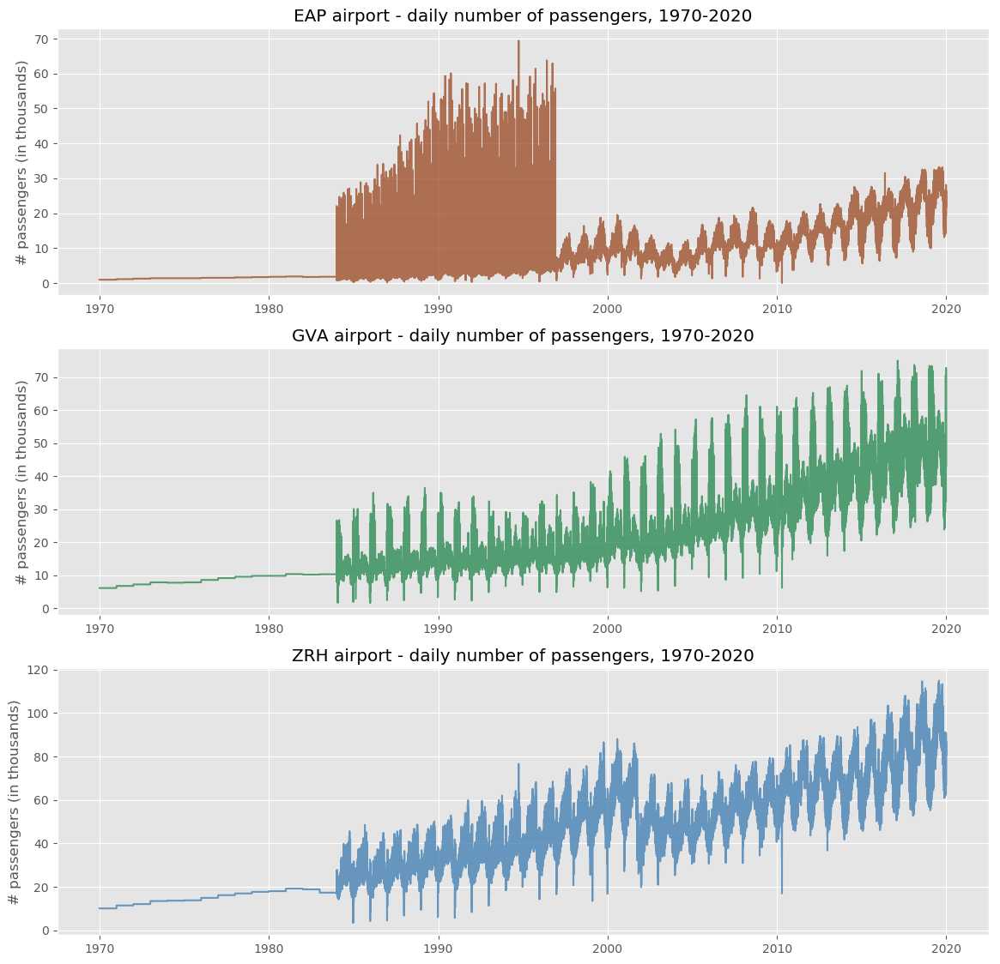

In [457]:
# Plotting the daily number of passengers per airport

plt.style.use('ggplot')

fig = plt.figure(figsize=(14,14), dpi=100)
ax = fig.add_subplot(311)
ax2 = fig.add_subplot(312)
ax3 = fig.add_subplot(313)

# Filtering for the 1st airport's data - this is done to avoid having lengthy
# arguments within the plot function

grtitle = 'airport - daily number of passengers, 1970-2020'

# BEA Airport
# ===========
iata_code_basel = 'EAP'
gf_data_EAP = data_ofac_ori2_pass[iata_code_basel]

# ploting the first graph
ax.set(title='{} {}'.format(iata_code_basel, grtitle), ylabel='# passengers (in thousands)')
ax.plot(gf_data_EAP.index.values, gf_data_EAP.values/1000, color='sienna', alpha=0.8)


# GVA Airport
# ===========
iata_code_geneva = 'GVA'
gf_data_GVA = data_ofac_ori2_pass[iata_code_geneva]

# ploting the second graph
ax2.set(title='{} {}'.format(iata_code_geneva, grtitle), ylabel='# passengers (in thousands)')
ax2.plot(gf_data_GVA.index.values, gf_data_GVA.values/1000, color='seagreen', alpha=0.8)


# ZRH Airport
# ===========
iata_code_zurich = 'ZRH'
gf_data_ZRH = data_ofac_ori2_pass[iata_code_zurich]

# ploting the third graph
ax3.set(title='{} {}'.format(iata_code_zurich, grtitle), ylabel='# passengers (in thousands)')
ax3.plot(gf_data_ZRH.index.values, gf_data_ZRH.values/1000, color='steelblue', alpha=0.8)


plt.subplots_adjust(hspace=0.2)
plt.show()

**Comment**
> Plotting the raw data, with the exception of the years between 1970 to 1983, where a linear bootstrap has been performed from the agregated data point of each year.

### 2.3.3 Data error at EAP airport

Let's now refine the graph from the year 1984 to investigate the spike appearance at EAP airport.

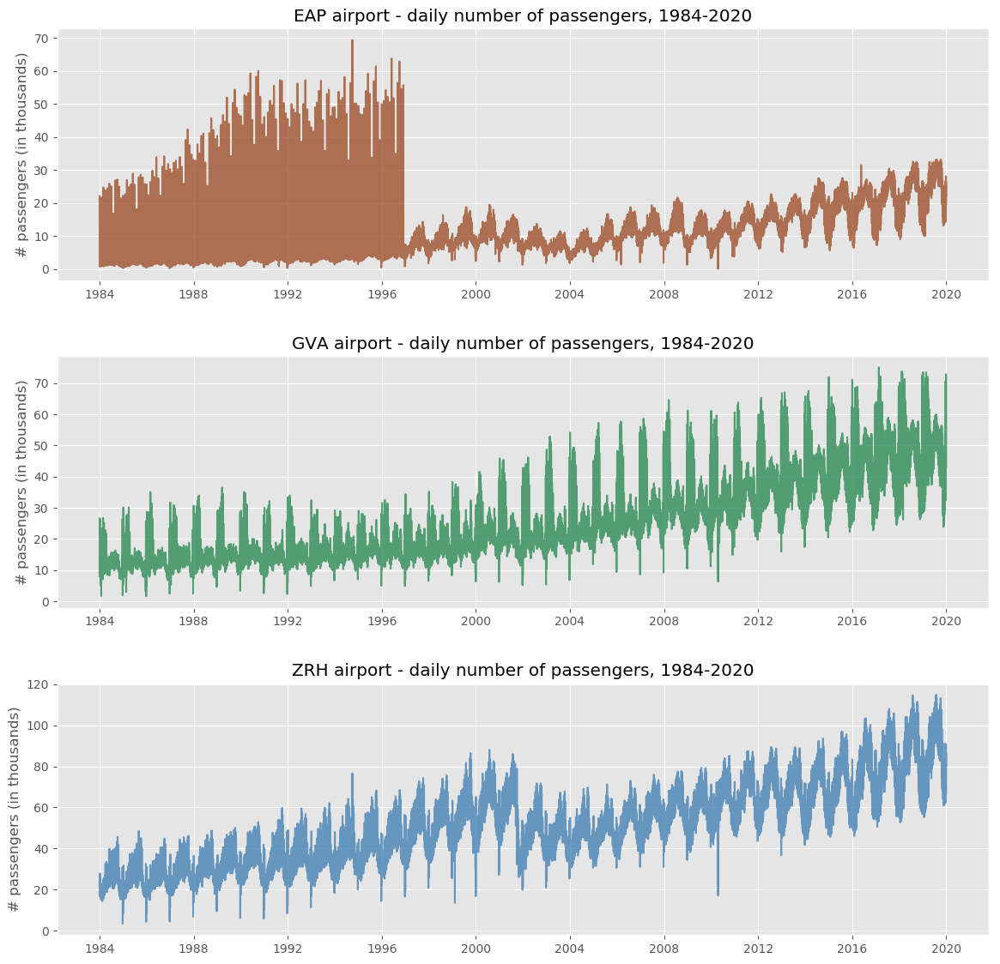

In [458]:
# Refining the plot to investigate the years from 1984, where the daily data are available

plt.style.use('ggplot')

fig = plt.figure(figsize=(14,14), dpi=100)
ax = fig.add_subplot(311)
ax2 = fig.add_subplot(312)
ax3 = fig.add_subplot(313)

# Setting the start year for the title
startyear = '1984'

# Filtering the period first
gf_dat = data_ofac_ori2.loc['1984-01-01':'2020-01-01']


# EAP Airport
# ===========
iata_code_basel = 'EAP'
gf_data_EAP = gf_dat[gf_dat.airport == iata_code_basel]

# ploting the first graph
ax.set(title='{} airport - daily number of passengers, {}-2020'.format(iata_code_basel, startyear), ylabel='# passengers (in thousands)')
ax.plot(gf_data_EAP.index.values, gf_data_EAP.passengers.values/1000, color='sienna', alpha=0.8)


# GVA Airport
# ===========
iata_code_geneva = 'GVA'
gf_data_GVA = gf_dat[gf_dat.airport == iata_code_geneva]

# ploting the second graph
ax2.set(title='{} airport - daily number of passengers, {}-2020'.format(iata_code_geneva, startyear), ylabel='# passengers (in thousands)')
ax2.plot(gf_data_GVA.index.values, gf_data_GVA.passengers.values/1000, color='seagreen', alpha=0.8)


# ZRH Airport
# ===========
iata_code_zurich = 'ZRH'
gf_data_ZRH = gf_dat[gf_dat.airport == iata_code_zurich]

# ploting the third graph
ax3.set(title='{} airport - daily number of passengers, {}-2020'.format(iata_code_zurich, startyear), ylabel='# passengers (in thousands)')
ax3.plot(gf_data_ZRH.index.values, gf_data_ZRH.passengers.values/1000, color='steelblue', alpha=0.8)


plt.subplots_adjust(hspace=0.3)
plt.show()

**Comment**
> The plot confirms that there seems to be a sort of aggregation of the data only for Basel Airport. This has also been confirmed by Mr Guerdat from FOCA. This problem disapears from 1987 with the introduction of their new database.

Plotting now the first 3 days of each month to try to have a clearer view of the problem.

In [459]:
# Creating a dataframe with the first 3 days of each month to see
# the outliers

import datetime

# we first filter the original dataframe with only the data for basel airport
temp = data_ofac_ori2[data_ofac_ori2.airport == iata_code_basel]

# we then choose the range of years to be plotted, as well as the 12 months.
# this is use to loop over the years.
yrr = np.arange(1984, 1998, 1)
mrr = np.arange(1, 13, 1)
vv = []
for yr in yrr:  #looping over the year
    for mr in mrr: #looping over the months
        vv.append(temp.loc[datetime.date(year=yr, month=mr, day=1)])
        vv.append(temp.loc[datetime.date(year=yr, month=mr, day=2)])
        vv.append(temp.loc[datetime.date(year=yr, month=mr, day=3)])

# the data is now in a temporary dataframe
vv = pd.DataFrame(vv)

Let's first plot a line plot to see these data :

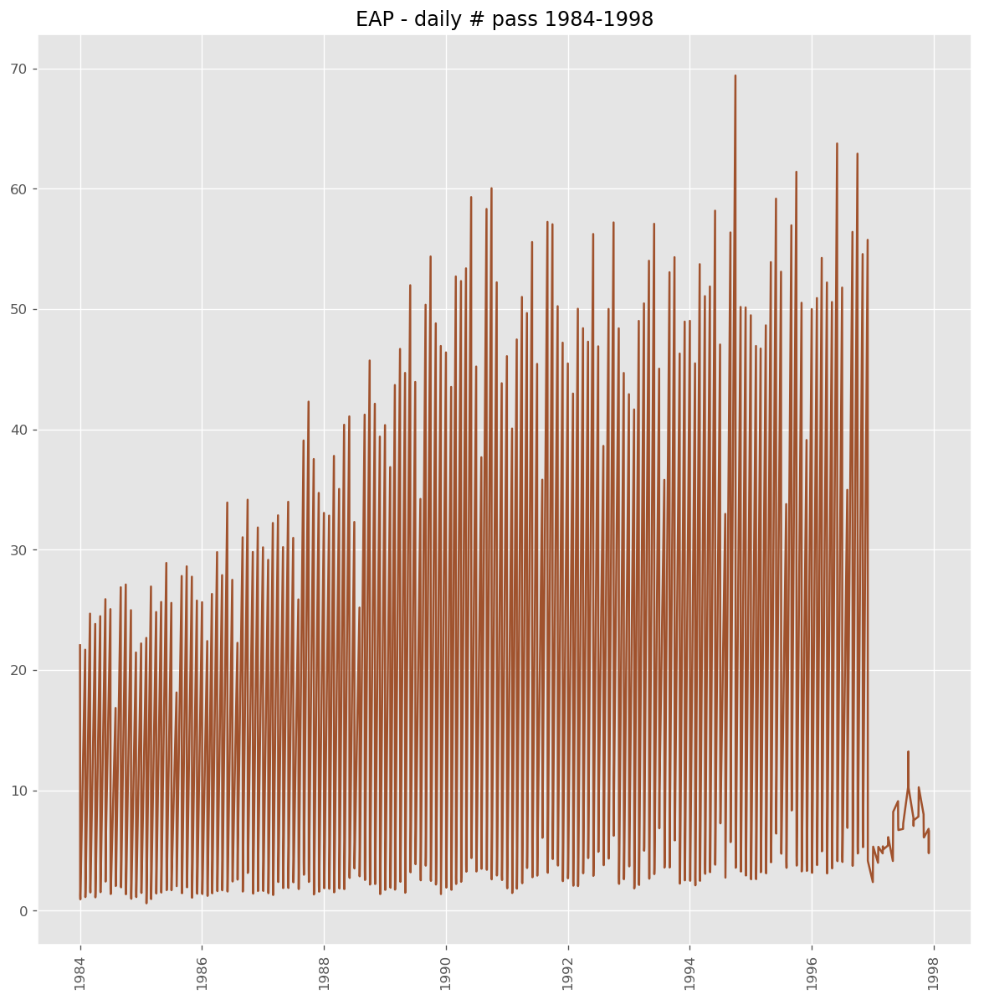

In [460]:
# Checking for the first 3 days of each month, from 1984 to 1997
# Passengers

plt.style.use('ggplot')

fig = plt.figure(figsize=(12,12), dpi=120)

# Let's first plot a line plot
plt.autoscale(enable=True, axis='x')
plt.xticks(rotation='vertical', fontsize=10)
plt.plot(vv.index, vv.passengers.values/1000, color='sienna')
plt.title('EAP - daily # pass 1984-1998')
plt.show()

Let's now try to plot a scatter plot to have a better view.

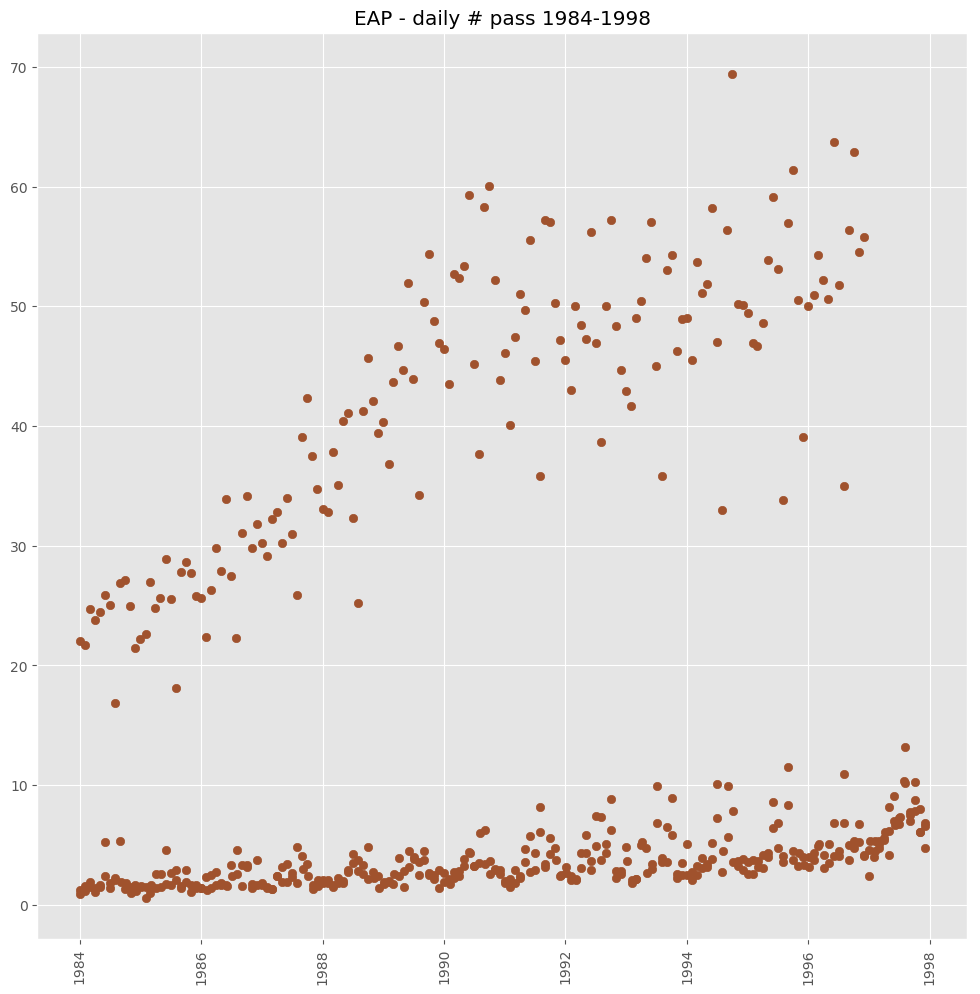

In [461]:
# Checking for the first 3 days of each month, from 1984 to 1997
# Passengers

plt.style.use('ggplot')

fig = plt.figure(figsize=(12,12), dpi=100)

# Let's first plot a line plot
plt.autoscale(enable=True, axis='x')
plt.xticks(rotation='vertical', fontsize=10)
plt.scatter(vv.index, vv.passengers.values/1000, 
         color='sienna')
plt.title('EAP - daily # pass 1984-1998')
plt.show()

**Comment**
> The plots confirm the aggregation problem.

Let's now plot the z-score, in order to have a quantitative confirmation of the problem. This is for information only as we have not yet checked whether the data is normaly distributed.

In [462]:
# extracting data to calculate the z-scores and creating dataframes with daily data for each airport

# Basel airport
temp2 = data_ofac_ori2.loc['1984-01-01':'1998-01-01']
temp2 = temp2[temp2.airport == iata_code_basel]

temp22 = data_ofac_ori2.loc['1984-01-01':'2019-12-31']
EAP_dly = temp22[temp22.airport == iata_code_basel]

# Geneva airport
temp3 = data_ofac_ori2.loc['1984-01-01':'2019-12-31']
GVA_dly = temp3[temp3.airport == iata_code_geneva]

# Zurich airport
temp4 = data_ofac_ori2.loc['1984-01-01':'2019-12-31']
ZRH_dly = temp4[temp4.airport == iata_code_zurich]

# calculating the z-score for the airports
EAP_zscores = (temp2.passengers.values - temp2.passengers.mean()) / temp2.passengers.std()

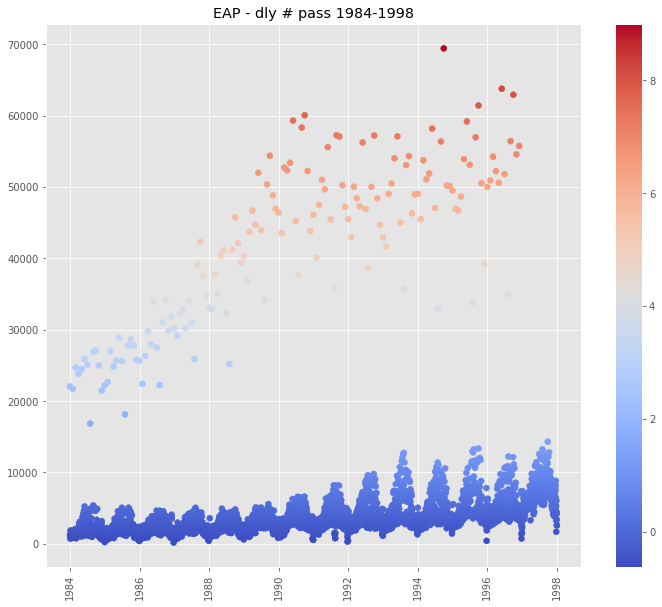

In [463]:
# Checking for the year 1984, by using the month of january
# Passengers

# Plot z-scores
#  the z-scores has been calculated for the whole period, with the outliers
plt.style.use('ggplot')

fig = plt.figure(figsize=(12,10))

plt.autoscale(enable=True, axis='x')
plt.xticks(rotation='vertical', fontsize=10)
plt.scatter(temp2.index, temp2.passengers.values, c=EAP_zscores, cmap='coolwarm')
plt.colorbar()
plt.title('EAP - dly # pass 1984-1998')
plt.show()

**Comment**
> Let's now correct these data errors (outliers) for the years 1984 to 1996 by applying the mean value.

The outliers will be replaced with the mean value of the month. This mean value will be calculated without the day where the data error is, that is the first day of each month.

In [464]:
# Correcting outliers

# creating a new dataframe 
data_ofac_clean_eap = data_ofac_ori2[data_ofac_ori2.airport == 'EAP']

import datetime 
import calendar

# Creating a series of year where the mean has to be applied
yrr = np.arange(1984, 1997, 1)
mrr = np.arange(1, 13, 1)

for yr in yrr:
    for mr in mrr:
#        print('... month # {} of year {}'.format(mr, yr), end="\r")

        # finding the last day of the month
        last_day_of_month = calendar.monthrange(yr,mr)[1]
        
        # calculating the mean for the current year
        curmean = temp2.passengers.loc[datetime.date(year=yr,month=mr,day=2):datetime.date(year=yr,month=mr,day=last_day_of_month)].mean()
        curmean = curmean.astype('int64')  # converted to integer

        # applying the mean on the first day of each month
        data_ofac_clean_eap.passengers.loc[datetime.date(year=yr, month=mr, day=1)] = curmean

/Applications/anaconda3/envs/exts-ml_NEW/lib/python3.6/site-packages/pandas/core/indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)
/Applications/anaconda3/envs/exts-ml_NEW/lib/python3.6/site-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [465]:
# Creating a dataframe for the passengers values, cleaned

zrh = pd.DataFrame()
zrh['ZRH'] = data_ofac_ori2[data_ofac_ori2.airport == iata_code_zurich].passengers

In [466]:
# Creating a dataframe for the passengers values, cleaned

gva = pd.DataFrame()
gva['GVA'] = data_ofac_ori2[data_ofac_ori2.airport == iata_code_geneva].passengers

In [467]:
# same but for geneva

eap = pd.DataFrame()
eap['EAP'] = data_ofac_clean_eap.passengers

In [468]:
# Let's concatenate the three dataframes

data_ofac_cleaned = pd.concat([zrh, gva, eap], axis=1)

**Comment**
> The data has been cleaned and a new dataframe has been created with the values of the three airports.

Let's now inspect the values by plotting them.

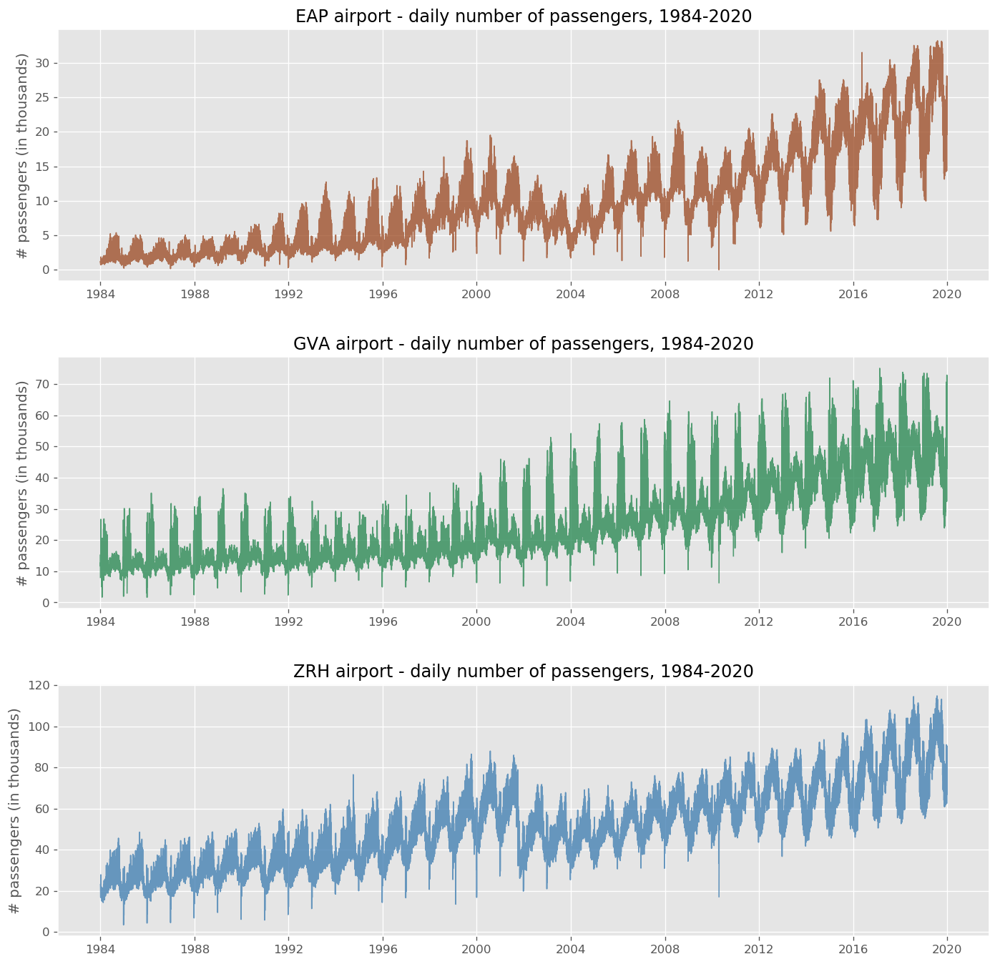

In [469]:
# Plotting the values cleaned

plt.style.use('ggplot')

fig = plt.figure(figsize=(14,14), dpi=120)
ax = fig.add_subplot(311)
ax2 = fig.add_subplot(312)
ax3 = fig.add_subplot(313)

# Setting the start year for the title
startyear = '1984'

# Filtering the period first
gf_dat = data_ofac_cleaned.loc['1984-01-01':'2020-01-01']


# BEA Airport
ax.set(title='{} airport - daily number of passengers, {}-2020'.format(iata_code_basel, startyear), ylabel='# passengers (in thousands)')
ax.plot(gf_dat.index.values, gf_dat[iata_code_basel].values/1000, marker='', color='sienna', linewidth=1, alpha=0.8)


# GVA Airport
ax2.set(title='{} airport - daily number of passengers, {}-2020'.format(iata_code_geneva, startyear), ylabel='# passengers (in thousands)')
ax2.plot(gf_dat.index.values, gf_dat[iata_code_geneva].values/1000, marker='', color='seagreen', linewidth=1, alpha=0.8)


# ZRH Airport
ax3.set(title='{} airport - daily number of passengers, {}-2020'.format(iata_code_zurich, startyear), ylabel='# passengers (in thousands)')
ax3.plot(gf_dat.index.values, gf_dat[iata_code_zurich].values/1000, marker='', color='steelblue', linewidth=1, alpha=0.8)


plt.subplots_adjust(hspace=0.3)
plt.show()

**Comment**
> The data at EAP airport now seems normal.
> The interpolating of yearly data to daily data was for illustration only (to plot the chart). Only the data where the daily data are available (e.g. from 1984) will be used for the analysis.

### 2.3.4 Checking for missing values as a newdataframe has been created by aggregating data

**Comment**
> By combining the data from the three different airport, but keeping one index, we'll check the cleaned data to see whether there is some missing values.

In [470]:
# Checking for missing values
print('Number of missing values per airport :')
data_ofac_cleaned.isna().sum()

Number of missing values per airport :


ZRH    3
GVA    5
EAP    3
dtype: int64

The data seem to have missing values. Let's try to correct it.

In [471]:
# detecting the missing data

data_ofac_cleaned[data_ofac_cleaned.isna()]

data_ofac_cleaned.fillna(method='backfill', inplace=True)

**Comment**
> The missing data was filled with backfill method, meaning the next values will be used. This is a conservative approach, as April is usually a busy month for airport, and the variability of the data can be important. The data after the missing days are lower than the one before, therefore the conservative approach.

In [472]:
#data_ofac_cleaned = data_ofac_cleaned.interpolate(method='spline', order=2)

**Comment**
> TO COMPLETE

In [473]:
# Checking for missing values AFTER the filling of the data
print('Number of missing values per airport :')
data_ofac_cleaned.isna().sum()

Number of missing values per airport :


ZRH    0
GVA    0
EAP    0
dtype: int64

### 2.3.5 Checking for null values

In [474]:
# Checking for null values
data_ofac_cleaned.describe()

,ZRH,GVA,EAP
count,1.316300e+04,1.316300e+04,13163.000000
mean,5.734173e+04,2.857359e+04,10128.205728
std,1.840780e+05,1.049560e+05,19207.623527
min,3.391000e+03,1.644000e+03,0.000000
25%,3.536700e+04,1.457750e+04,3614.000000
50%,5.059400e+04,2.106300e+04,8049.000000
75%,6.499700e+04,3.353800e+04,13319.000000
max,7.012572e+06,3.796014e+06,687282.000000


**Comment**
> Using the function describe to find any null values. The function indicates the minimum values of each series.  
> It appears that there are some missing/null values at EAP airport.

**Localizing the null values** </p>
For that, we'll check the days where the number of passengers is below 100 (arbitrary number). It might be difficult for an airport to have less than 100 passengers per day (it would represent less than 2 of the smallest airplane operating at these airports per day - highly impossible).

In [475]:
# Finding the days where the number of passengers are empty
# Using the value 100, as it might be difficult to have less than that number of
# passenger on a specific day

nulval = data_ofac_cleaned[data_ofac_cleaned.EAP < 100]
nulval

,ZRH,GVA,EAP
date,,,
2010-04-17,17088.0,6329.0,0.0
2010-04-18,17088.0,6329.0,0.0
2010-04-19,17088.0,6329.0,0.0


**Comment**
> Ounce the null values have been localized, we'll use the properties of the calendar to plot the whole month. To do so, we'll use the month and year of the null values dataframe. The plot will be from the 1st until the last day of that month.

Let's first plot the value.

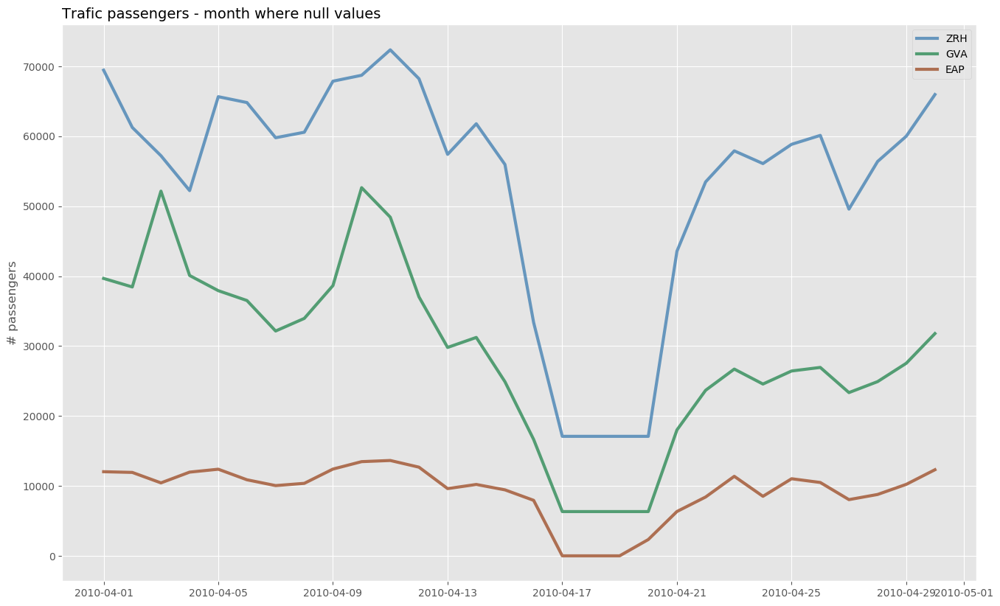

In [476]:
# Localysing the data
data = data_ofac_cleaned.loc[datetime.date(year=nulval.index.year[0],
                                    month=nulval.index.month[0],
                                    day=1)
                      :datetime.date(year=nulval.index.year[0],
                                     month=nulval.index.month[0], 
                                     day=calendar.monthrange(nulval.index.year[0],
                                                             nulval.index.month[0])
                                     [1])
                     ]

# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=100)

# setting the x axis
x = data.index

# plotting the values
plt.plot(x, data[iata_code_zurich], marker='', color='steelblue', linewidth=3, alpha=0.8)
plt.plot(x, data[iata_code_geneva], marker='', color='seagreen', linewidth=3, alpha=0.8)
plt.plot(x, data[iata_code_basel], marker='', color='sienna', linewidth=3, alpha=0.8)

# Add titles & legend
plt.title("Trafic passengers - month where null values", loc='left', fontsize=14, fontweight=0, color='black')
plt.ylabel("# passengers")
plt.legend()
plt.show()

In [477]:
data_ofac_cleaned[iata_code_basel].replace(to_replace=0, method='backfill', inplace=True)

**Comment**
> The null values have been replaced using the backfill method - inline with what was done for the two previous airports.

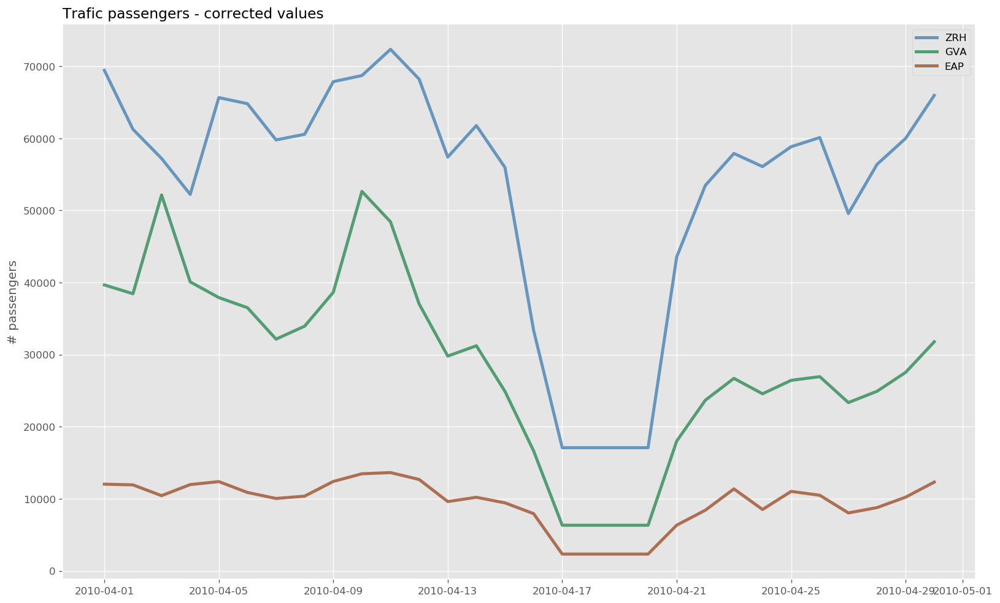

In [478]:
# Localysing the data
data = data_ofac_cleaned.loc[datetime.date(year=nulval.index.year[0],
                                    month=nulval.index.month[0],
                                    day=1)
                      :datetime.date(year=nulval.index.year[0],
                                     month=nulval.index.month[0], 
                                     day=calendar.monthrange(nulval.index.year[0],
                                                             nulval.index.month[0])
                                     [1])
                     ]

# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=120)

# setting the x axis
x = data.index

plt.plot(x, data[iata_code_zurich], marker='', color='steelblue', linewidth=3, alpha=0.8)
plt.plot(x, data[iata_code_geneva], marker='', color='seagreen', linewidth=3, alpha=0.8)
plt.plot(x, data[iata_code_basel], marker='', color='sienna', linewidth=3, alpha=0.8)

# Add title & legend
plt.title("Trafic passengers - corrected values", loc='left', fontsize=14, fontweight=0, color='black')
plt.ylabel("# passengers")
plt.legend()
plt.show()

### 2.3.6 Plotting the cleaned values after missing and null values

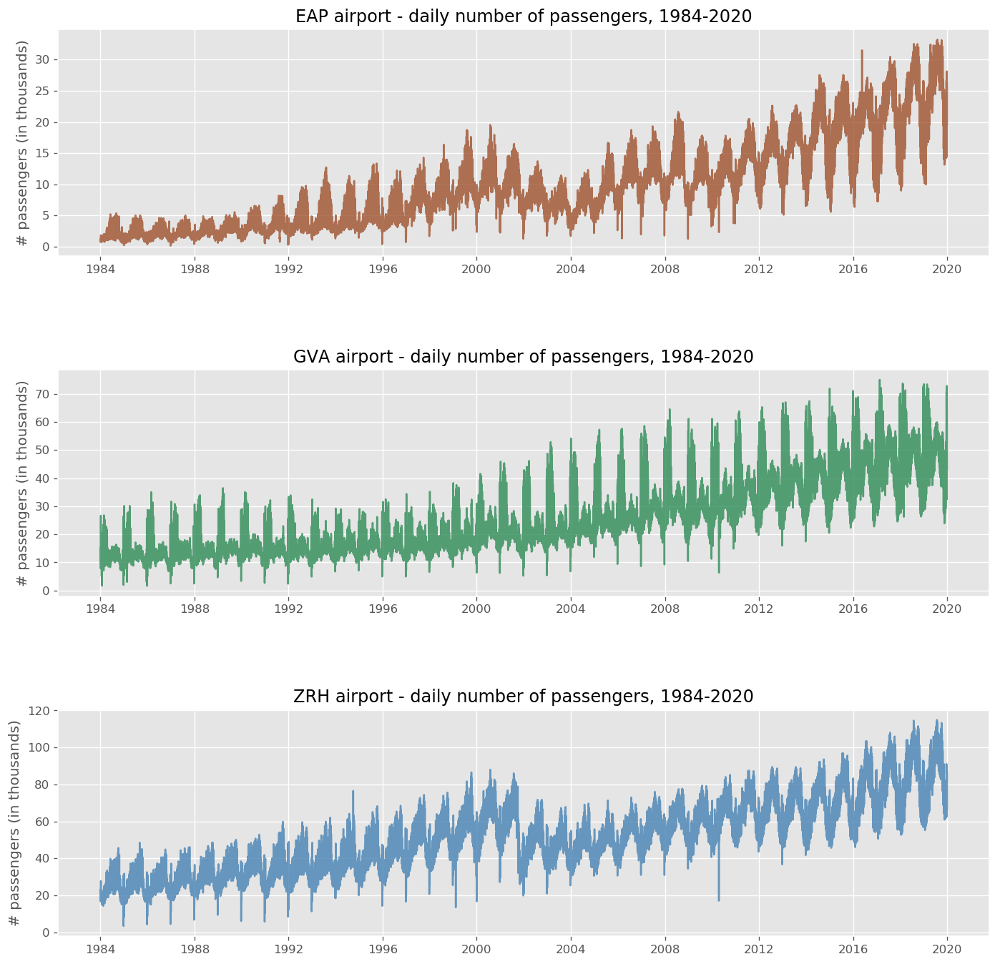

In [479]:
# Let's plot again the data as the data has been cleaned

# Refining the plot to investigate the years from 1984, where the daily data are available

plt.style.use('ggplot')

fig = plt.figure(figsize=(14,14), dpi=120)
ax = fig.add_subplot(311)
ax2 = fig.add_subplot(312)
ax3 = fig.add_subplot(313)

# Setting the start year for the title
startyear = '1984'

# Filtering the period first
gf_dat = data_ofac_cleaned.loc['1984-01-01':'2020-01-01']


# BEA Airport
# ===========
gf_data_EAP = gf_dat[iata_code_basel]

# ploting the first graph
ax.set(title='{} airport - daily number of passengers, {}-2020'.format(iata_code_basel, startyear), ylabel='# passengers (in thousands)')
ax.plot(gf_data_EAP.index.values, gf_data_EAP.values/1000, color='sienna', alpha=0.8)


# GVA Airport
# ===========
iata_code_geneva = 'GVA'
gf_data_GVA = gf_dat[iata_code_geneva]

# ploting the first graph
ax2.set(title='{} airport - daily number of passengers, {}-2020'.format(iata_code_geneva, startyear), ylabel='# passengers (in thousands)')
ax2.plot(gf_data_GVA.index.values, gf_data_GVA.values/1000, color='seagreen', alpha=0.8)


# ZRH Airport
# ===========
iata_code_zurich = 'ZRH'
gf_data_ZRH = gf_dat[iata_code_zurich]

# ploting the first graph
ax3.set(title='{} airport - daily number of passengers, {}-2020'.format(iata_code_zurich, startyear), ylabel='# passengers (in thousands)')
ax3.plot(gf_data_ZRH.index.values, gf_data_ZRH.values/1000, color='steelblue', alpha=0.8)


plt.subplots_adjust(hspace=0.5)
plt.show()

### 2.3.7 Detecting outliers

#### 2.3.7.1 Plotting the distribution of the data

In [480]:
data_ofac_cleaned.head(3)

,ZRH,GVA,EAP
date,,,
1970-01-01,3680187.0,2254752.0,350708.0
1971-01-01,4173445.0,2487270.0,410088.0
1972-01-01,4407162.0,2657988.0,460797.0


Squared nb of values in the dataset (rounded) : 115


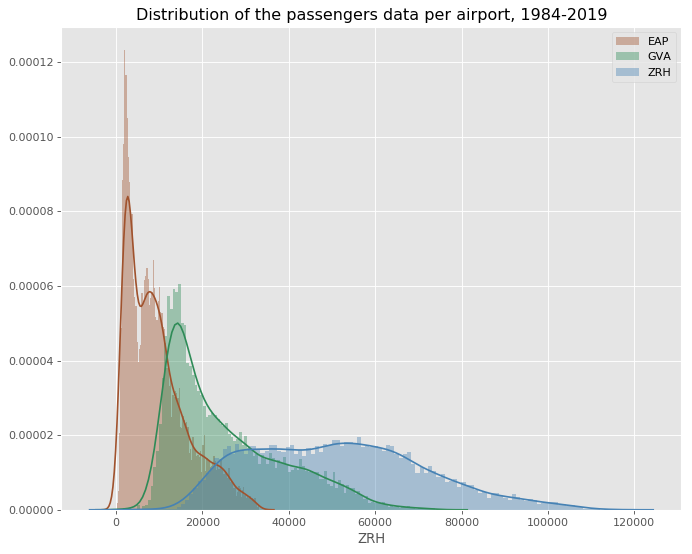

In [481]:
# plotting the distribution of the data
# defining the number of bins to use by using the rule of thumb method : taking the squared
# of the number of values in the dataset.
qrtval = np.round(np.sqrt(len(EAP_dly.passengers)))
qrtval = qrtval.astype(int)
print('Squared nb of values in the dataset (rounded) : {}'.format(qrtval))

# plotting the distribution of the passengers data, from 1984 to 2019
plt.figure(figsize=(10,8), dpi=80)

sns.distplot(data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'], color="sienna", label=iata_code_basel, bins=qrtval)
sns.distplot(data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'], color="seagreen", label=iata_code_geneva, bins=qrtval)
sns.distplot(data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'], color="steelblue", label=iata_code_zurich, bins=qrtval)

plt.title('Distribution of the passengers data per airport, 1984-2019')
plt.legend()
plt.show()

**Comment**
> None of them appears to have a normal distribution :
    EAP has a high kurtosis and skewed, GVA is skewed and EAP has a fat tail.

#### 2.3.7.2 Trying to detect with the full range of years - Box Plot chart

**Outliers** : trying to identify the outliers with a Box-Plot Chart, plotting the data per airport.

#### Box plot per airport

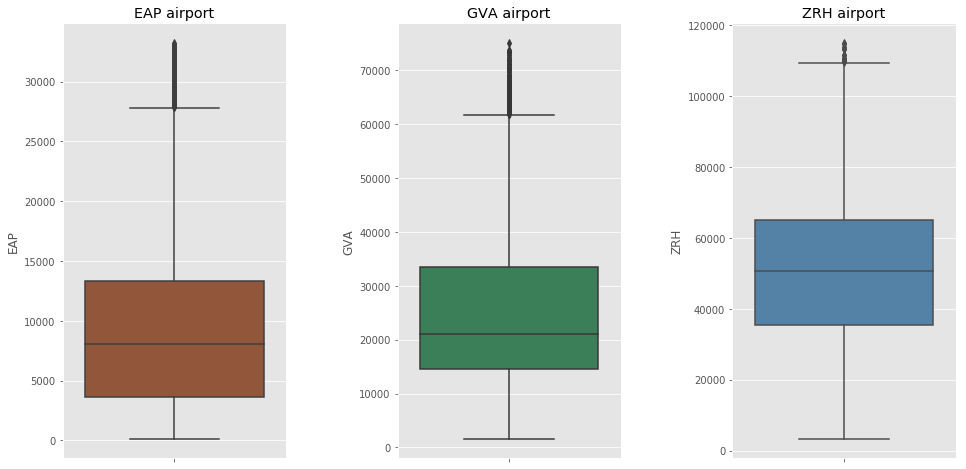

In [482]:
plt.figure(figsize=(16,8))
plt.subplots_adjust(wspace=0.5)

plt.subplot(1,3,1)
plt.title('EAP airport')
sns.boxplot(y = data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'], color='sienna')

plt.subplot(1,3,2)
plt.title('GVA airport')
sns.boxplot(y = data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'], color='seagreen')

plt.subplot(1,3,3)
plt.title('ZRH airport')
sns.boxplot(y = data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'], color='steelblue')

plt.show()

**Comment**
>As there is a strong trend in the data, using Box plot to find the outliers isn't of any real help.

#### 2.3.7.3 Plotting each series per year - to detect outliers and see if there is any seasonality

Let's start by plotting a summary of the series per year

In [483]:
""" The function is used to plot the number of air passengers per year.
To be used if plot for a dataframe which only contains the data of a specific airport.
"""

def plotdatapassengers(df):
    # definin the number of years in the dataframe
    nb = np.arange(1,(df.index.max().year-df.index.min().year)+2,1)
    yr = df.index.min().year #defining the start year
            
    plt.figure(figsize=(25,20), dpi=120)
    plt.subplots_adjust(hspace=0.7, wspace=0.2)
    
    for n in nb:  #looping over the year
        plt.subplot(9,4,n)
        plt.xticks(rotation=90)
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b'))
        plt.plot(df.loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))].passengers)
        plt.title('Year {}'.format(yr))
        yr = yr+1

    plt.subplots_adjust(top=0.95)
    plt.suptitle('{} airport passengers data, per year'.format(df.airport.unique()[0]), verticalalignment='top', fontsize=17)
    plt.show()

In [484]:
""" The function is used to plot the number of air passengers per year.
requires a dataframe and a iatacode
"""

def plotdatapassengers2(df, iata_code):
    # defining the number of years in the dataframe
    nb = np.arange(1,(df.index.max().year-df.index.min().year)+2,1)
    yr = df.index.min().year #defining the start year
            
    plt.figure(figsize=(25,20), dpi=120)
    plt.subplots_adjust(hspace=0.7, wspace=0.2)
    
    for n in nb:  #looping over the year
        plt.subplot(9,4,n)
        plt.xticks(rotation=90)
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b'))
        plt.plot(df.loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))])
        plt.title('Year {}'.format(yr))
        yr = yr+1

    plt.subplots_adjust(top=0.95)
    plt.suptitle('{} airport passengers data, per year'.format(iata_code), verticalalignment='top', fontsize=17)
    plt.show()

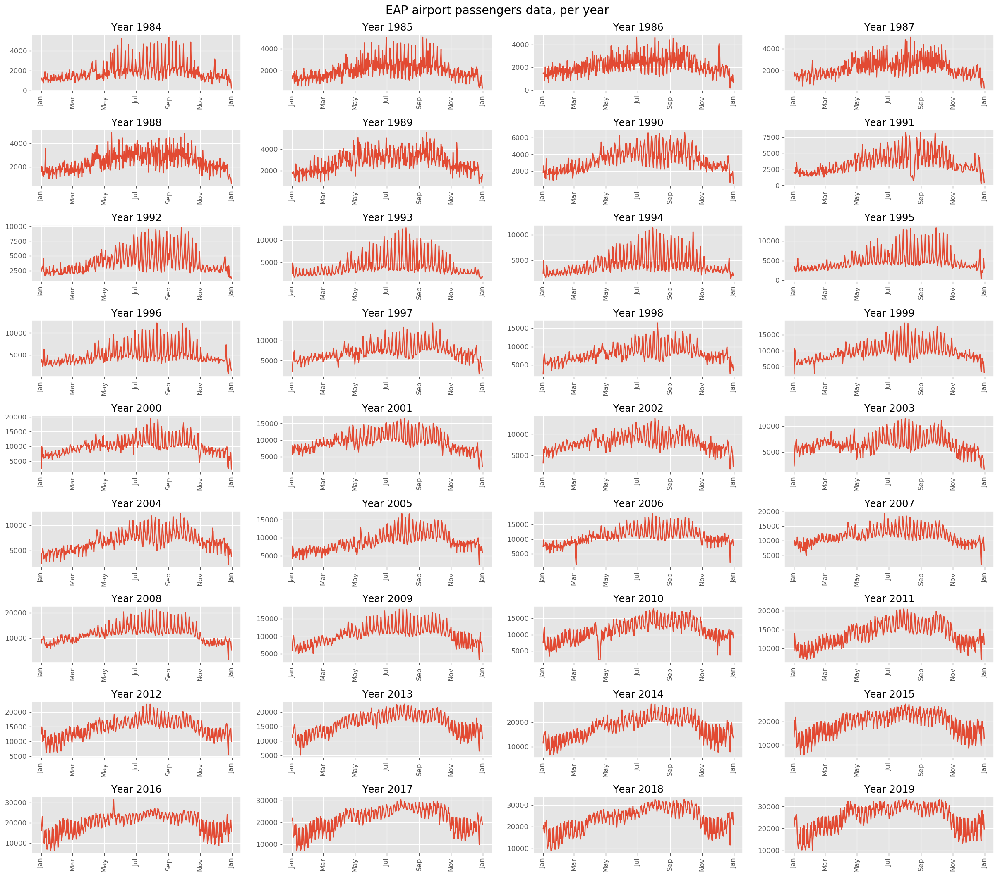

In [485]:
plotdatapassengers2(data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'], iata_code='EAP')

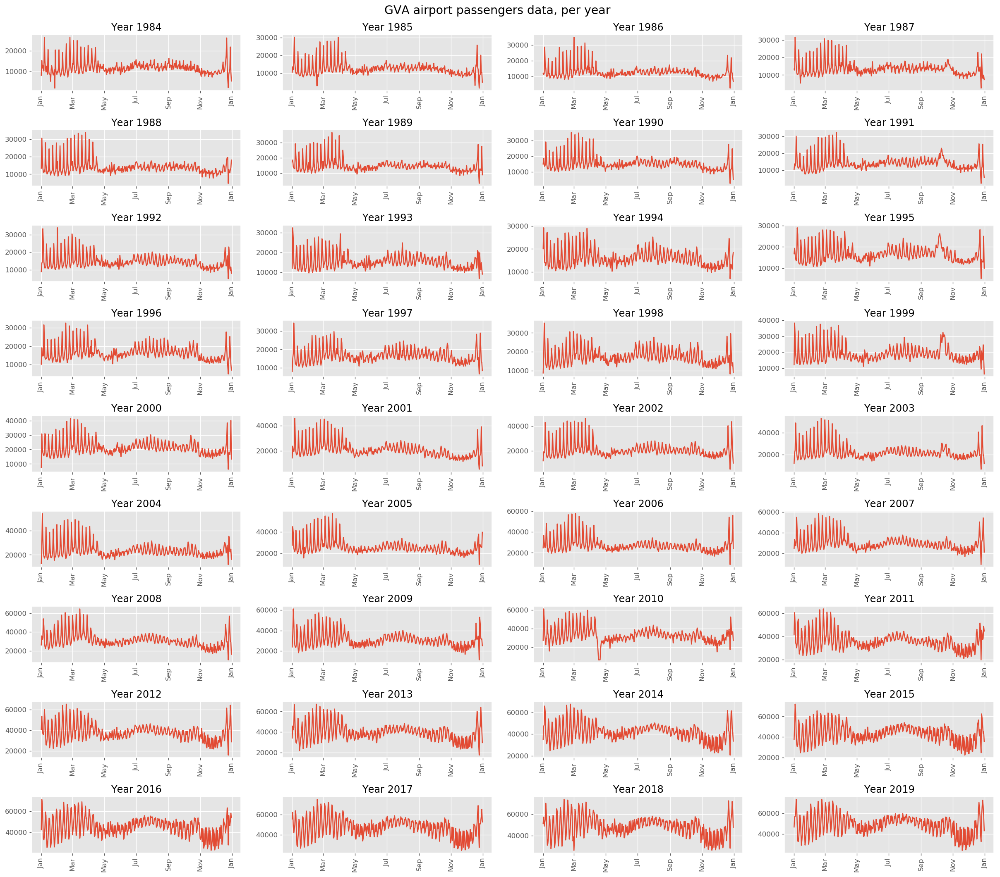

In [486]:
plotdatapassengers2(data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'], iata_code='GVA')

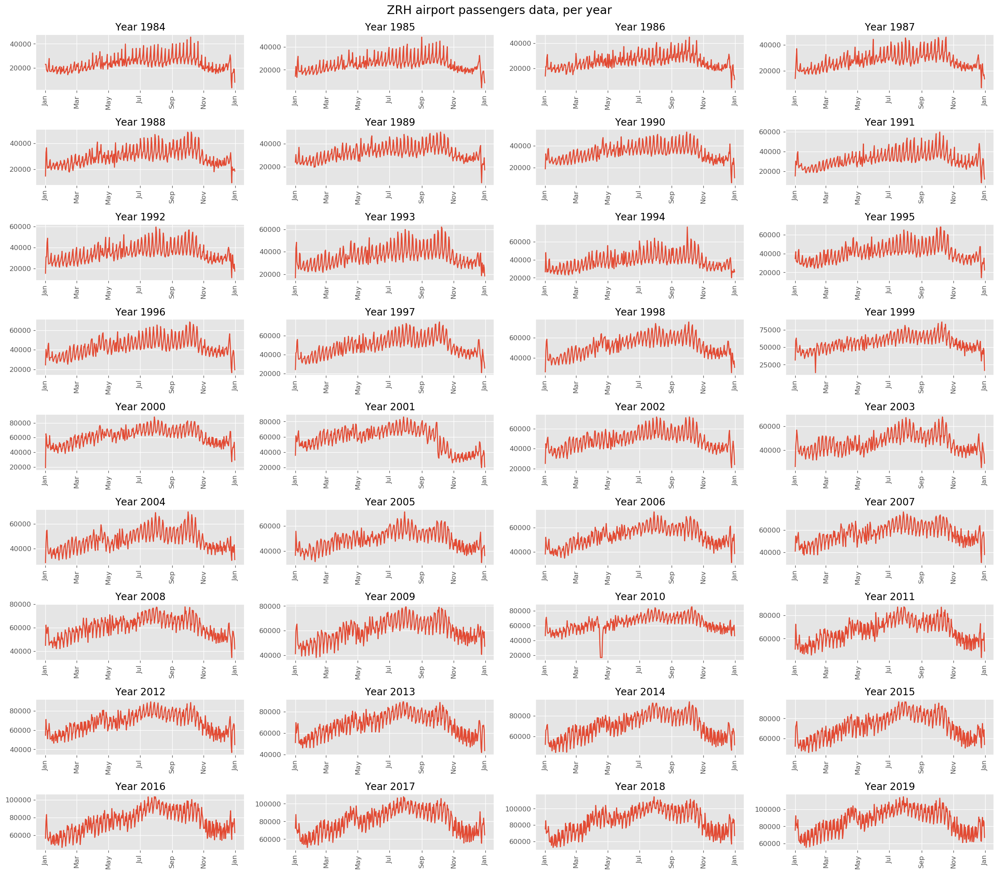

In [487]:
plotdatapassengers2(data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'], iata_code='ZRH')

**Comment**
> This might come a bit as a surprise, but each airport has its own specific trend and seasonality.
- EAP seems to exhibit a summer seasonality patern
- GVA exhibits more volatility in the first quarter
- ZRH exhibits an uptrend for the first half of the year followed by a downtrend

#### 2.3.7.3 Plotting now the decomposition of the time series.

#### 2.3.7.3.1 Seasonal decomposition

**Additive model**

EAP airport
Frequency infered from the dataset : D


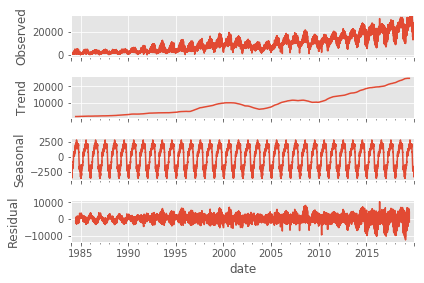

In [488]:
# seasonal decomposition, per airport
# additive model

import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose

print('EAP airport')

#Checking the inferred frequency of the index
print('Frequency infered from the dataset : {}'.format(data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'].index.inferred_freq))

# automatic patterns check with seasonal_decompose from statsmodels
decomp = seasonal_decompose(data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'], model='additive', freq=365)
decomp.plot()
plt.savefig('EAP_passengers_decomp_add.png')

GVA airport
Frequency infered from the dataset : D


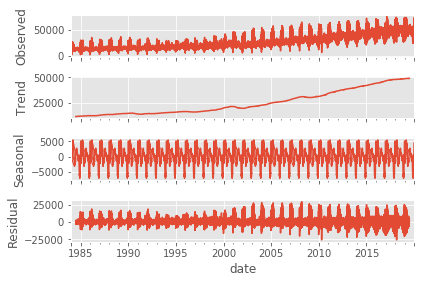

In [489]:
print('GVA airport')

#Checking the inferred frequency of the index
print('Frequency infered from the dataset : {}'.format(data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'].index.inferred_freq))

# automatic patterns check with seasonal_decompose from statsmodels
decomp = seasonal_decompose(data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'], model='additive', freq=365)
decomp.plot()
plt.savefig('GVA_passengers_decomp_add.png')

ZRH airport
Frequency infered from the dataset : D


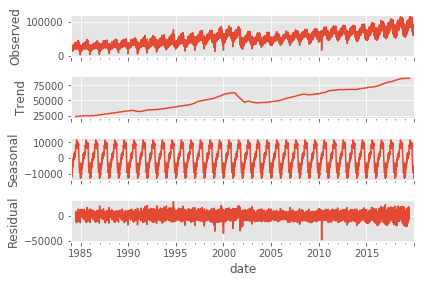

In [490]:
print('ZRH airport')

#Checking the inferred frequency of the index
print('Frequency infered from the dataset : {}'.format(data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'].index.inferred_freq))

# automatic patterns check with seasonal_decompose from statsmodels
decomp = seasonal_decompose(data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'], model='additive', freq=365)
decomp.plot()
plt.savefig('ZRH_passengers_decomp_add.png')

**Multiplicative model**

EAP airport


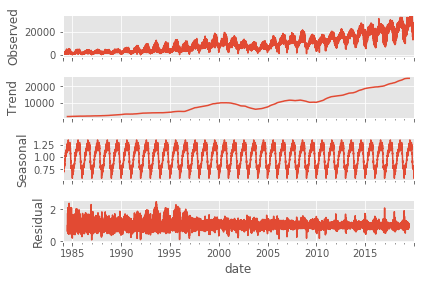

In [491]:
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose

print('EAP airport')
decomp_mul = seasonal_decompose(data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'], model='multiplicative', freq=365)
decomp_mul.plot()
plt.savefig('EAP_passengers_decomp_multi.png')

GVA airport


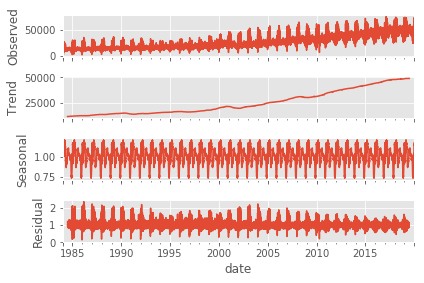

In [492]:
print('GVA airport')
decomp_mul = seasonal_decompose(data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'], model='multiplicative', freq=365)
decomp_mul.plot()
plt.savefig('GVA_passengers_decomp_multi.png')

ZRH airport


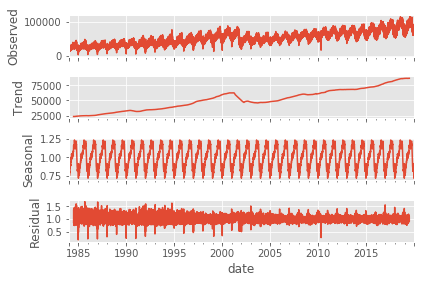

In [493]:
print('ZRH airport')
decomp_mul = seasonal_decompose(data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'], model='multiplicative', freq=365)
decomp_mul.plot()
plt.savefig('ZRH_passengers_decomp_multi.png')

Seasonal decomposition with a plot showing the absolute value per year. This plot is showing whether there are trends for some specific periods or months which appear every year.

In [494]:
# creating three new columns in order to have a separation between the month and the year.
# there's also an added column for the number of the month, used to sort the month by ascending order.

data_ofac_cleaned['year'] = [d.year for d in data_ofac_cleaned.index]
data_ofac_cleaned['month'] = [d.strftime('%b') for d in data_ofac_cleaned.index]
data_ofac_cleaned['month_nb'] = [d.strftime('%m') for d in data_ofac_cleaned.index]

# creating three new columns in order to have a separation between the month and the year.
# there's also an added column for the number of the month, used to sort the month by ascending order.

#GVA_dly['year'] = [d.year for d in GVA_dly.index]
#GVA_dly['month'] = [d.strftime('%b') for d in GVA_dly.index]
#GVA_dly['month_nb'] = [d.strftime('%m') for d in GVA_dly.index]

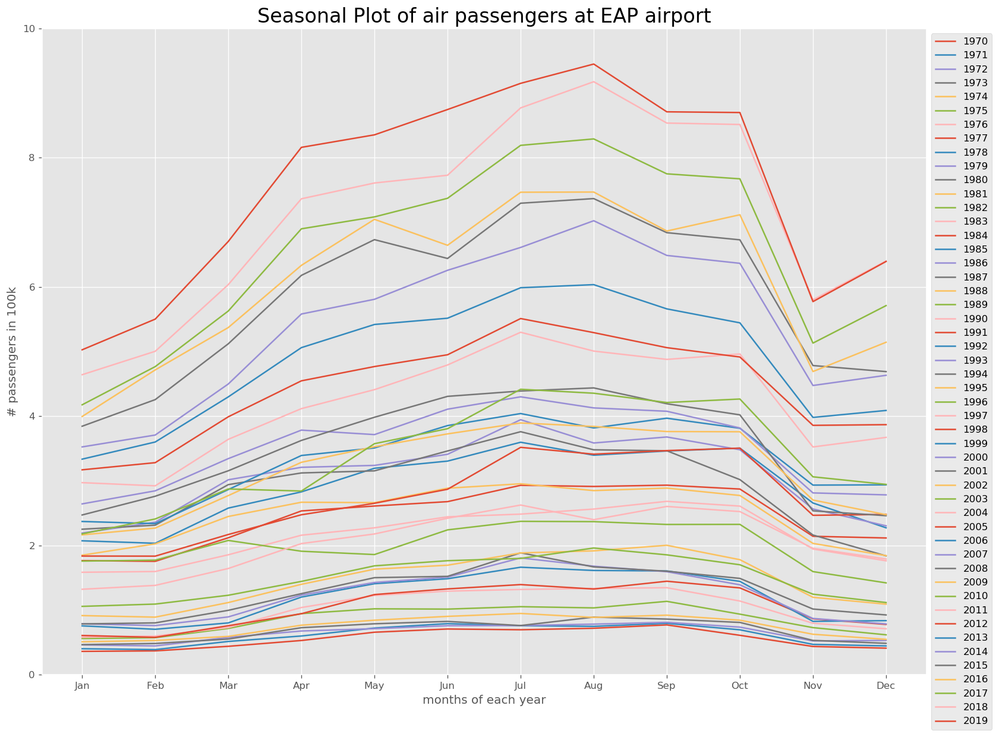

In [495]:
grouped_eap = data_ofac_cleaned.groupby(['year', 'month', 'month_nb']).sum()
grouped_eap = pd.DataFrame(grouped_eap).reset_index()
grouped_eap.sort_values(by=['year', 'month_nb'], inplace=True)

year = grouped_eap['year'].unique()

plt.figure(figsize=(16,12), dpi=120)

for i in year:
    a=grouped_eap[grouped_eap.year==i]
    plt.plot(a.month, a['EAP']/100000, label=i)

plt.ylim(0, 10)
plt.title("Seasonal Plot of air passengers at EAP airport", fontsize=20)
plt.xlabel("months of each year")
plt.ylabel("# passengers in 100k")
plt.legend(bbox_to_anchor=(1, 1.1, -0.1, -0.1), loc=2)
plt.show()

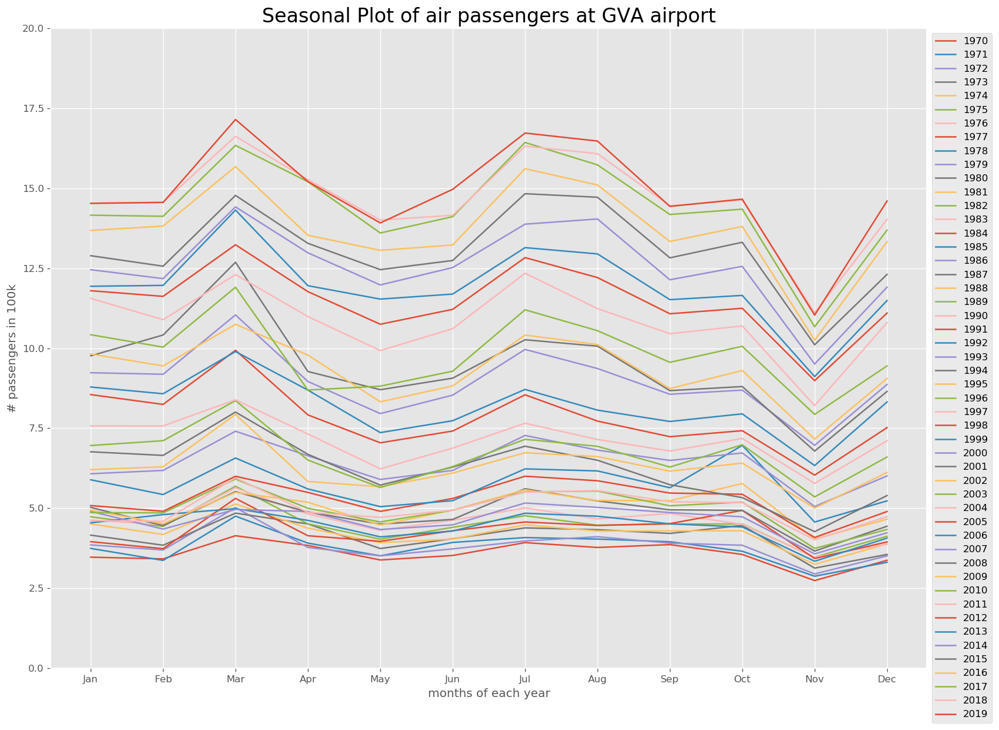

In [496]:
grouped_gva = data_ofac_cleaned.groupby(['year', 'month', 'month_nb']).sum()
grouped_gva = pd.DataFrame(grouped_gva).reset_index()
grouped_gva.sort_values(by=['year', 'month_nb'], inplace=True)

year = grouped_gva['year'].unique()

plt.figure(figsize=(16,12), dpi=120)

for i in year:
    a=grouped_gva[grouped_gva.year==i]
    plt.plot(a.month, a['GVA']/100000, label=i)

plt.ylim(0, 20)
plt.title("Seasonal Plot of air passengers at GVA airport", fontsize=20)
plt.xlabel("months of each year")
plt.ylabel("# passengers in 100k")
plt.legend(bbox_to_anchor=(1, 1.1, -0.1, -0.1), loc=2)
plt.show()

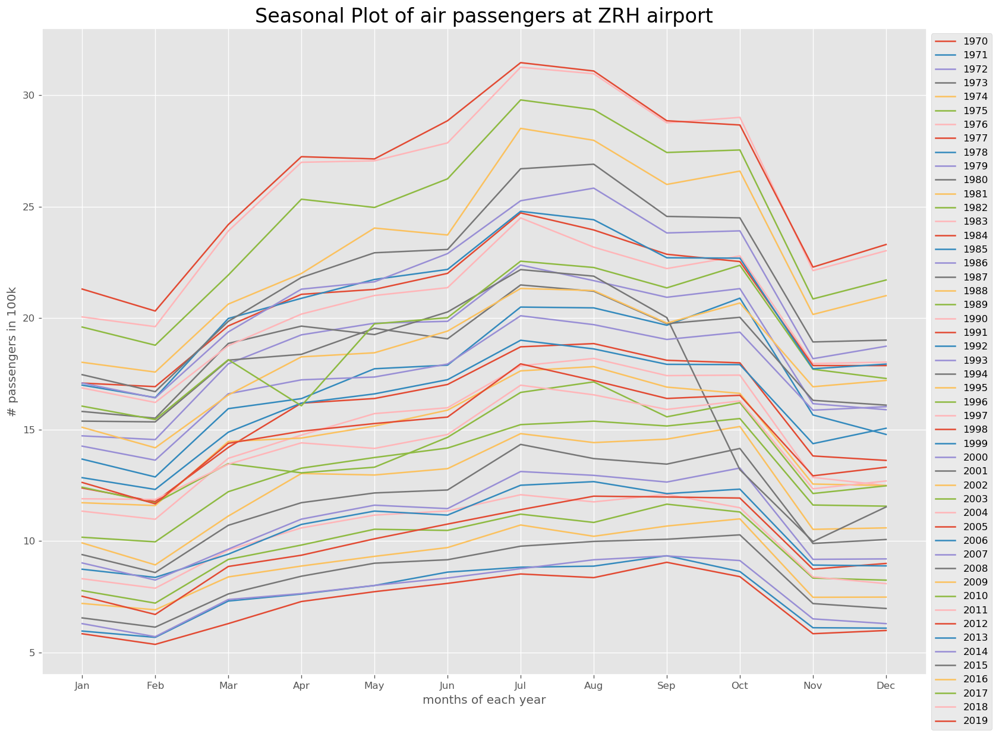

In [497]:
grouped_zrh = data_ofac_cleaned.groupby(['year', 'month', 'month_nb']).sum()
grouped_zrh = pd.DataFrame(grouped_zrh).reset_index()
grouped_zrh.sort_values(by=['year', 'month_nb'], inplace=True)

year = grouped_zrh['year'].unique()

plt.figure(figsize=(16,12), dpi=120)

for i in year:
    a=grouped_zrh[grouped_zrh.year==i]
    plt.plot(a.month, a['ZRH']/100000, label=i)

plt.ylim(4, 33)
plt.title("Seasonal Plot of air passengers at ZRH airport", fontsize=20)
plt.xlabel("months of each year")
plt.ylabel("# passengers in 100k")
plt.legend(bbox_to_anchor=(1, 1.1, -0.1, -0.1), loc=2)
plt.show()

**Comment**

> EAP airport shows strong seasonality  :  
- Up trend from april until august/september, then slowing down.
- This seems to indicate a bias toward holiday passengers.
- The uptrend from february/march could be attributed to Baselworld, the internation watch tradefair.

> As expected, GVA airport shows strong seasonality during four distinct periods/seasons :  
- During the months of february to end march there is a sharp increase of the number of passengers, which can be attributed to the ski season  
- During the summer holiday season the number of passengers is increasing as well  
- October shows a slight gain due to the school holiday  
- Year end see also a sharp increase of the passengers.  
- On the other side, the months of may, june and november are clearly the low season for the airport.

> ZRH airport shows strong seasonality  :  
- Low months from november to february
- uptrend from march/april until september

Let's now plot each month with a boxplot in order to validate the interpretation of the data.

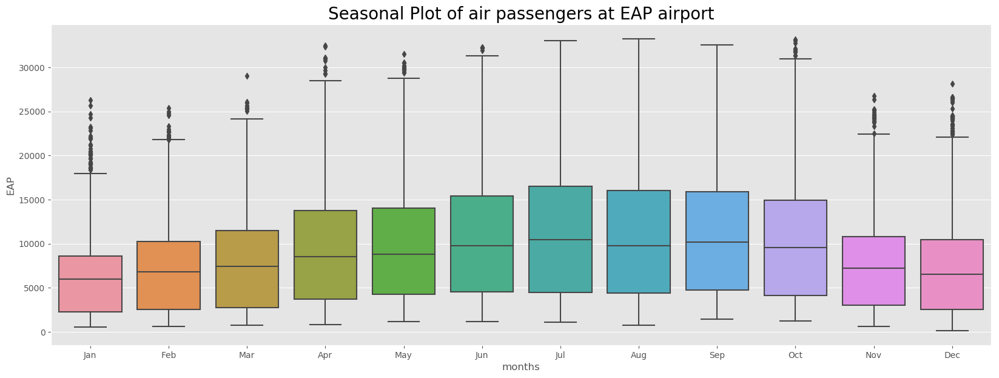

In [498]:
# box-plot summarizing the distribution of months

year = data_ofac_cleaned['year'].loc['1984-01-01':'2019-12-31'].unique()

plt.figure(figsize=(20,7), dpi=100)
sns.boxplot(x=data_ofac_cleaned.month, y=data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'], data=data_ofac_cleaned)

plt.title("Seasonal Plot of air passengers at EAP airport", fontsize=20)
plt.xlabel("months")
plt.show()

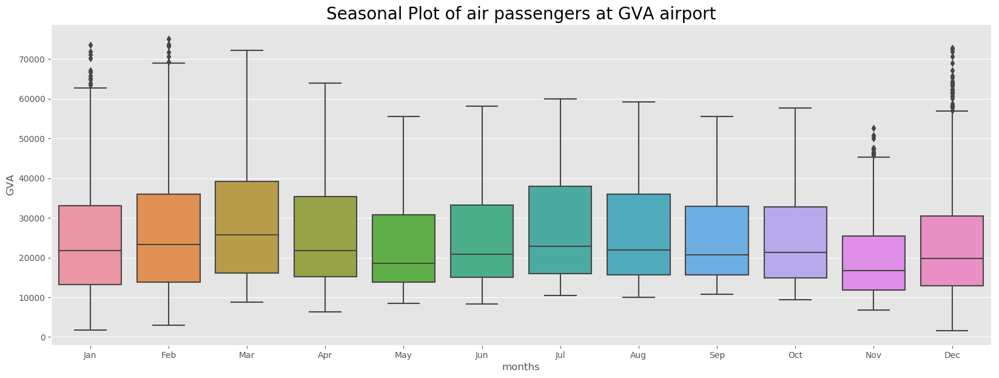

In [499]:
# box-plot summarizing the distribution of months

year = data_ofac_cleaned['year'].loc['1984-01-01':'2019-12-31'].unique()

plt.figure(figsize=(20,7), dpi=100)
sns.boxplot(x=data_ofac_cleaned.month, y=data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'], data=data_ofac_cleaned)

plt.title("Seasonal Plot of air passengers at GVA airport", fontsize=20)
plt.xlabel("months")
plt.show()

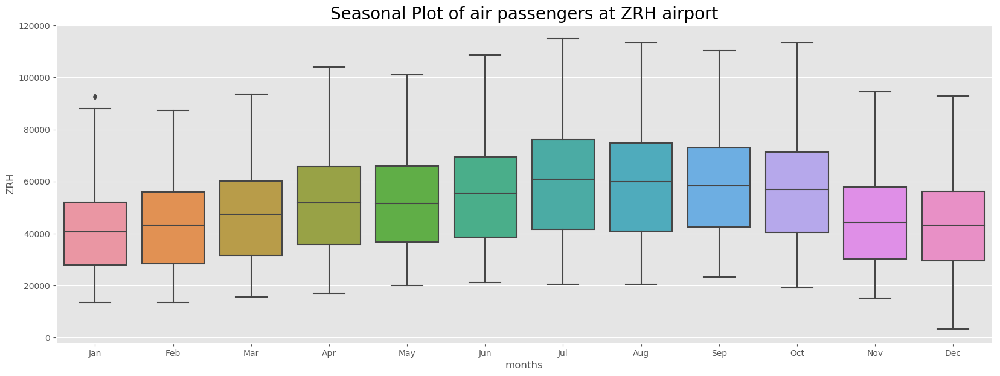

In [500]:
# box-plot summarizing the distribution of months

year = data_ofac_cleaned['year'].loc['1984-01-01':'2019-12-31'].unique()

plt.figure(figsize=(20,7), dpi=100)
sns.boxplot(x=data_ofac_cleaned.month, y=data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'], data=data_ofac_cleaned)

plt.title("Seasonal Plot of air passengers at ZRH airport", fontsize=20)
plt.xlabel("months")
plt.show()

**Comment**
>The plot confirm the precedent interpretation. March appears nonetheless to be the busiest month of the year. This can be understandable, as the ski season is still on as well as the Geneva Motor Show which seem to have a significant impact on the trafic.

**Seasonality VS forecast - what is the difference ?**
>Seasonality differs from a cyclical pattern in the way that seasonality is based in a fixed calendar freq, as opposed to the cycle, which is influenced by other factors such as the socio-economic factors.

#### 2.3.7.3.2 Plotting the number of air passengers with a two sided view, in order to have a clearer view of the growth

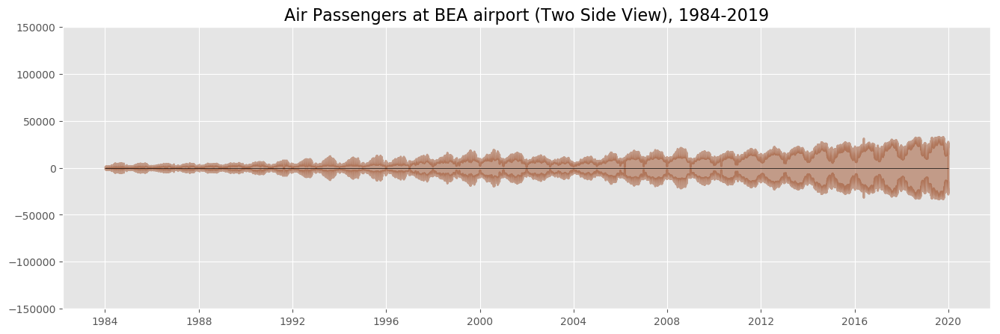

In [501]:
fig, ax = plt.subplots(1, 1, figsize=(16,5), dpi= 100)
x=data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'].index.values
y1=data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'].values
plt.fill_between(x, y1=y1, y2=-y1, alpha=0.5, linewidth=2, color='sienna')
plt.ylim(-150000, 150000)
plt.title('Air Passengers at BEA airport (Two Side View), 1984-2019', fontsize=16)
plt.hlines(y=0, xmin=np.min(data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'].index), xmax=np.max(data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'].index), linewidth=.5)
plt.show()

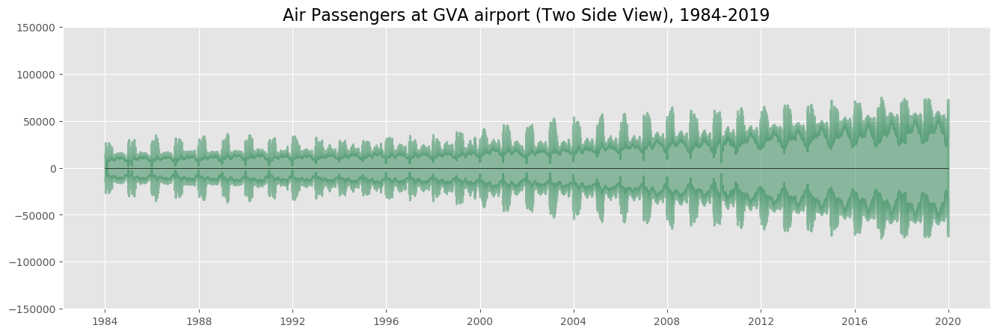

In [502]:
fig, ax = plt.subplots(1, 1, figsize=(16,5), dpi= 100)
x=data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'].index.values
y1=data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'].values
plt.fill_between(x, y1=y1, y2=-y1, alpha=0.5, linewidth=2, color='seagreen')
plt.ylim(-150000, 150000)
plt.title('Air Passengers at GVA airport (Two Side View), 1984-2019', fontsize=16)
plt.hlines(y=0, xmin=np.min(data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'].index), xmax=np.max(data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'].index), linewidth=.5)
plt.show()

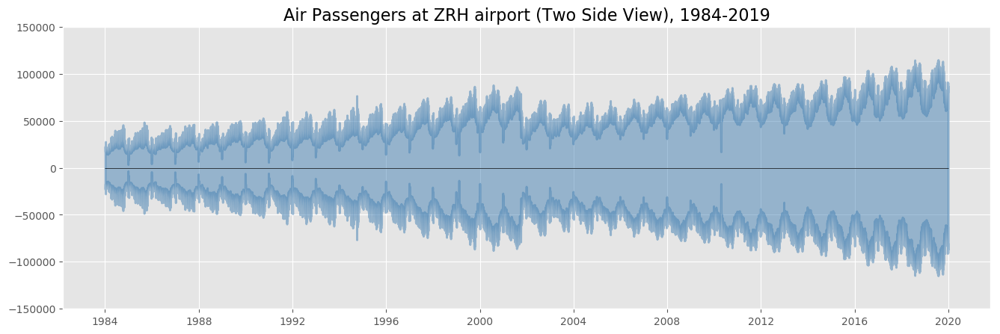

In [503]:
fig, ax = plt.subplots(1, 1, figsize=(16,5), dpi= 100)
x=data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'].index.values
y1=data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'].values
plt.fill_between(x, y1=y1, y2=-y1, alpha=0.5, linewidth=2, color='steelblue')
plt.ylim(-150000, 150000)
plt.title('Air Passengers at ZRH airport (Two Side View), 1984-2019', fontsize=16)
plt.hlines(y=0, xmin=np.min(data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'].index), xmax=np.max(data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'].index), linewidth=.5)
plt.show()

**Comment**
> Plotting the raw data with two side view charts, as all the values are positive, to emphasize the already detected growth.

#### 2.3.7.4 Let's now plot the series with the boundaries based on the standard deviation

In [504]:
"""Function to calculate and plot the boundaries for outliers based on the standard deviation
    Inputs : 
        df = dataframe
        iata = airport's iata code
        sigma = number of standard deviations
"""
def find_outliers_subplots2(df, iata, sigma):

    nb = np.arange(1,(df.index.max().year-df.index.min().year)+2,1)
    yr = df.index.min().year
    
    plt.figure(figsize=(30,20), dpi=120)
    plt.subplots_adjust(hspace=0.8, wspace=0.1)
    
    for n in nb:  #looping over the year

        data = df.loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))]
        data_std = data.std()
        data_mean = data.mean()
        cutoff = sigma * data_std

        limit_high = (data_mean + cutoff)
        limit_low = (data_mean - cutoff)
        
        plt.subplot(9,4,n)
        plt.xticks(rotation=90)
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b'))

        plt.plot(df.loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))], label='passengers', alpha=0.7, color='sienna')
        plt.plot(df.loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))].rolling(window=200).mean(), marker='.', color='olivedrab', linewidth=2, alpha=1, label='200d MA')
        plt.plot(df.loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))].ewm(span=200, adjust=False).mean(), marker=',', color='darkolivegreen', linewidth=2, alpha=1, label='200d EMA')

        plt.axhline(y=limit_high, color='firebrick', linestyle='-.')
        plt.axhline(y=limit_low, color='firebrick', linestyle='-.')
        plt.axhline(y=data_mean, color='tomato', linestyle='-.')
    
        plt.title('Year {}'.format(yr))
        
        yr = yr+1

    plt.subplots_adjust(top=0.95)
    plt.suptitle('{} airport passengers data, per year, based on {} std dev'.format(iata, sigma), verticalalignment='top', fontsize=17)
    plt.show()

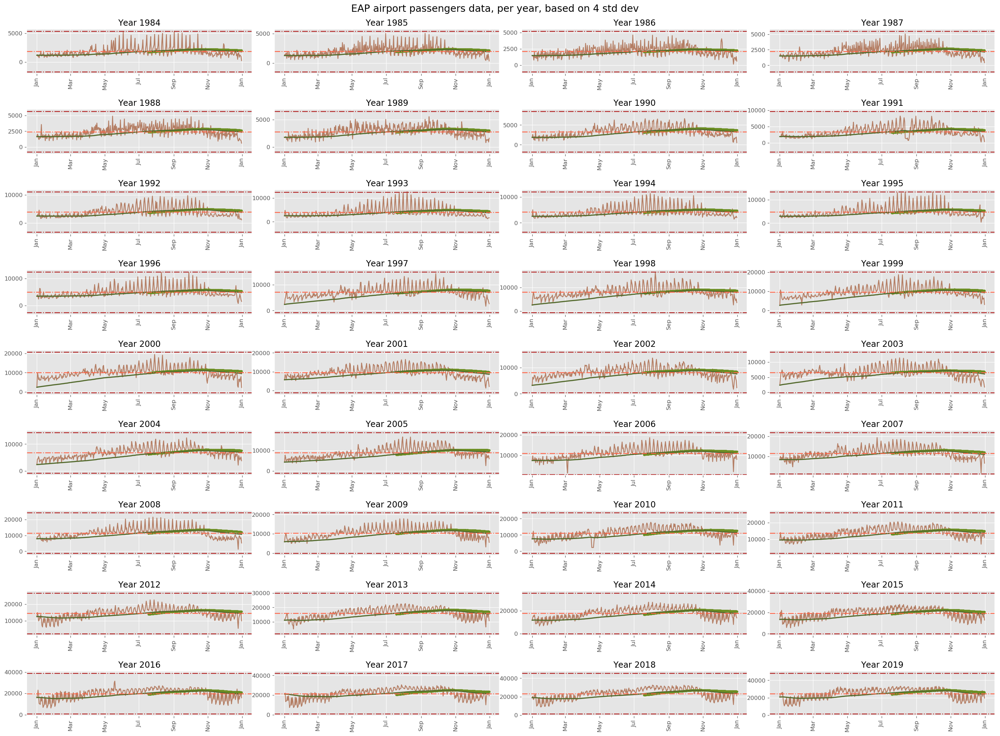

In [505]:
find_outliers_subplots2(data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'],iata='EAP', sigma=4)

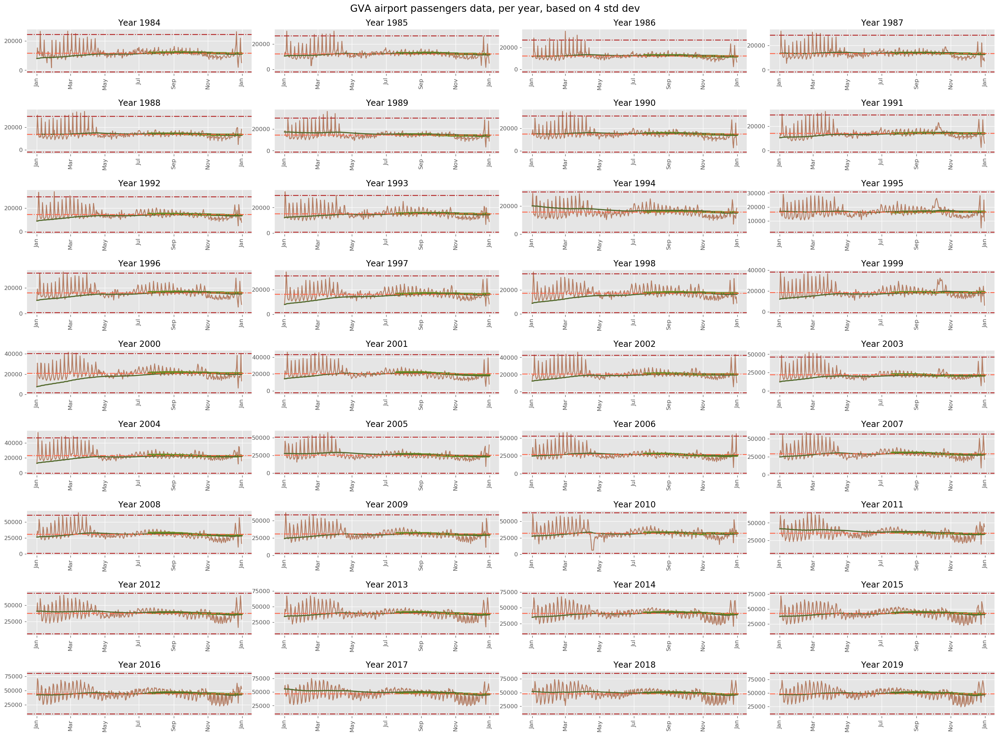

In [506]:
find_outliers_subplots2(data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'],iata='GVA', sigma=4)

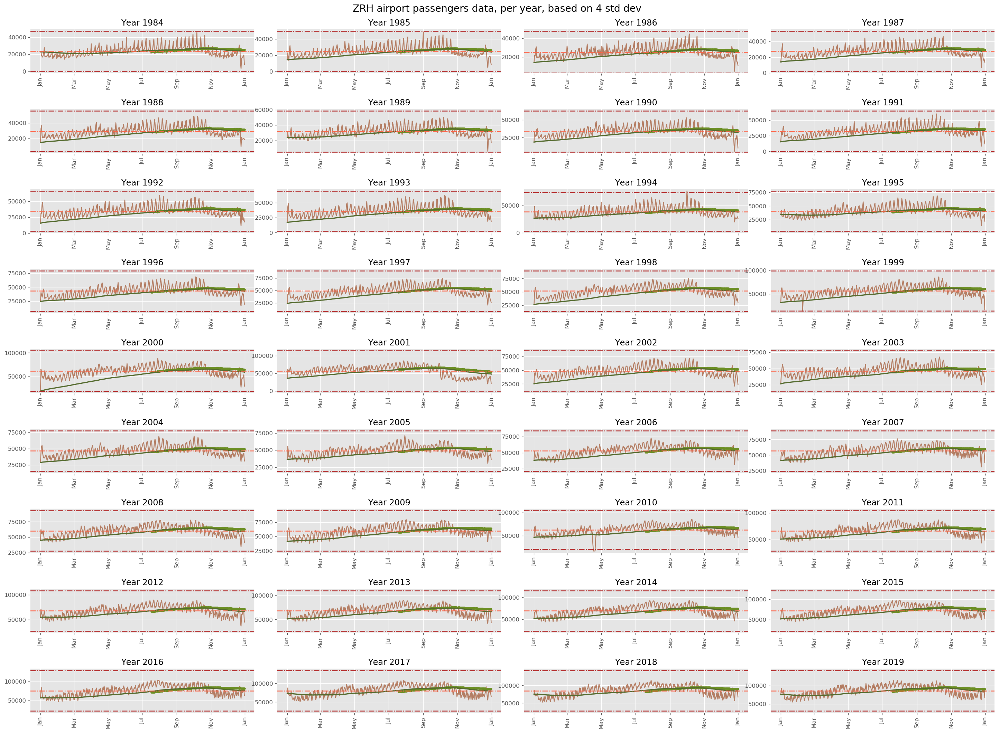

In [507]:
find_outliers_subplots2(data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'],iata='ZRH', sigma=4)

Let's plot specifically for a year

In [508]:
"""This function let's you plot a specific year with the boudaries based on the number of standard deviations.

It can be used to i) detect outliers ii) to have a clearer view of a specific year.
The function will also plot a moving average and an exponential moving average.

The input for the function are :
    df = the dataframe
    yr = the year requested
    iata = airport's iata code
    sigma = the number of standard deviation
"""

def find_outliers2(df, yr, iata, sigma):
    # identifying the specific year and sticking the data into a dataframe called data
    data = df.loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))]
    data_std = data.std()  #calculating the standard deviation
    data_mean = data.mean() #calculating the mean
    cutoff = sigma * data_std #calculating the cutoff, which means the number of standard deviation multiplied by their values

    # setting the limit high and low
    limit_high = (data_mean + cutoff)
    limit_low = (data_mean - cutoff)

    print('mean            : {}'.format(int(data_mean)))
    print('std dev         : {}'.format(int(data_std)))
    print('mean + {} sigma  : {}'.format(sigma, int(limit_high)))
    print('mean - {} sigma  : {}'.format(sigma, int(limit_low)))
    
    # plot
    plt.figure(figsize=(20,10), dpi=120)

    # ploting the year and its moving averages
    plt.plot(df.loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))], label='passengers', alpha=0.7, color='sienna')
    plt.plot(df.loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))].rolling(window=200).mean(), marker='.', color='olivedrab', linewidth=2, alpha=1, label='200d MA')
    plt.plot(df.loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))].ewm(span=200, adjust=False).mean(), marker=',', color='darkolivegreen', linewidth=2, alpha=1, label='200d EMA')

    # ploting the lines
    plt.axhline(y=limit_high, color='firebrick', linestyle='-.')
    plt.axhline(y=limit_low, color='firebrick', linestyle='-.')
    plt.axhline(y=data_mean, color='tomato', linestyle='-.')
    
    # indicating on the plot the different values
    plt.text(x = datetime.date(year=yr-1, month=12, day=20), y=limit_high, s='+{} sigma'.format(sigma), horizontalalignment='left', size='medium', color='black')
    plt.text(x = datetime.date(year=yr-1, month=12, day=20), y=limit_low, s='-{} sigma'.format(sigma), horizontalalignment='left', size='medium', color='black')
    plt.text(x = datetime.date(year=yr-1, month=12, day=20), y=data_mean, s='mean'.format(), horizontalalignment='left', size='medium', color='black')
    
    
    plt.title('{} airport - Year {} with {} sigma channel'.format(iata, yr, sigma))
    plt.legend()
    plt.show()

In [509]:
"""This function let's you plot a specific year with the boudaries based on the number of standard deviations.

It can be used to i) detect outliers ii) to have a clearer view of a specific year.
The function will also plot a moving average and an exponential moving average.

The input for the function are :
df = the dataframe
yr = the year requested
sigma = the number of standard deviation
"""

def find_outliers(df, yr, sigma):
    # identifying the specific year and sticking the data into a dataframe called data
    data = df.loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))].passengers
    data_std = data.std()  #calculating the standard deviation
    data_mean = data.mean() #calculating the mean
    cutoff = sigma * data_std #calculating the cutoff, which means the number of standard deviation multiplied by their values

    # setting the limit high and low
    limit_high = (data_mean + cutoff)
    limit_low = (data_mean - cutoff)

    print('mean            : {}'.format(int(data_mean)))
    print('std dev         : {}'.format(int(data_std)))
    print('mean + {} sigma  : {}'.format(sigma, int(limit_high)))
    print('mean - {} sigma  : {}'.format(sigma, int(limit_low)))
    
    # plot
    plt.figure(figsize=(20,10), dpi=120)

    # ploting the year and its moving averages
    plt.plot(df.loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))].passengers, label='passengers', alpha=0.7, color='sienna')
    plt.plot(df.loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))].passengers.rolling(window=200).mean(), marker='.', color='olivedrab', linewidth=2, alpha=1, label='200d MA')
    plt.plot(df.loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))].passengers.ewm(span=200, adjust=False).mean(), marker=',', color='darkolivegreen', linewidth=2, alpha=1, label='200d EMA')

    # ploting the lines
    plt.axhline(y=limit_high, color='firebrick', linestyle='-.')
    plt.axhline(y=limit_low, color='firebrick', linestyle='-.')
    plt.axhline(y=data_mean, color='tomato', linestyle='-.')
    
    # indicating on the plot the different values
    plt.text(x = datetime.date(year=yr-1, month=12, day=20), y=limit_high, s='+{} sigma'.format(sigma), horizontalalignment='left', size='medium', color='black')
    plt.text(x = datetime.date(year=yr-1, month=12, day=20), y=limit_low, s='-{} sigma'.format(sigma), horizontalalignment='left', size='medium', color='black')
    plt.text(x = datetime.date(year=yr-1, month=12, day=20), y=data_mean, s='mean'.format(), horizontalalignment='left', size='medium', color='black')
    
    
    plt.title('{} airport - Year {} with {} sigma channel'.format(GVA_dly.airport.unique()[0], yr, sigma))
    plt.legend()
    plt.show()

Plotting the year 2019 based on 4 standard deviations.

In [510]:
#find_outliers2(data_ofac_cleaned['GVA'].loc['2009-01-01':'2009-12-31'], 2019, iata='GVA', sigma=3)

#### 2.3.7.4.1 Calculating the numbers of outliers

In [511]:
# CALCULATING THE NUMBER OF OUTLIERS BASED ON THE STANDARD DEVIATION, PER YEAR

"""This function let's you calcule the number of outliers based on the standard deviation.
    Inputs :
        df = dataframe
        sigma = number of standard deviations
    The function takes as an input the dataframe and the number of sigma used to detect the outliers.
"""

def find_outliers_count2(df, sigma):
    print('...using {} sigma deviation'.format(sigma))
    
    # generating the number of years included in the dataframe
    nb = np.arange(1,(df.index.max().year-df.index.min().year)+2,1)
    yr = df.index.min().year # initialising the first year detected in the dataframe

    temp111 = []  # preparing an empty array which will store the outliers per year
    outl = pd.DataFrame()  # preparing an empty dataframe which will store the outliers for all the years
    for n in nb:  #looping over the year

        data = df.loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))]
        data_std = data.std()  # standard deviation 
        data_mean = data.mean() # mean of the data
        cutoff = sigma * data_std # cut-off

        # setting the limit high and low
        limit_high = (data_mean + cutoff).astype(int)
        limit_low = (data_mean - cutoff).astype(int)        
    
        temp_data = (data[data > limit_high]) # storing the outliers for the current year
        temp111.append(temp_data)
        yr = yr+1 # next year
    outl = pd.concat(temp111)
    outl = pd.DataFrame(outl) # the function will then concatenate all the years and transforming it into a dataframe
    return outl.count()

Using the functions to detect the number of outliers :

In [512]:
find_outliers_count2(data_ofac_cleaned['EAP'], 3)

...using 3 sigma deviation


EAP    98
dtype: int64

In [513]:
find_outliers_count2(data_ofac_cleaned['GVA'], 3)

...using 3 sigma deviation


GVA    290
dtype: int64

In [514]:
find_outliers_count2(data_ofac_cleaned['ZRH'], 3)

...using 3 sigma deviation


ZRH    27
dtype: int64

#### 2.3.7.4.2 Replacing the outliers

The data seems to have outliers. These outliers are not any error on the data, as these were already corrected previously. These outliers are just large values. In order to have a more robut model, these outliers will be replaced by the maximum value 

In [515]:
# REPLACING THE OUTLIERS WITH THE MAXIMUM VALUE BASED ON SIGMA
    
nb = np.arange(1,(data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'].index.max().year-data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'].index.min().year)+2,1)
yr = data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'].index.min().year

temp222 = []
outl = pd.DataFrame()

for n in nb:  #looping over the year

    data = data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'].loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))]
    data_std = data.std()
    data_mean = data.mean()
    cutoff = 3 * data_std

    limit_high = (data_mean + cutoff).astype(int)
    limit_low = (data_mean - cutoff).astype(int)

    data[data > limit_high] = limit_high

    temp222.append(data)
    
    yr = yr+1

df_clean = pd.concat(temp222)
df_clean = pd.DataFrame(df_clean)

In [516]:
# REPLACING THE OUTLIERS WITH THE MAXIMUM VALUE BASED ON SIGMA
    
nb = np.arange(1,(data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'].index.max().year-data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'].index.min().year)+2,1)
yr = data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'].index.min().year

temp222 = []
outl = pd.DataFrame()

for n in nb:  #looping over the year

    data = data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'].loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))]
    data_std = data.std()
    data_mean = data.mean()
    cutoff = 3 * data_std

    limit_high = (data_mean + cutoff).astype(int)
    limit_low = (data_mean - cutoff).astype(int)

    data[data > limit_high] = limit_high
    data[data < limit_low] = limit_low

    temp222.append(data)
    
    yr = yr+1

df_clean = pd.concat(temp222)
df_clean = pd.DataFrame(df_clean)

In [517]:
# REPLACING THE OUTLIERS WITH THE MAXIMUM VALUE BASED ON SIGMA
    
nb = np.arange(1,(data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'].index.max().year-data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'].index.min().year)+2,1)
yr = data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'].index.min().year

temp222 = []
outl = pd.DataFrame()

for n in nb:  #looping over the year

    data = data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'].loc[datetime.date(year=yr, month=1, day=1):(datetime.date(year=yr, month=12, day=31))]
    data_std = data.std()
    data_mean = data.mean()
    cutoff = 3 * data_std

    limit_high = (data_mean + cutoff).astype(int)
    limit_low = (data_mean - cutoff).astype(int)

    data[data > limit_high] = limit_high

    temp222.append(data)
    
    yr = yr+1

df_clean = pd.concat(temp222)
df_clean = pd.DataFrame(df_clean)

mean            : 32290
std dev         : 7403
mean + 3 sigma  : 54500
mean - 3 sigma  : 10080


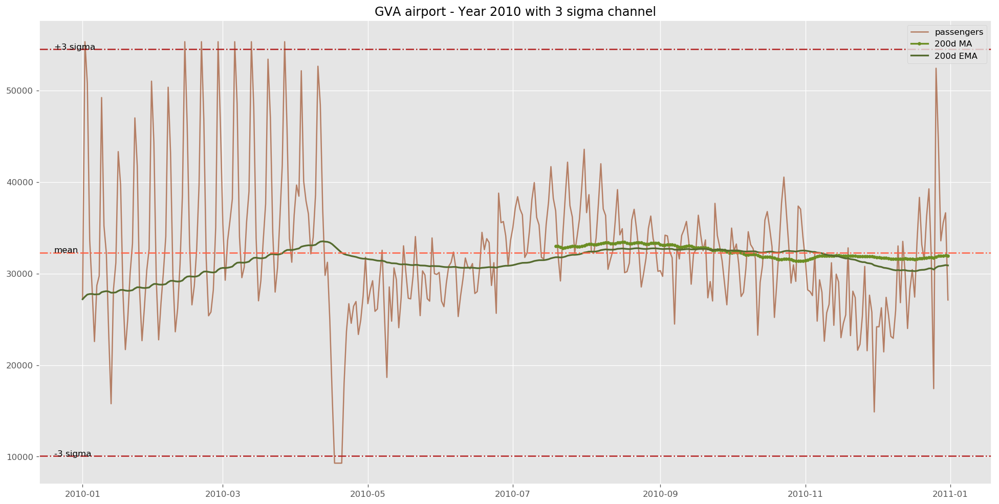

In [518]:
find_outliers2(data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'], 2010, iata='GVA', sigma=3)

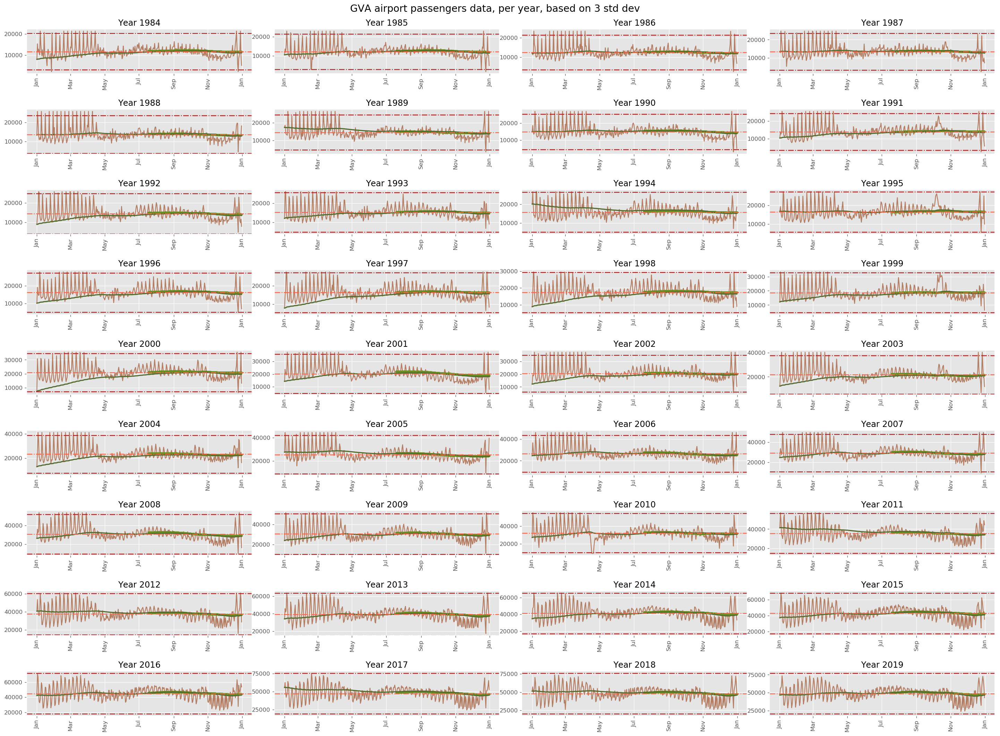

In [519]:
find_outliers_subplots2(data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'],iata='GVA', sigma=3)

## 2.4 Analysing the stationarity of the series
### 2.4.1 Trend - the serie is not stationary

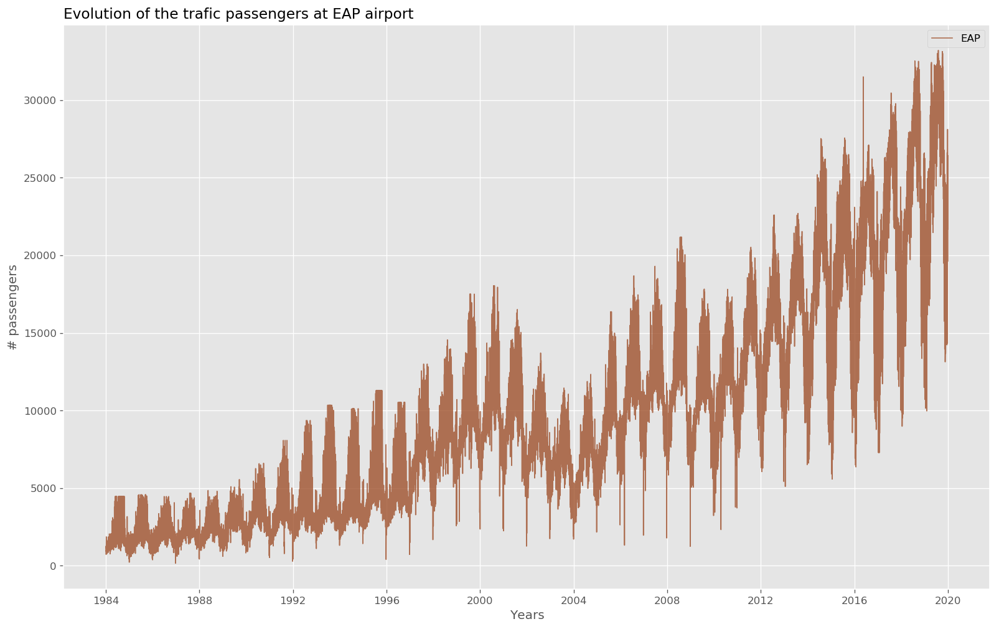

In [520]:
# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=120)

# setting the x axis
x = data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'].index

plt.plot(x, data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'], marker='', color='sienna', linewidth=1, alpha=0.8)

# Add titles & legend
plt.title("Evolution of the trafic passengers at EAP airport", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

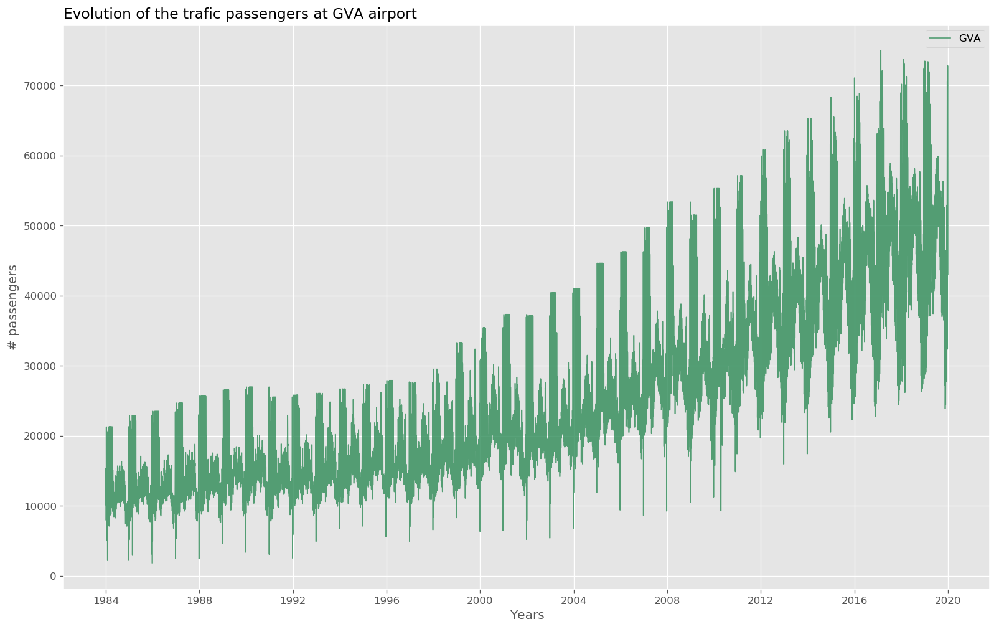

In [521]:
# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=120)

# setting the x axis
x = data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'].index

plt.plot(x, data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'], marker='', color='seagreen', linewidth=1, alpha=0.8)

# Add titles & legend
plt.title("Evolution of the trafic passengers at GVA airport", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

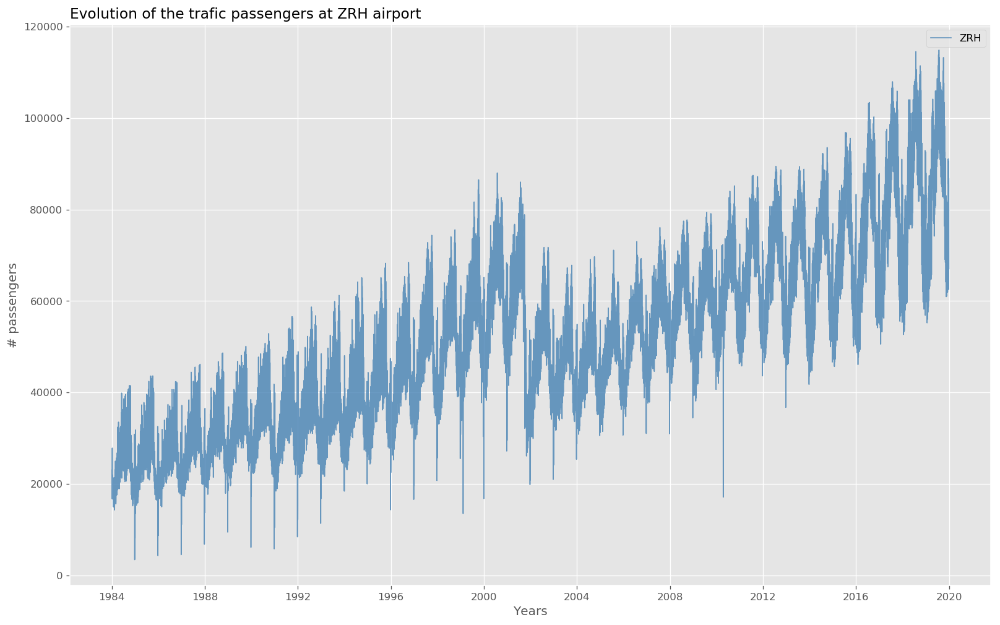

In [522]:
# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=120)

# setting the x axis
x = data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'].index

plt.plot(x, data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'], marker='', color='steelblue', linewidth=1, alpha=0.8)

# Add titles & legend
plt.title("Evolution of the trafic passengers at ZRH airport", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

**Comment**
>The plot indicates that the series is exhibiting a trend. 

Plotting the trend with a 12 months moving average :

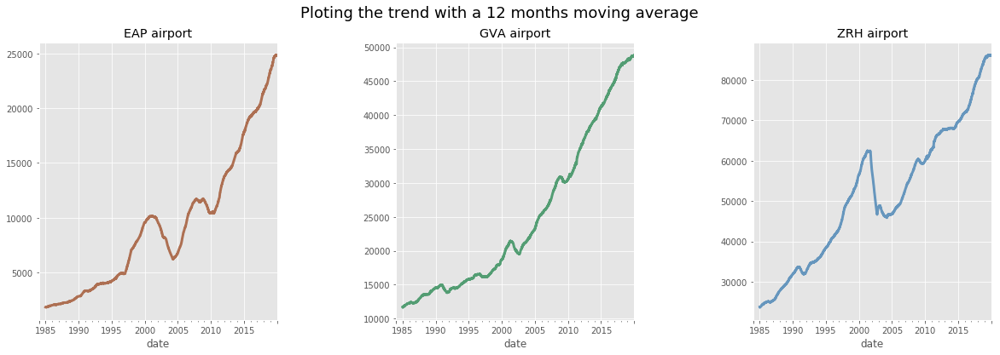

In [523]:
# plotting the trend for each airport with a 12months MA

plt.figure(figsize=(20,6))
plt.subplots_adjust(wspace=0.5)
plt.suptitle('Ploting the trend with a 12 months moving average', fontsize=18)

plt.subplot(1,3,1)
plt.title('EAP airport')
data_ofac_cleaned['EAP'].loc['1984-01-01':'2019-12-31'].rolling(365).mean().plot(linewidth=3, color='sienna', alpha=0.8)

plt.subplot(1,3,2)
plt.title('GVA airport')
data_ofac_cleaned['GVA'].loc['1984-01-01':'2019-12-31'].rolling(365).mean().plot(linewidth=3, color='seagreen', alpha=0.8)

plt.subplot(1,3,3)
plt.title('ZRH airport')
data_ofac_cleaned['ZRH'].loc['1984-01-01':'2019-12-31'].rolling(365).mean().plot(linewidth=3, color='steelblue', alpha=0.8)

plt.show()

**Comment**
>By ploting a 1 year moving average, which smoothes the data, we can clearly confirm the up trend. Why 12 months ? Because the data exhibit a yearly seasonality.

We'll now remove the trend by taking the first difference between the values. This can be done in two ways :  
- manually by substracting the latest value with the value shifted  
- using the function diff()  
The first solution has been implemented.

In [524]:
data_ofac_cleaned['FirstDifferenceEAP'] = data_ofac_cleaned['EAP'] - data_ofac_cleaned['EAP'].shift()
data_ofac_cleaned['FirstDifferenceGVA'] = data_ofac_cleaned['GVA'] - data_ofac_cleaned['GVA'].shift()
data_ofac_cleaned['FirstDifferenceZRH'] = data_ofac_cleaned['ZRH'] - data_ofac_cleaned['ZRH'].shift()

# which is equivalent to use the function diff()

Let's plot now the result.

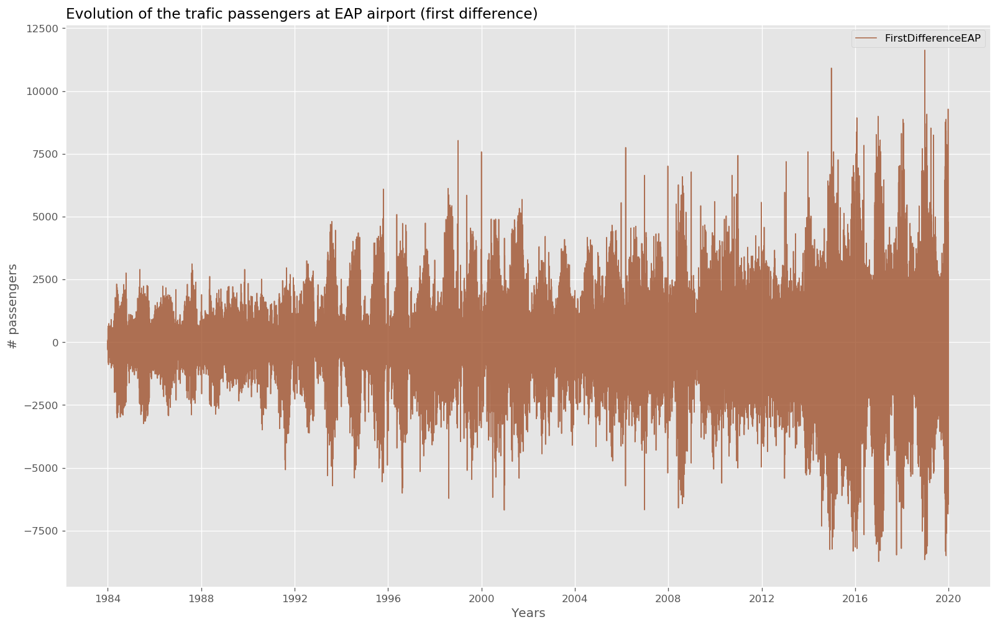

In [525]:
# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=120)

# setting the x axis
x = data_ofac_cleaned['FirstDifferenceEAP'].loc['1984-01-02':'2019-12-31'].index

plt.plot(x, data_ofac_cleaned['FirstDifferenceEAP'].loc['1984-01-02':'2019-12-31'],
         marker='', color='sienna', linewidth=1, alpha=0.8)

# Add titles & legend
plt.title("Evolution of the trafic passengers at EAP airport (first difference)", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

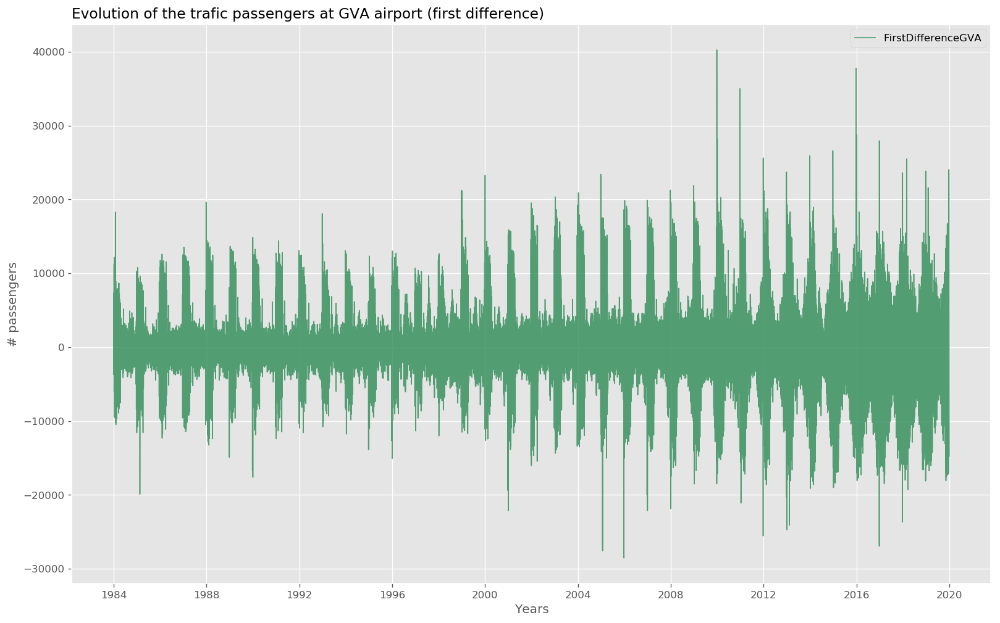

In [526]:
# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=120)

# setting the x axis
x = data_ofac_cleaned['FirstDifferenceGVA'].loc['1984-01-02':'2019-12-31'].index

plt.plot(x, data_ofac_cleaned['FirstDifferenceGVA'].loc['1984-01-02':'2019-12-31'],
         marker='', color='seagreen', linewidth=1, alpha=0.8)

# Add titles & legend
plt.title("Evolution of the trafic passengers at GVA airport (first difference)", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

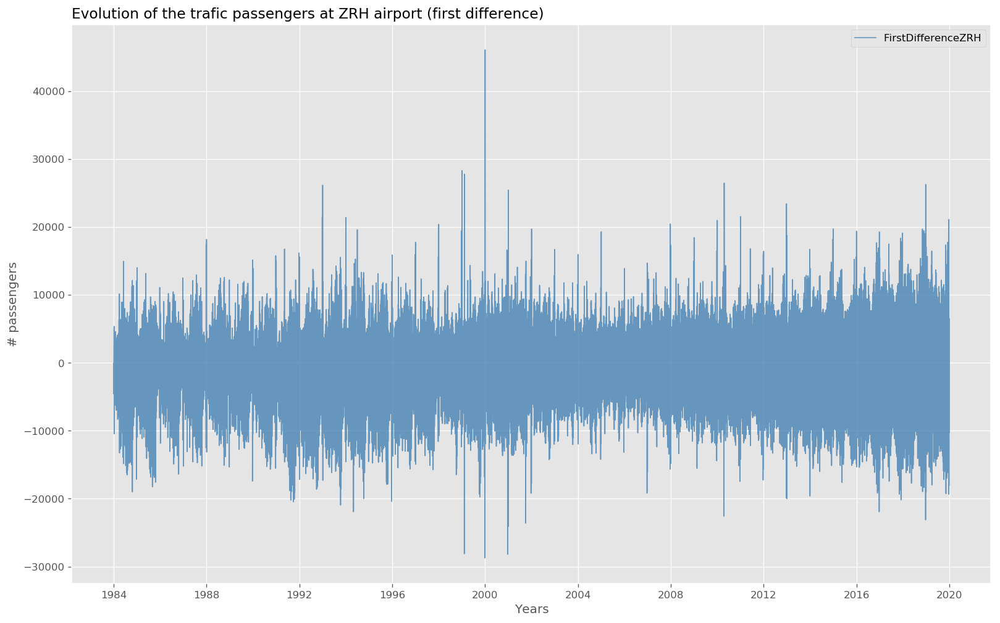

In [527]:
# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=120)

# setting the x axis
x = data_ofac_cleaned['FirstDifferenceZRH'].loc['1984-01-02':'2019-12-31'].index

plt.plot(x, data_ofac_cleaned['FirstDifferenceZRH'].loc['1984-01-02':'2019-12-31'],
         marker='', color='steelblue', linewidth=1, alpha=0.8)

# Add titles & legend
plt.title("Evolution of the trafic passengers at ZRH airport (first difference)", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

**Comment**
>By taking the first difference we can see that the trend has been removed.

### 2.4.2 Variance - the serie is not stationary

Let's now investigate the variance of the time series, to see if it is stationary. The data needs to have a kind of stationarity to be applied on models.
In order to make the data stationary, let's apply a log transform to the original series

In [528]:
data_ofac_cleaned['LogTransformEAP'] = data_ofac_cleaned['EAP'].apply(lambda x: np.log(x))
data_ofac_cleaned['LogTransformGVA'] = data_ofac_cleaned['GVA'].apply(lambda x: np.log(x))
data_ofac_cleaned['LogTransformZRH'] = data_ofac_cleaned['ZRH'].apply(lambda x: np.log(x))

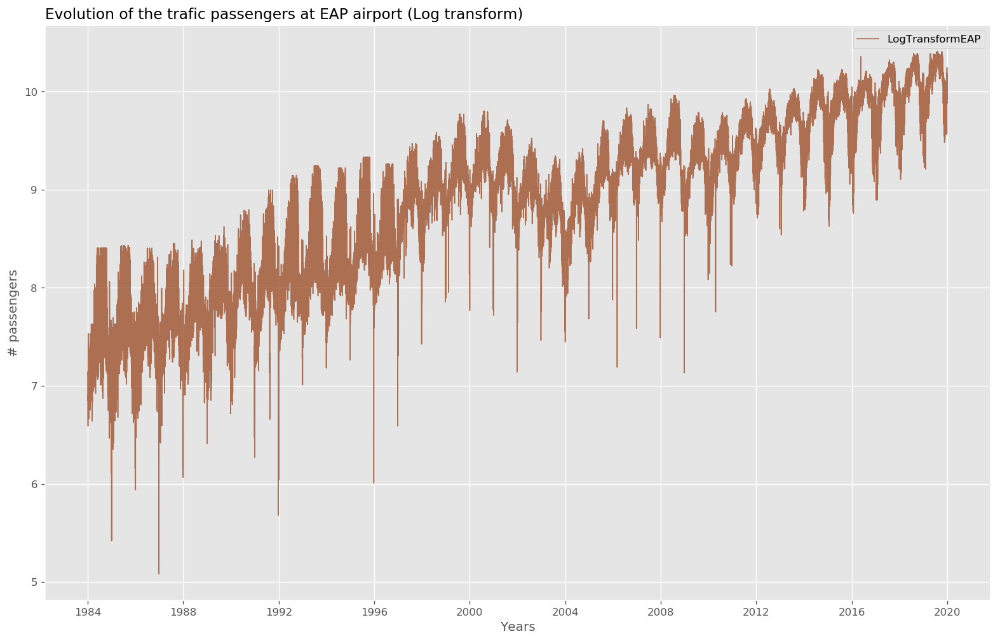

In [529]:
# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=120)

# setting the x axis
x = data_ofac_cleaned['LogTransformEAP'].loc['1984-01-02':'2019-12-31'].index

plt.plot(x, data_ofac_cleaned['LogTransformEAP'].loc['1984-01-02':'2019-12-31'], marker='', color='sienna', linewidth=1, alpha=0.8)

# Add titles & legend
plt.title("Evolution of the trafic passengers at EAP airport (Log transform)", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

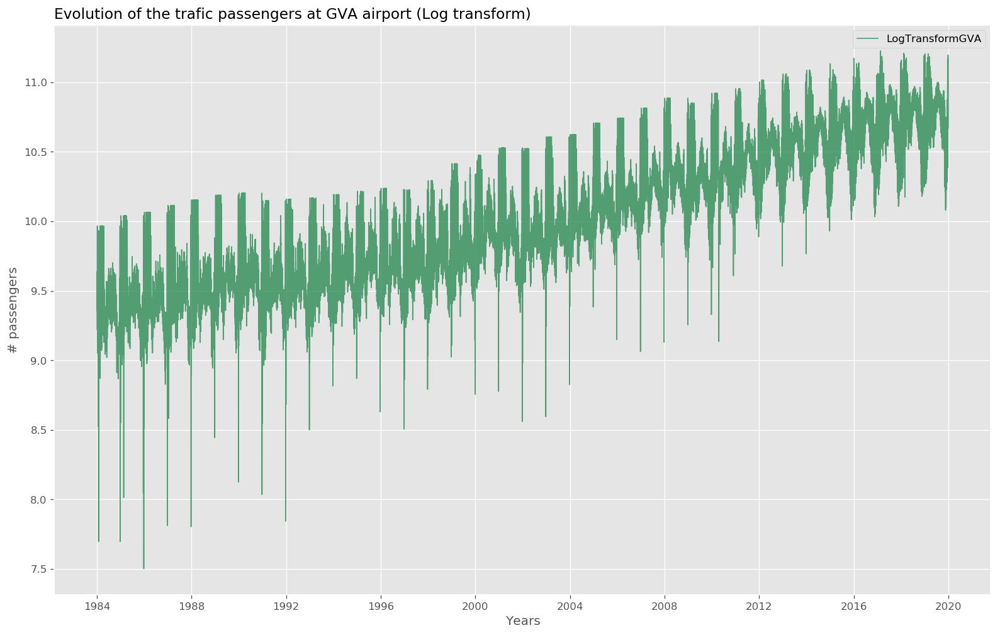

In [530]:
# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=120)

# setting the x axis
x = data_ofac_cleaned['LogTransformGVA'].loc['1984-01-02':'2019-12-31'].index

plt.plot(x, data_ofac_cleaned['LogTransformGVA'].loc['1984-01-02':'2019-12-31'], marker='', color='seagreen', linewidth=1, alpha=0.8)

# Add titles & legend
plt.title("Evolution of the trafic passengers at GVA airport (Log transform)", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

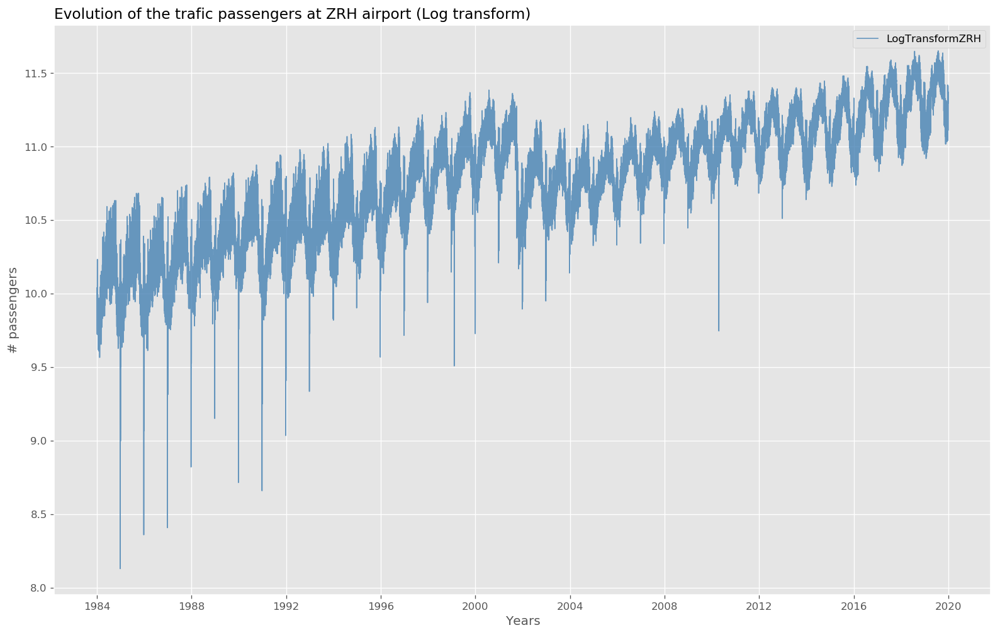

In [531]:
# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=120)

# setting the x axis
x = data_ofac_cleaned['LogTransformZRH'].loc['1984-01-02':'2019-12-31'].index

plt.plot(x, data_ofac_cleaned['LogTransformZRH'].loc['1984-01-02':'2019-12-31'], marker='', color='steelblue', linewidth=1, alpha=0.8)

# Add titles & legend
plt.title("Evolution of the trafic passengers at ZRH airport (Log transform)", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

Let's analyse the variance over time, by taking a rolling window of 365 days.

In [532]:
data_ofac_cleaned['Original Variance EAP'] = data_ofac_cleaned['EAP'].rolling(365).var()
data_ofac_cleaned['Log Variance EAP'] = data_ofac_cleaned['LogTransformEAP'].rolling(365).var()

data_ofac_cleaned['Original Variance GVA'] = data_ofac_cleaned['GVA'].rolling(365).var()
data_ofac_cleaned['Log Variance GVA'] = data_ofac_cleaned['LogTransformGVA'].rolling(365).var()

data_ofac_cleaned['Original Variance ZRH'] = data_ofac_cleaned['ZRH'].rolling(365).var()
data_ofac_cleaned['Log Variance ZRH'] = data_ofac_cleaned['LogTransformZRH'].rolling(365).var()

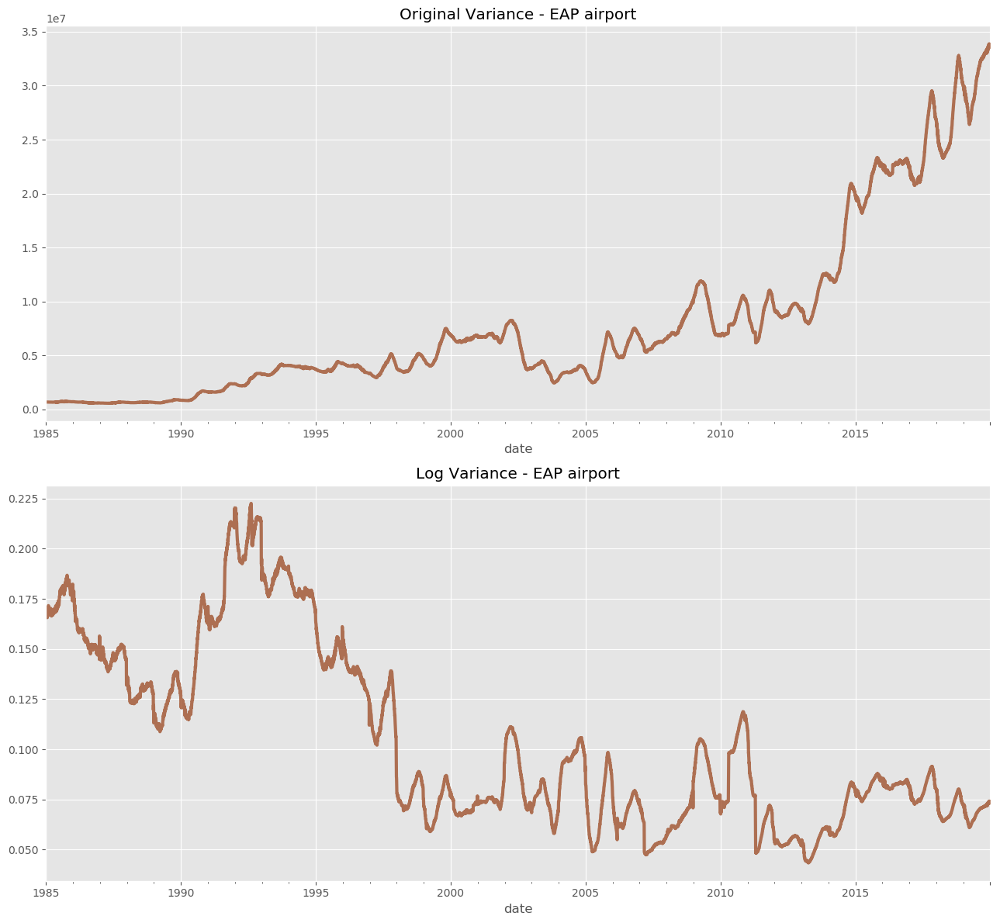

In [533]:
fig, ax = plt.subplots(2,1, figsize=(13,12), dpi=100)
data_ofac_cleaned['Original Variance EAP'].loc['1985-01-01':'2020-12-31'].plot(ax=ax[0], title='Original Variance - EAP airport', linewidth=3, color='sienna', alpha=0.8)
data_ofac_cleaned['Log Variance EAP'].loc['1985-01-01':'2020-12-31'].plot(ax=ax[1], title='Log Variance - EAP airport', linewidth=3, color='sienna', alpha=0.8)
fig.tight_layout()
plt.show()

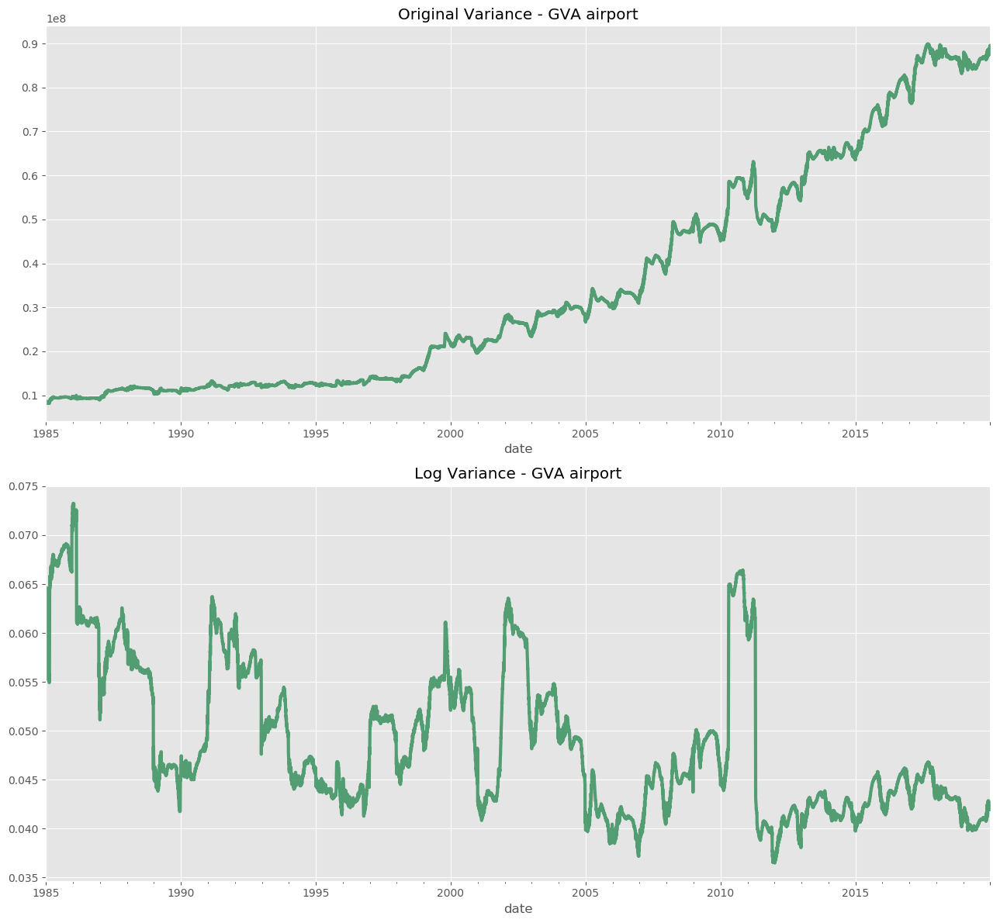

In [534]:
fig, ax = plt.subplots(2,1, figsize=(13,12), dpi=100)
data_ofac_cleaned['Original Variance GVA'].loc['1985-01-01':'2020-12-31'].plot(ax=ax[0], title='Original Variance - GVA airport', linewidth=3, color='seagreen', alpha=0.8)
data_ofac_cleaned['Log Variance GVA'].loc['1985-01-01':'2020-12-31'].plot(ax=ax[1], title='Log Variance - GVA airport', linewidth=3, color='seagreen', alpha=0.8)
fig.tight_layout()
plt.show()

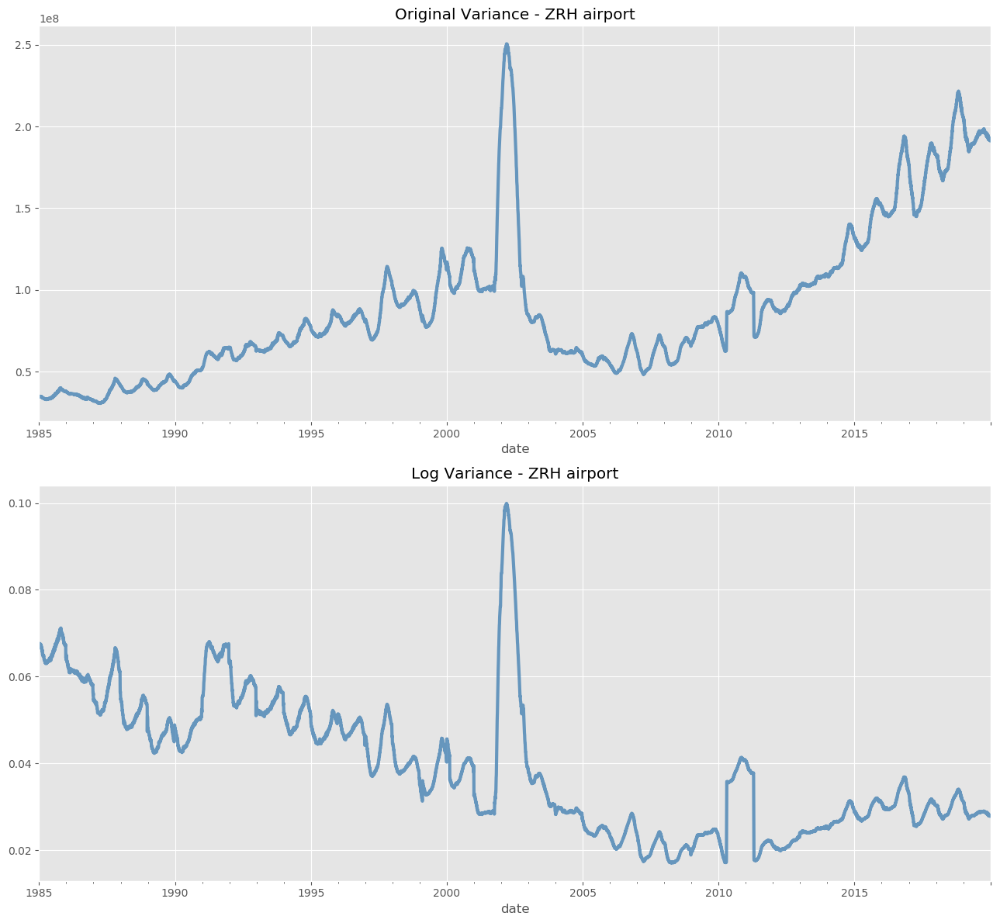

In [535]:
fig, ax = plt.subplots(2,1, figsize=(13,12), dpi=100)
data_ofac_cleaned['Original Variance ZRH'].loc['1985-01-01':'2020-12-31'].plot(ax=ax[0], title='Original Variance - ZRH airport', linewidth=3, color='steelblue', alpha=0.8)
data_ofac_cleaned['Log Variance ZRH'].loc['1985-01-01':'2020-12-31'].plot(ax=ax[1], title='Log Variance - ZRH airport', linewidth=3, color='steelblue', alpha=0.8)
fig.tight_layout()
plt.show()

The log variance exhibit much less variability and seems more stable.  
Let's now create a combined version of the data (1st difference and log transformed)

In [536]:
data_ofac_cleaned['Logged first diff EAP'] = data_ofac_cleaned['LogTransformEAP'] - data_ofac_cleaned['LogTransformEAP'].shift()
data_ofac_cleaned['Logged first diff GVA'] = data_ofac_cleaned['LogTransformGVA'] - data_ofac_cleaned['LogTransformGVA'].shift()
data_ofac_cleaned['Logged first diff ZRH'] = data_ofac_cleaned['LogTransformZRH'] - data_ofac_cleaned['LogTransformZRH'].shift()

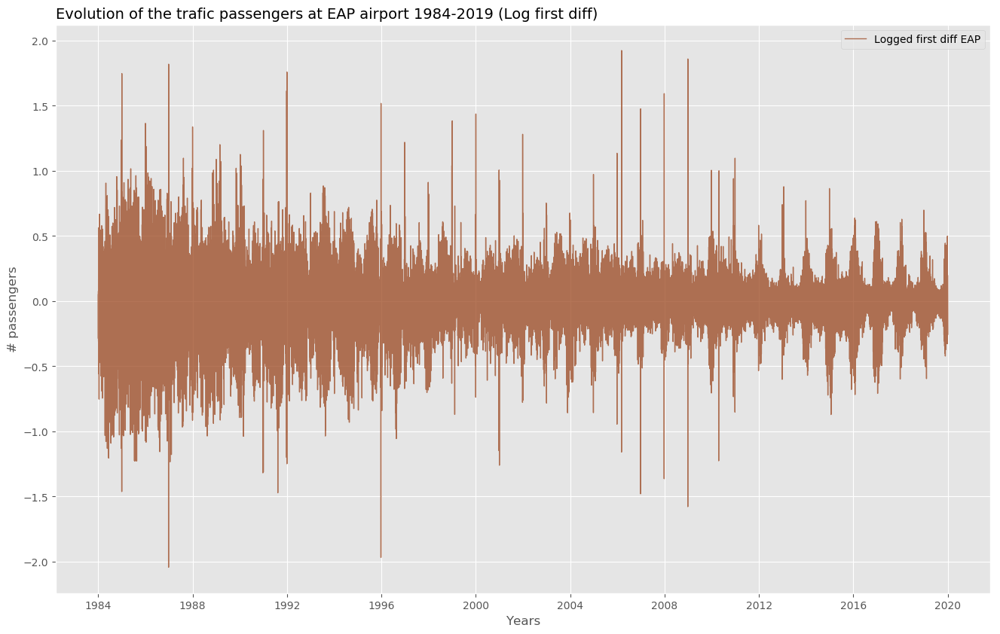

In [537]:
# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=100)

# setting the x axis
x = data_ofac_cleaned.loc['1984-01-02':'2019-12-31'].index

plt.plot(x, data_ofac_cleaned['Logged first diff EAP'].loc['1984-01-02':'2019-12-31'], marker='', color='sienna', linewidth=1, alpha=0.8)

# Add titles & legend
plt.title("Evolution of the trafic passengers at EAP airport 1984-2019 (Log first diff)", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

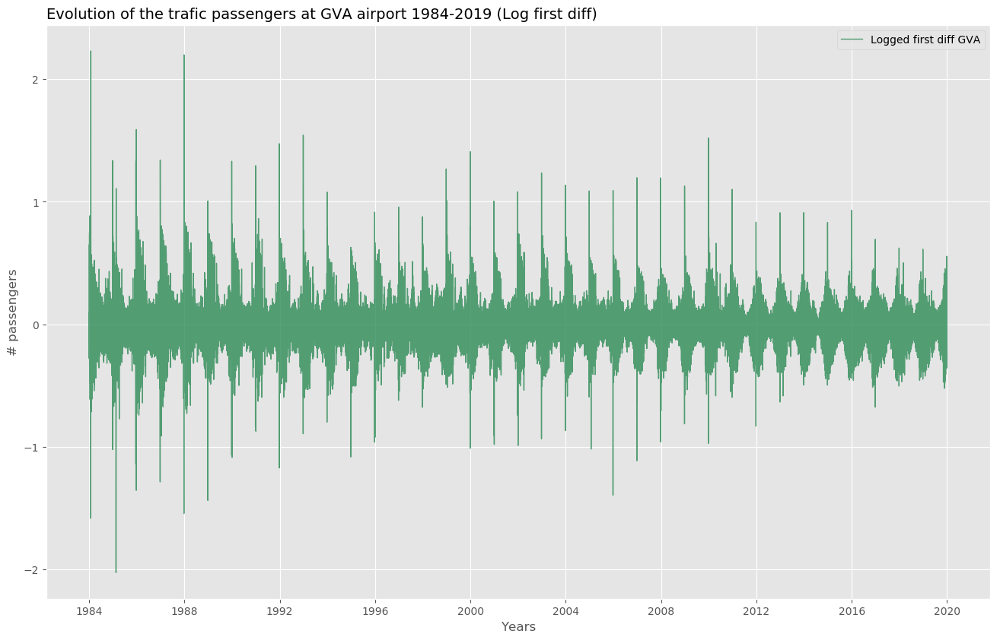

In [538]:
# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=100)

# setting the x axis
x = data_ofac_cleaned.loc['1984-01-02':'2019-12-31'].index

plt.plot(x, data_ofac_cleaned['Logged first diff GVA'].loc['1984-01-02':'2019-12-31'], marker='', color='seagreen', linewidth=1, alpha=0.8)

# Add titles & legend
plt.title("Evolution of the trafic passengers at GVA airport 1984-2019 (Log first diff)", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

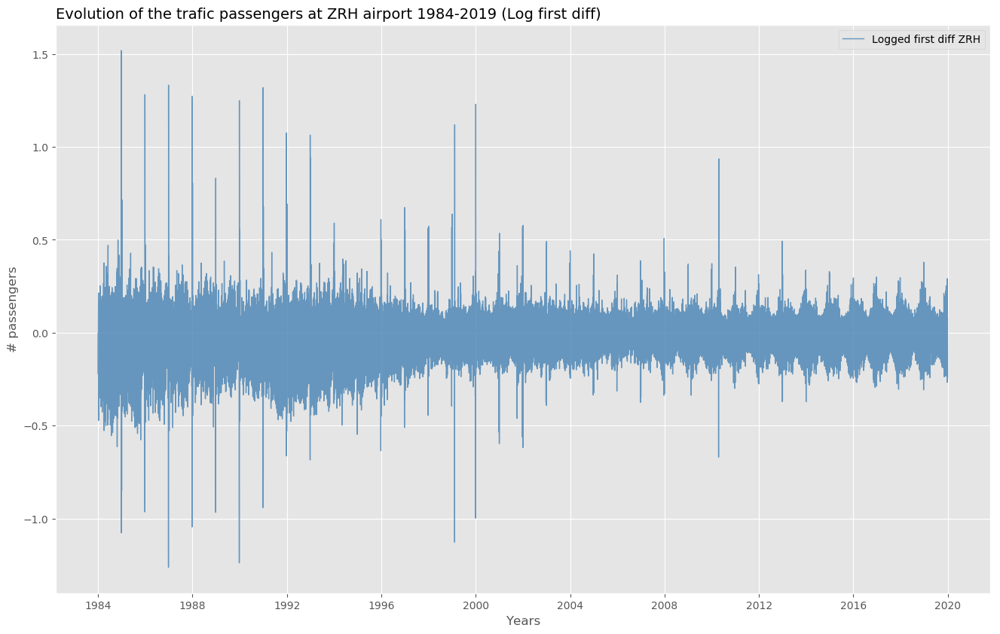

In [539]:
# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=100)

# setting the x axis
x = data_ofac_cleaned.loc['1984-01-02':'2019-12-31'].index

plt.plot(x, data_ofac_cleaned['Logged first diff ZRH'].loc['1984-01-02':'2019-12-31'], marker='', color='steelblue', linewidth=1, alpha=0.8)

# Add titles & legend
plt.title("Evolution of the trafic passengers at ZRH airport 1984-2019 (Log first diff)", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

### 2.4.3 Autocorrelation

Let's see now if the data exhibits some autocorrelation by ploting the ACF and PACF plots, with a lag of 100 days.

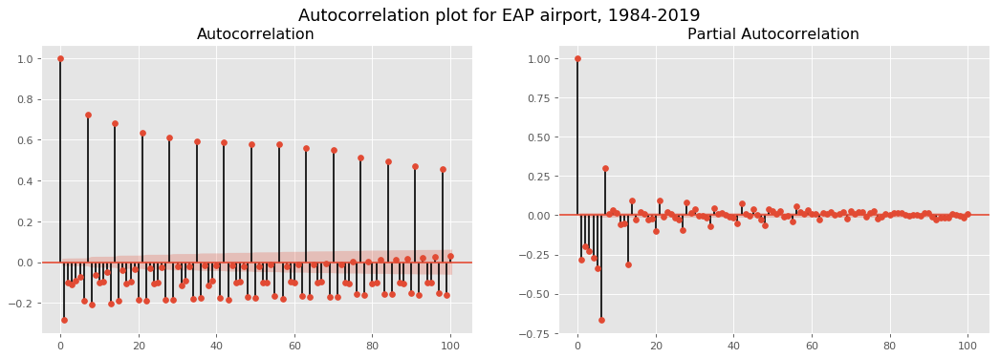

In [540]:
# autocorrelation plot

from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

    #https://www.statsmodels.org/stable/generated/statsmodels.graphics.tsaplots.plot_acf.html
    #x-axis represents the lag-value
    #y-axis represents the correlation
    #the cone is the confidence interval, set at 95%

fig, axes = plt.subplots(1,2,figsize=(16,5), dpi=80)

ax1 = plot_acf(data_ofac_cleaned['Logged first diff EAP'].loc['1984-01-02':'2019-12-31'], ax=axes[0], lags=100)
ax2 = plot_pacf(data_ofac_cleaned['Logged first diff EAP'].loc['1984-01-02':'2019-12-31'], ax=axes[1], lags=100)

plt.suptitle('Autocorrelation plot for EAP airport, 1984-2019', fontsize=16)
plt.subplots_adjust(hspace=0.2)
plt.show()

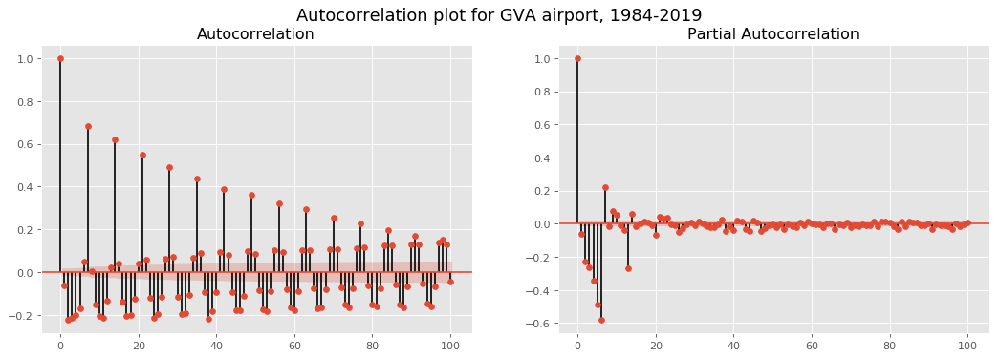

In [541]:
# autocorrelation plot

from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

    #https://www.statsmodels.org/stable/generated/statsmodels.graphics.tsaplots.plot_acf.html
    #x-axis represents the lag-value
    #y-axis represents the correlation
    #the cone is the confidence interval, set at 95%

fig, axes = plt.subplots(1,2,figsize=(16,5), dpi=80)

ax1 = plot_acf(data_ofac_cleaned['Logged first diff GVA'].loc['1984-01-02':'2019-12-31'], ax=axes[0], lags=100)
ax2 = plot_pacf(data_ofac_cleaned['Logged first diff GVA'].loc['1984-01-02':'2019-12-31'], ax=axes[1], lags=100)

plt.suptitle('Autocorrelation plot for GVA airport, 1984-2019', fontsize=16)
plt.subplots_adjust(hspace=0.2)
plt.show()

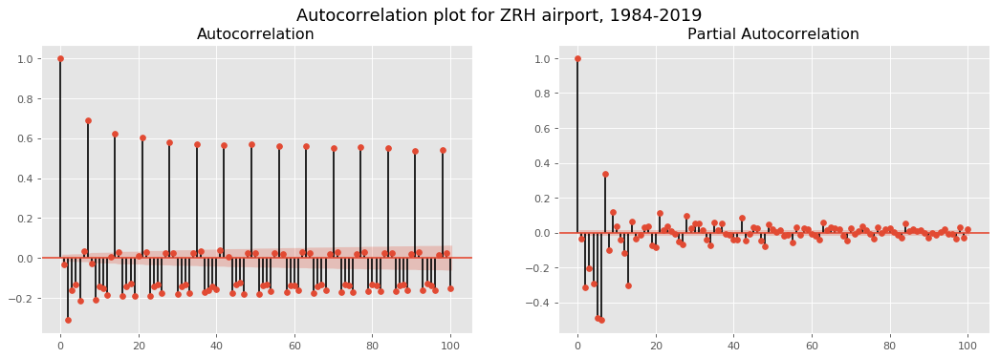

In [542]:
# autocorrelation plot

from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

    #https://www.statsmodels.org/stable/generated/statsmodels.graphics.tsaplots.plot_acf.html
    #x-axis represents the lag-value
    #y-axis represents the correlation
    #the cone is the confidence interval, set at 95%

fig, axes = plt.subplots(1,2,figsize=(16,5), dpi=80)

ax1 = plot_acf(data_ofac_cleaned['Logged first diff ZRH'].loc['1984-01-02':'2019-12-31'], ax=axes[0], lags=100)
ax2 = plot_pacf(data_ofac_cleaned['Logged first diff ZRH'].loc['1984-01-02':'2019-12-31'], ax=axes[1], lags=100)

plt.suptitle('Autocorrelation plot for ZRH airport, 1984-2019', fontsize=16)
plt.subplots_adjust(hspace=0.2)
plt.show()

**Comment**
>For the three airports, the data, although log diff, seem to exhibit a weekly autocorrelation, based on the ACF plot, which is also confirmed by the pacf plot. This does make sense, as there is fundamentally a weekly pattern in the passenger's trafic, due to social and business reasons.

>**Definitions**  
**Autocorrelation** is simply the correlation of a series with its own lags. If a series is significantly autocorrelated, that means, the previous values of the series (lags) may be helpful in predicting the current value.

>**Partial Autocorrelation** also conveys similar information but it conveys the pure correlation of a series and its lag, excluding the correlation contributions from the intermediate lags.

## 2.5 Plotting the cleaned values and overview of the industry

Now that the data has been cleaned, let's take a broader view of the consolidated data, as well as the major events that shaped the industry. Interestingly, these events had different impacts on the industry.

### 2.5.1 Events that the industry encountered

The airline industry is a highly cyclical industry : the demand is indeed cyclical and the offer cannot be warehoused. The industy has also very high fixed costs, it is therefore sensitive to any external shock. Below is a sample of the events that the industry faced/is facing :

**1973 : oil crisis**
>Oil crisis began in october 1973 with the oil embargo. 

**1983 : global recession**
>Early 1980 a global recessin affected much of the developed countries. Switzerland's GDP was 0.6% in 1983 compared to 3.7% two yearrs later.

**1987 : Black monday**
>Monday, 19th october 1987. The stock markets around the world crashed unexpectedly, with the Dow Jones Industrial Average Index losing more than 22% of its value.

**1988 : Lockerbie bombing**
>Fligt 103 of Pan Am was bombed over Lockerbie, Scotland, on the 21 december 1988, killing all 270 pax and crew. New security measures arised.

**2001 : 9/11**
>The september attacks were a coordinated terrorist attacks by Al-Qaeda, an islamic terrorist group. The entire airspace of the US and Canada were closed, for a week, ordered by the FAA. This event had a drastic effect on the industry : 30k job cuts announced for european airlines and up to 90k job cuts for north american airlines(1).

**2001 : Grounding of Swissair**
>On the 2nd October 2001 Switzerland's national carrier, Swissair, grounded all of its planes due to financial difficulties, which resulted in bankruptcy.

**2002 : Severe acute respiratory syndrome (SARS-CoV-1)**
>From november 2002 to july 2003, a new virus appeared, which was first detected in the Guangdong region in China. Asia Pacific and North American airlines were particularly hit, where it is estimated that the trafic encountered a slump of around 35%.

**2008 : Financial crisis**
>The airline industry is procyclical. It suffered maor losses during the 2008 crisis, which mainly impacted the financial sector. It is estimated that around 15 airlines went burst, and the sector recorded $15b losses.

**2010 : Volcano Eyjafjallajökull**
>With the eruption of the volcano in Iceland, a cloud of volcanic ashes formed.
The ashes can damage the plane's engine, and even destroy them as experienced BA 9 in 1982.
As a result, the controlled airspace of many European countries was affected. In some part of Europe the closure lasted 6 days. Switzerland's FOCA closed the three main airports of Switzerland (as well as the airport in Lugano), from the 16th April 22:00 until the 19th April 13:00 CET time. This event was, at that time, the larget air-trafic shutdown since WWII.

**2020 : Coronavirus COVID-19**
>IATA estimates the airline industry would need a $200 bn bailout to survive (march 2020).


Sources : 
Wikipedia
, (1) ILO "Civil aviation and its changing world of work"

### 2.5.2 Plotting the yearly data

In [543]:
# Resampling the data to yearly frequency
data_ofac_cleaned_YR = data_ofac_cleaned.resample('Y').sum()

# Creating a column summing all the rows
data_ofac_cleaned_YR['TOTAL'] = data_ofac_cleaned_YR[['ZRH', 'GVA', 'EAP']].sum(axis=1)

# Changing the type to integer
data_ofac_cleaned_YR = data_ofac_cleaned_YR.astype('int64')

In [544]:
%store data_ofac_cleaned_YR

Stored 'data_ofac_cleaned_YR' (DataFrame)


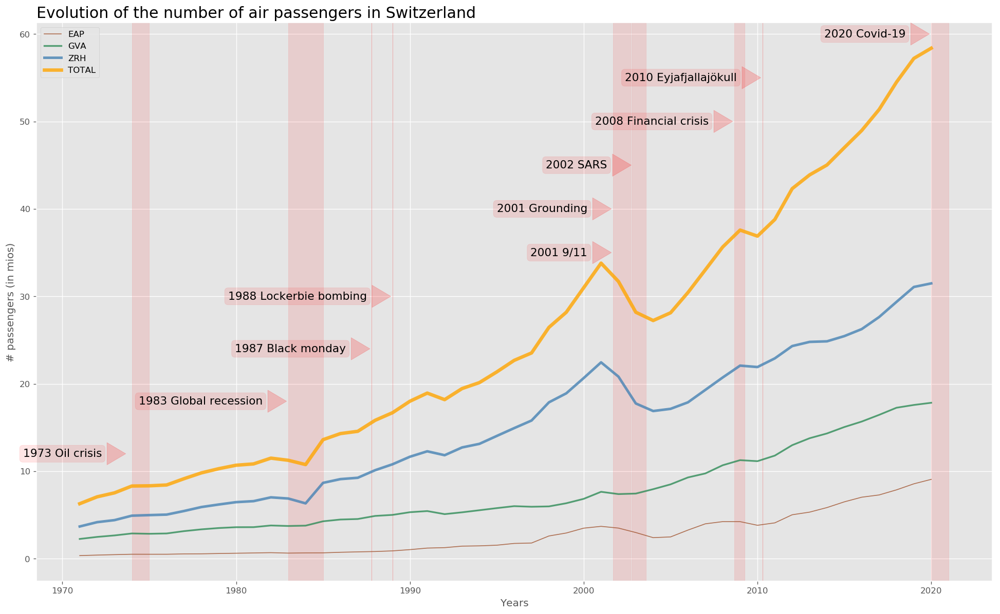

In [545]:
# Ploting the yearly data

plt.style.use('ggplot')

# setting the x axis
x = data_ofac_cleaned_YR.index


# creating the plot
fig = plt.figure(figsize=(20,12), dpi=120)
ax = fig.add_subplot(111)


# plotting the values
ax.plot(x, data_ofac_cleaned_YR.EAP.div(1000000), marker='', color='sienna', linewidth=1, alpha=0.8)
ax.plot(x, data_ofac_cleaned_YR.GVA.div(1000000), marker='', color='seagreen', linewidth=2, alpha=0.8)
ax.plot(x, data_ofac_cleaned_YR.ZRH.div(1000000), marker='', color='steelblue', linewidth=3, alpha=0.8)
ax.plot(x, data_ofac_cleaned_YR.TOTAL.div(1000000), marker='', color='ORANGE', linewidth=4, alpha=0.8)


# adding annotations
ax.annotate('1973 Oil crisis', xy=('1973-09-30', 12),  xycoords='data',
             xytext=(-30, 0), textcoords='offset points',
             size=13, ha='right', va="center",
             bbox=dict(boxstyle="round", alpha=0.1, color='red'),
             arrowprops=dict(arrowstyle="wedge,tail_width=2", alpha=0.2, color='red'));

ax.annotate('1983 Global recession', xy=('1983-01-01', 18),  xycoords='data',
             xytext=(-30, 0), textcoords='offset points',
             size=13, ha='right', va="center",
             bbox=dict(boxstyle="round", alpha=0.1, color='red'),
             arrowprops=dict(arrowstyle="wedge,tail_width=2", alpha=0.2, color='red'));

ax.annotate('1987 Black monday', xy=('1987-10-19', 24),  xycoords='data',
             xytext=(-30, 0), textcoords='offset points',
             size=13, ha='right', va="center",
             bbox=dict(boxstyle="round", alpha=0.1, color='red'),
             arrowprops=dict(arrowstyle="wedge,tail_width=2", alpha=0.2, color='red'));

ax.annotate('1988 Lockerbie bombing', xy=('1988-12-31', 30),  xycoords='data',
             xytext=(-30, 0), textcoords='offset points',
             size=13, ha='right', va="center",
             bbox=dict(boxstyle="round", alpha=0.1, color='red'),
             arrowprops=dict(arrowstyle="wedge,tail_width=2", alpha=0.2, color='red'));

ax.annotate('2001 9/11', xy=('2001-09-10', 35),  xycoords='data',
             xytext=(-30, 0), textcoords='offset points',
             size=13, ha='right', va="center",
             bbox=dict(boxstyle="round", alpha=0.1, color='red'),
             arrowprops=dict(arrowstyle="wedge,tail_width=2", alpha=0.2, color='red'));

ax.annotate('2001 Grounding', xy=('2001-09-10', 40),  xycoords='data',
             xytext=(-30, 0), textcoords='offset points',
             size=13, ha='right', va="center",
             bbox=dict(boxstyle="round", alpha=0.1, color='red'),
             arrowprops=dict(arrowstyle="wedge,tail_width=2", alpha=0.2, color='red'));

ax.annotate('2002 SARS', xy=('2002-11-01', 45),  xycoords='data',
             xytext=(-30, 0), textcoords='offset points',
             size=13, ha='right', va="center",
             bbox=dict(boxstyle="round", alpha=0.1, color='red'),
             arrowprops=dict(arrowstyle="wedge,tail_width=2", alpha=0.2, color='red'));

ax.annotate('2008 Financial crisis', xy=('2008-09-01', 50),  xycoords='data',
             xytext=(-30, 0), textcoords='offset points',
             size=13, ha='right', va="center",
             bbox=dict(boxstyle="round", alpha=0.1, color='red'),
             arrowprops=dict(arrowstyle="wedge,tail_width=2", alpha=0.2, color='red'));

ax.annotate('2010 Eyjafjallajökull', xy=('2010-04-16', 55),  xycoords='data',
             xytext=(-30, 0), textcoords='offset points',
             size=13, ha='right', va="center",
             bbox=dict(boxstyle="round", alpha=0.1, color='red'),
             arrowprops=dict(arrowstyle="wedge,tail_width=2", alpha=0.2, color='red'));

ax.annotate('2020 Covid-19', xy=('2019-12-31', 60),  xycoords='data',
             xytext=(-30, 0), textcoords='offset points',
             size=13, ha='right', va="center",
             bbox=dict(boxstyle="round", alpha=0.1, color='red'),
             arrowprops=dict(arrowstyle="wedge,tail_width=2", alpha=0.2, color='red'));


# adding colors to the periods related to the annotations
ax.axvspan('1973-12-31', '1974-12-31', alpha=0.1, color='red')
ax.axvspan('1982-12-31', '1984-12-31', alpha=0.1, color='red')
ax.axvspan('1987-10-19', '1987-10-20', alpha=0.3, color='red')
ax.axvspan('1988-12-31', '1988-12-31', alpha=0.3, color='red')
ax.axvspan('2001-09-10', '2002-09-12', alpha=0.1, color='red')
ax.axvspan('2002-09-30', '2003-08-01', alpha=0.1, color='red')
ax.axvspan('2008-09-01', '2009-03-31', alpha=0.1, color='red')
ax.axvspan('2010-04-16', '2010-04-19', alpha=0.3, color='red')
ax.axvspan('2019-12-31', '2020-12-31', alpha=0.1, color='red')


# Add title & legend
plt.title("Evolution of the number of air passengers in Switzerland", loc='left', fontsize=18, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers (in mios)")
plt.legend()
plt.savefig('EvolPassYrly.png')
plt.show()

## 2.6 Features engineering

Having gained some insights of the industry and in particular the swiss market, some features can be created that will be used later in the different models in order to try to increase their accuracy.

In [546]:
# adding a new column to facilitate the usage of the lambda function while creating new features
data_ofac_cleaned['date_temp'] = data_ofac_cleaned.index.values

# display the first values
data_ofac_cleaned.head(3)

,ZRH,GVA,EAP,year,month,month_nb,FirstDifferenceEAP,FirstDifferenceGVA,FirstDifferenceZRH,LogTransformEAP,...,Original Variance EAP,Log Variance EAP,Original Variance GVA,Log Variance GVA,Original Variance ZRH,Log Variance ZRH,Logged first diff EAP,Logged first diff GVA,Logged first diff ZRH,date_temp
date,,,,,,,,,,,,,,,,,,,,,
1970-01-01,3680187.0,2254752.0,350708.0,1970,Jan,01,NaN,NaN,NaN,12.767709,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01
1971-01-01,4173445.0,2487270.0,410088.0,1971,Jan,01,59380.0,232518.0,493258.0,12.924127,...,NaN,NaN,NaN,NaN,NaN,NaN,0.156418,0.098146,0.125778,1971-01-01
1972-01-01,4407162.0,2657988.0,460797.0,1972,Jan,01,50709.0,170718.0,233717.0,13.040713,...,NaN,NaN,NaN,NaN,NaN,NaN,0.116586,0.066384,0.054489,1972-01-01


### 2.6.1 new feature with the day of the week

>We could see that the variability of the data depends on the day of the week. A feature has been created with the integer corresponding the day of the week. From the charts below we can clearly see the variability in the number of passengers depending on the days of the week.

In [547]:
data_ofac_cleaned['date_jour'] = data_ofac_cleaned['date_temp'].apply(lambda x: x.weekday())
# returns 0 is monday and 6 is sunday

# display the first values
data_ofac_cleaned.head(3)

,ZRH,GVA,EAP,year,month,month_nb,FirstDifferenceEAP,FirstDifferenceGVA,FirstDifferenceZRH,LogTransformEAP,...,Log Variance EAP,Original Variance GVA,Log Variance GVA,Original Variance ZRH,Log Variance ZRH,Logged first diff EAP,Logged first diff GVA,Logged first diff ZRH,date_temp,date_jour
date,,,,,,,,,,,,,,,,,,,,,
1970-01-01,3680187.0,2254752.0,350708.0,1970,Jan,01,NaN,NaN,NaN,12.767709,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01,3
1971-01-01,4173445.0,2487270.0,410088.0,1971,Jan,01,59380.0,232518.0,493258.0,12.924127,...,NaN,NaN,NaN,NaN,NaN,0.156418,0.098146,0.125778,1971-01-01,4
1972-01-01,4407162.0,2657988.0,460797.0,1972,Jan,01,50709.0,170718.0,233717.0,13.040713,...,NaN,NaN,NaN,NaN,NaN,0.116586,0.066384,0.054489,1972-01-01,5


In [548]:
# Let's group the data per day of the week
data_ofac_cleaned_grouped = data_ofac_cleaned['1984-01-01':'2019-12-31'].groupby(['date_jour']).sum()

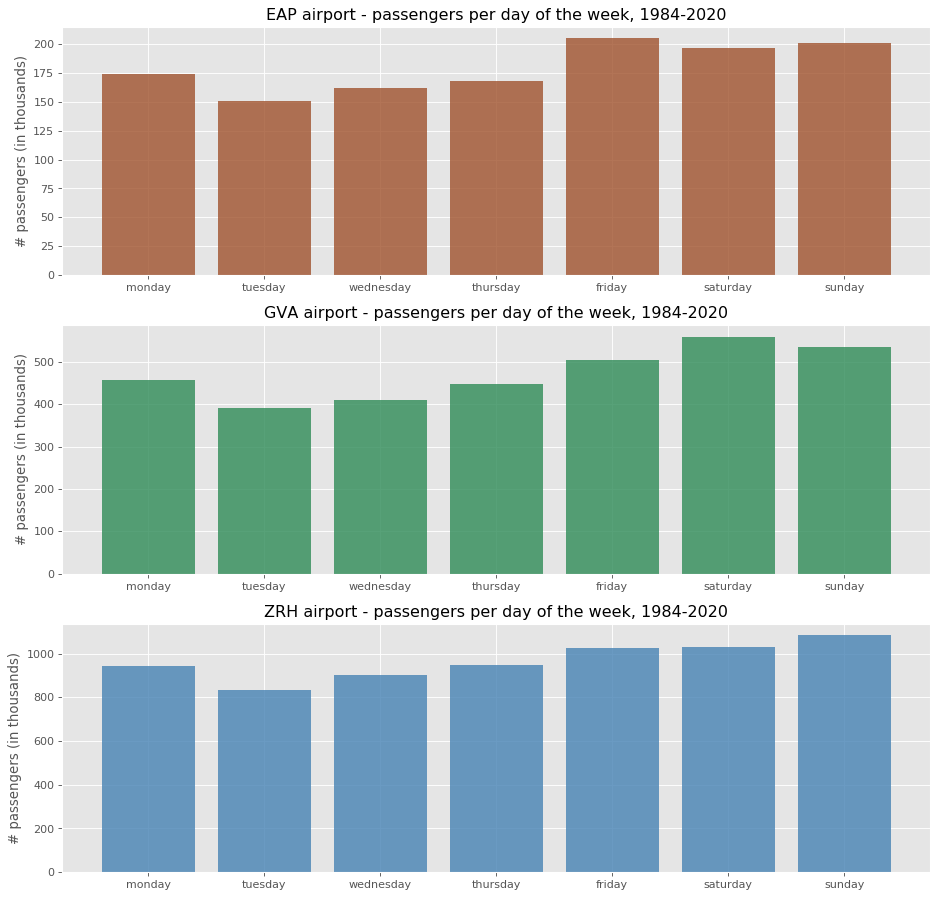

In [549]:
# Ploting the data

fig = plt.figure(figsize=(14,14), dpi=80)

ax = fig.add_subplot(311)
ax2 = fig.add_subplot(312)
ax3 = fig.add_subplot(313)

bars = data_ofac_cleaned_grouped.index
y_pos = ['monday', 'tuesday', 'wednesday', 'thursday', 'friday', 'saturday', 'sunday']

# EAP Airport
heighteap = data_ofac_cleaned_grouped.EAP/100000
ax.set(title='{} airport - passengers per day of the week, {}-2020'.format(iata_code_basel, startyear), ylabel='# passengers (in thousands)')
ax.bar(y_pos, heighteap, color='sienna', alpha = 0.8)


# GVA Airport
heightgva = data_ofac_cleaned_grouped.GVA/100000
ax2.set(title='{} airport - passengers per day of the week, {}-2020'.format(iata_code_geneva, startyear), ylabel='# passengers (in thousands)')
ax2.bar(y_pos, heightgva, color='seagreen', alpha = 0.8)


# ZRH Airport
heightzrh = data_ofac_cleaned_grouped.ZRH/100000
ax3.set(title='{} airport - passengers per day of the week, {}-2020'.format(iata_code_zurich, startyear), ylabel='# passengers (in thousands)')
ax3.bar(y_pos, heightzrh, color='steelblue', alpha = 0.8)

plt.show()

### 2.6.2 new feature to check whether it is a week-end or not

>With the results from above, we can see that the end of the week see more passengers thatn the rest of the days, probable due to two reasons :  
1. leisure passengers travelling for the week-end  
2. business passengers reaching home / their work place before and at the end of the week-end

In [550]:
# creating a boolean indicator - if the day is a saturday or a sunday (week-end)
data_ofac_cleaned['is_weekend'] = data_ofac_cleaned['date_jour'].apply(lambda x: x >= 5)

# display the first values
data_ofac_cleaned.head(3)

,ZRH,GVA,EAP,year,month,month_nb,FirstDifferenceEAP,FirstDifferenceGVA,FirstDifferenceZRH,LogTransformEAP,...,Original Variance GVA,Log Variance GVA,Original Variance ZRH,Log Variance ZRH,Logged first diff EAP,Logged first diff GVA,Logged first diff ZRH,date_temp,date_jour,is_weekend
date,,,,,,,,,,,,,,,,,,,,,
1970-01-01,3680187.0,2254752.0,350708.0,1970,Jan,01,NaN,NaN,NaN,12.767709,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01,3,False
1971-01-01,4173445.0,2487270.0,410088.0,1971,Jan,01,59380.0,232518.0,493258.0,12.924127,...,NaN,NaN,NaN,NaN,0.156418,0.098146,0.125778,1971-01-01,4,False
1972-01-01,4407162.0,2657988.0,460797.0,1972,Jan,01,50709.0,170718.0,233717.0,13.040713,...,NaN,NaN,NaN,NaN,0.116586,0.066384,0.054489,1972-01-01,5,True


In [551]:
# Let's group the data per day of the week
data_ofac_cleaned_grouped = data_ofac_cleaned['1984-01-01':'2019-12-31'].groupby(['is_weekend']).sum()

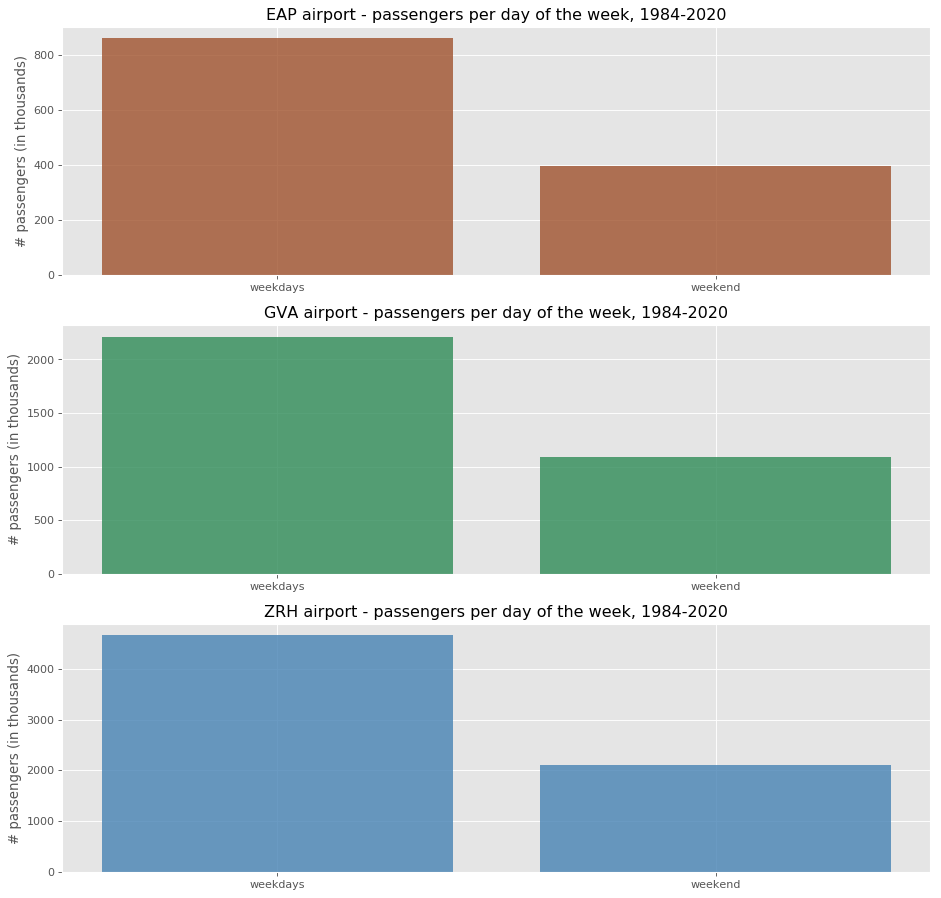

In [552]:
# Ploting the data

fig = plt.figure(figsize=(14,14), dpi=80)

ax = fig.add_subplot(311)
ax2 = fig.add_subplot(312)
ax3 = fig.add_subplot(313)

bars = data_ofac_cleaned_grouped.index
y_pos = ['weekdays','weekend']

# EAP Airport
heighteap = data_ofac_cleaned_grouped.EAP/100000
ax.set(title='{} airport - passengers per day of the week, {}-2020'.format(iata_code_basel, startyear), ylabel='# passengers (in thousands)')
ax.bar(y_pos, heighteap, color='sienna', alpha = 0.8)


# GVA Airport
heightgva = data_ofac_cleaned_grouped.GVA/100000
ax2.set(title='{} airport - passengers per day of the week, {}-2020'.format(iata_code_geneva, startyear), ylabel='# passengers (in thousands)')
ax2.bar(y_pos, heightgva, color='seagreen', alpha = 0.8)


# ZRH Airport
heightzrh = data_ofac_cleaned_grouped.ZRH/100000
ax3.set(title='{} airport - passengers per day of the week, {}-2020'.format(iata_code_zurich, startyear), ylabel='# passengers (in thousands)')
ax3.bar(y_pos, heightzrh, color='steelblue', alpha = 0.8)

plt.show()

### 2.6.3 new feature to check the season

>The seasons have been described as follows :
- Winter : 1st december to the 28/29 february
- Spring : 1st march to the 31 may
- summer : 1st june to 31 august
- fall   : 1st september to 30 november

>We could see before that there is some seasonality in the data, which looked linked to the seasons. The plots below confirm the seasonality.

In [553]:
# create a column to calculate the season.
data_ofac_cleaned['monthday'] = (data_ofac_cleaned.index.month * 100) + data_ofac_cleaned.index.day

In [554]:
"""Function to find the season according to the integer of the date.
The season if find by giving, for each date of the year, a unique integer.
With this integer, calculated by multiplying the month by 100 and adding the day's number, we can apply the right season to each date.

Description of the seasons
  - winter = 101 to 229
  - spring = 301 to 531
  - summer = 601 to 831
  - fall = 901 to 1130
  - winter = 1201 to 1231
"""
def findseason(x):
    if x < 230:
        return "winter"
    elif x < 532:
        return "spring"
    elif x < 832:
        return "summer"
    elif x < 1130:
        return "fall"
    elif x < 1232:
        return "winter"
    
    else:
        return 'N/A'

In [555]:
# applying the function for the season to the dataframe in order to create the column season
data_ofac_cleaned['season'] = data_ofac_cleaned['monthday'].apply(findseason)

# deleting the column which was created to calculate the season
data_ofac_cleaned.drop(columns='monthday', axis=1, inplace=True)

# display the first values
data_ofac_cleaned.head(3)

,ZRH,GVA,EAP,year,month,month_nb,FirstDifferenceEAP,FirstDifferenceGVA,FirstDifferenceZRH,LogTransformEAP,...,Log Variance GVA,Original Variance ZRH,Log Variance ZRH,Logged first diff EAP,Logged first diff GVA,Logged first diff ZRH,date_temp,date_jour,is_weekend,season
date,,,,,,,,,,,,,,,,,,,,,
1970-01-01,3680187.0,2254752.0,350708.0,1970,Jan,01,NaN,NaN,NaN,12.767709,...,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01,3,False,winter
1971-01-01,4173445.0,2487270.0,410088.0,1971,Jan,01,59380.0,232518.0,493258.0,12.924127,...,NaN,NaN,NaN,0.156418,0.098146,0.125778,1971-01-01,4,False,winter
1972-01-01,4407162.0,2657988.0,460797.0,1972,Jan,01,50709.0,170718.0,233717.0,13.040713,...,NaN,NaN,NaN,0.116586,0.066384,0.054489,1972-01-01,5,True,winter


In [556]:
# Let's group the data per day of the week
data_ofac_cleaned_grouped = data_ofac_cleaned['1984-01-01':'2019-12-31'].groupby(['season']).sum()

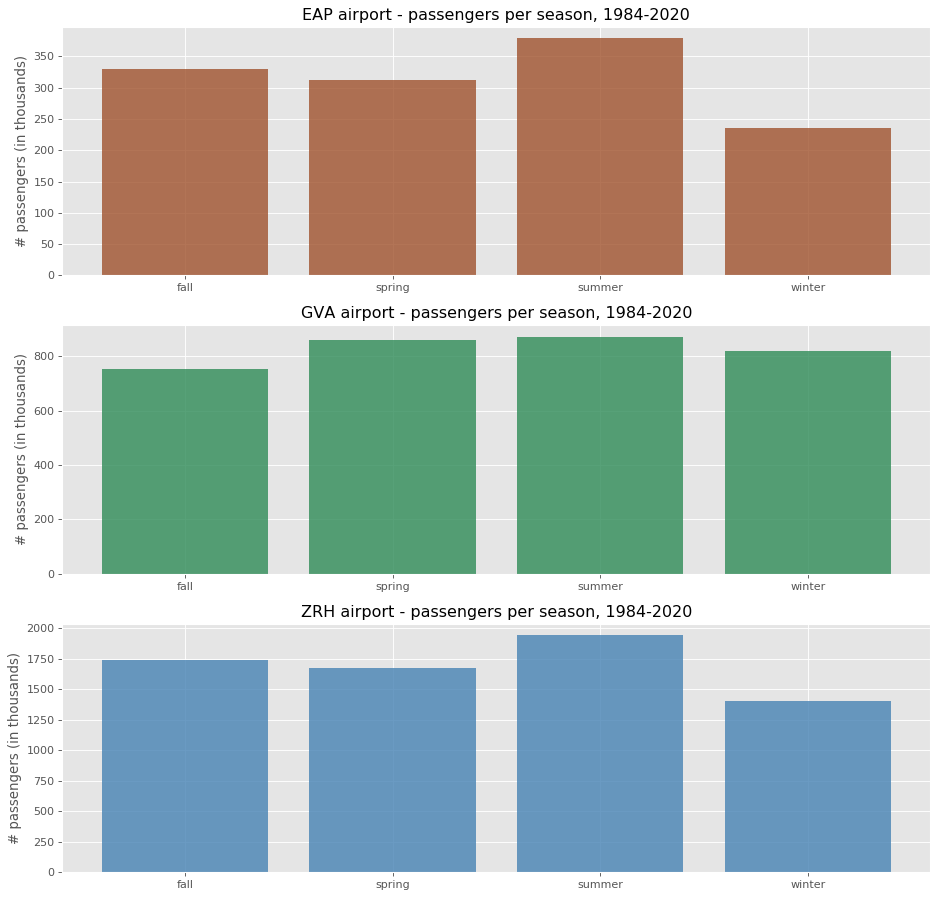

In [557]:
# Ploting the data

fig = plt.figure(figsize=(14,14), dpi=80)

ax = fig.add_subplot(311)
ax2 = fig.add_subplot(312)
ax3 = fig.add_subplot(313)

bars = data_ofac_cleaned_grouped.index
y_pos = bars


# EAP Airport
heighteap = data_ofac_cleaned_grouped.EAP/100000
ax.set(title='{} airport - passengers per season, {}-2020'.format(iata_code_basel, startyear), ylabel='# passengers (in thousands)')
ax.bar(y_pos, heighteap, color='sienna', alpha = 0.8)


# GVA Airport
heightgva = data_ofac_cleaned_grouped.GVA/100000
ax2.set(title='{} airport - passengers per season, {}-2020'.format(iata_code_geneva, startyear), ylabel='# passengers (in thousands)')
ax2.bar(y_pos, heightgva, color='seagreen', alpha = 0.8)


# ZRH Airport
heightzrh = data_ofac_cleaned_grouped.ZRH/100000
ax3.set(title='{} airport - passengers per season, {}-2020'.format(iata_code_zurich, startyear), ylabel='# passengers (in thousands)')
ax3.bar(y_pos, heightzrh, color='steelblue', alpha = 0.8)

plt.show()

### 2.6.4 new feature to add the quarter of the year

>The quarters didn't look so obvious in the data. With the plots below we can see that there is a variability between the airports - they do not all have the same behaviour each quarter. This is probably due to some specific events that the airports have.

In [558]:
data_ofac_cleaned['quarter'] = data_ofac_cleaned['date_temp'].dt.quarter
data_ofac_cleaned.head()

,ZRH,GVA,EAP,year,month,month_nb,FirstDifferenceEAP,FirstDifferenceGVA,FirstDifferenceZRH,LogTransformEAP,...,Original Variance ZRH,Log Variance ZRH,Logged first diff EAP,Logged first diff GVA,Logged first diff ZRH,date_temp,date_jour,is_weekend,season,quarter
date,,,,,,,,,,,,,,,,,,,,,
1970-01-01,3680187.0,2254752.0,350708.0,1970,Jan,01,NaN,NaN,NaN,12.767709,...,NaN,NaN,NaN,NaN,NaN,1970-01-01,3,False,winter,1
1971-01-01,4173445.0,2487270.0,410088.0,1971,Jan,01,59380.0,232518.0,493258.0,12.924127,...,NaN,NaN,0.156418,0.098146,0.125778,1971-01-01,4,False,winter,1
1972-01-01,4407162.0,2657988.0,460797.0,1972,Jan,01,50709.0,170718.0,233717.0,13.040713,...,NaN,NaN,0.116586,0.066384,0.054489,1972-01-01,5,True,winter,1
1973-01-01,4916594.0,2882865.0,507258.0,1973,Jan,01,46461.0,224877.0,509432.0,13.136775,...,NaN,NaN,0.096062,0.081215,0.109385,1973-01-01,0,False,winter,1
1974-01-01,4981495.0,2845841.0,504500.0,1974,Jan,01,-2758.0,-37024.0,64901.0,13.131323,...,NaN,NaN,-0.005452,-0.012926,0.013114,1974-01-01,1,False,winter,1


In [559]:
# Let's group the data per day of the week
data_ofac_cleaned_grouped = data_ofac_cleaned['1984-01-01':'2019-12-31'].groupby(['quarter']).sum()

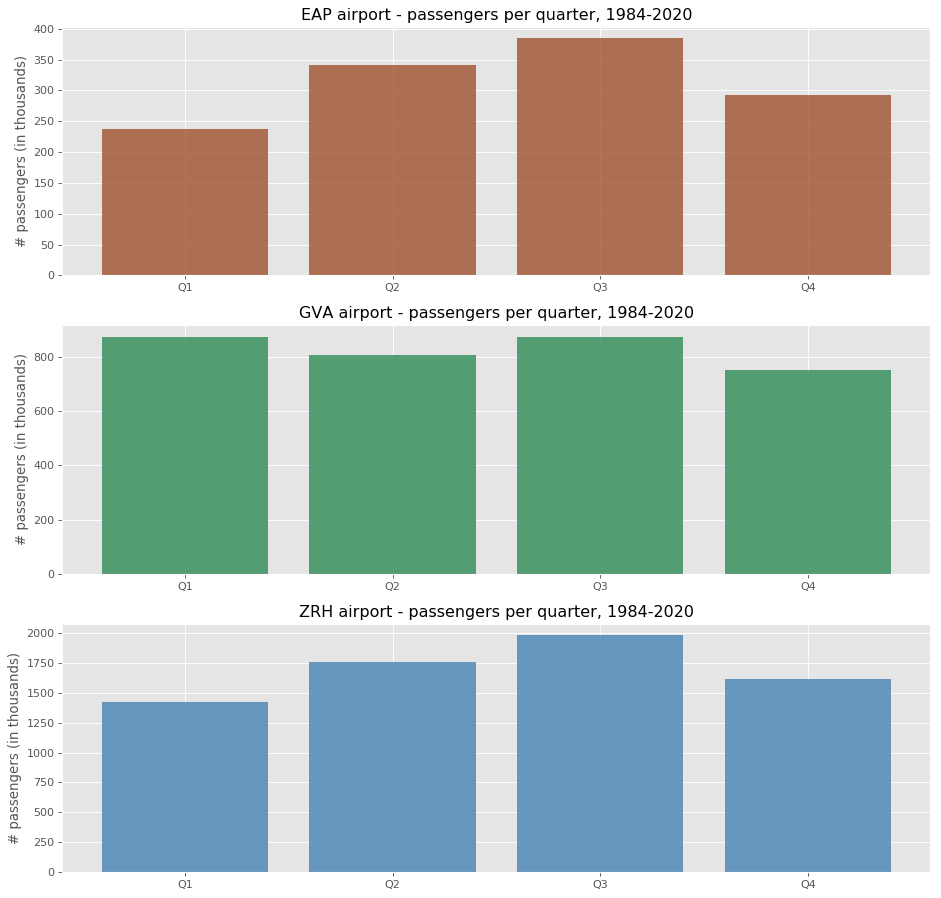

In [560]:
# Ploting the data

fig = plt.figure(figsize=(14,14), dpi=80)

ax = fig.add_subplot(311)
ax2 = fig.add_subplot(312)
ax3 = fig.add_subplot(313)

#bars = data_ofac_cleaned_grouped.index
#y_pos = np.arange(1,5,1)
y_pos = ['Q1','Q2','Q3','Q4']

# EAP Airport
heighteap = data_ofac_cleaned_grouped.EAP/100000
ax.set(title='{} airport - passengers per quarter, {}-2020'.format(iata_code_basel, startyear), ylabel='# passengers (in thousands)')
ax.bar(y_pos, heighteap, color='sienna', alpha = 0.8)


# GVA Airport
heightgva = data_ofac_cleaned_grouped.GVA/100000
ax2.set(title='{} airport - passengers per quarter, {}-2020'.format(iata_code_geneva, startyear), ylabel='# passengers (in thousands)')
ax2.bar(y_pos, heightgva, color='seagreen', alpha = 0.8)


# ZRH Airport
heightzrh = data_ofac_cleaned_grouped.ZRH/100000
ax3.set(title='{} airport - passengers per quarter, {}-2020'.format(iata_code_zurich, startyear), ylabel='# passengers (in thousands)')
ax3.bar(y_pos, heightzrh, color='steelblue', alpha = 0.8)

plt.show()

### 2.6.5 new feature - change of regime from 2003

>While looking at the chart, there seems to be a change of regime before/after 2003, which corresponds to the end of the SARS. The trend seems to move at a faster pace. It appears also while ploting the variance at 2.4.2. A new feature will try to capture that change of trend (although the serie will be detrend), by adding a boolean value (0 and 1 instead of true/false) :
>- before 1983 = 0
- 1983 and after = 1
  
No plot for that feature, as it is not relevant.

In [561]:
data_ofac_cleaned['ChangeRegime03'] = data_ofac_cleaned['date_temp'] > '2002-12-31'
data_ofac_cleaned.head()

,ZRH,GVA,EAP,year,month,month_nb,FirstDifferenceEAP,FirstDifferenceGVA,FirstDifferenceZRH,LogTransformEAP,...,Log Variance ZRH,Logged first diff EAP,Logged first diff GVA,Logged first diff ZRH,date_temp,date_jour,is_weekend,season,quarter,ChangeRegime03
date,,,,,,,,,,,,,,,,,,,,,
1970-01-01,3680187.0,2254752.0,350708.0,1970,Jan,01,NaN,NaN,NaN,12.767709,...,NaN,NaN,NaN,NaN,1970-01-01,3,False,winter,1,False
1971-01-01,4173445.0,2487270.0,410088.0,1971,Jan,01,59380.0,232518.0,493258.0,12.924127,...,NaN,0.156418,0.098146,0.125778,1971-01-01,4,False,winter,1,False
1972-01-01,4407162.0,2657988.0,460797.0,1972,Jan,01,50709.0,170718.0,233717.0,13.040713,...,NaN,0.116586,0.066384,0.054489,1972-01-01,5,True,winter,1,False
1973-01-01,4916594.0,2882865.0,507258.0,1973,Jan,01,46461.0,224877.0,509432.0,13.136775,...,NaN,0.096062,0.081215,0.109385,1973-01-01,0,False,winter,1,False
1974-01-01,4981495.0,2845841.0,504500.0,1974,Jan,01,-2758.0,-37024.0,64901.0,13.131323,...,NaN,-0.005452,-0.012926,0.013114,1974-01-01,1,False,winter,1,False


### 2.6.6 One-hot encoding

>- One-hot encoding is the process which will help us proceed with the categorical variables just set above. These categorical variables will be processed into variables.  
- The Dataframe data_ofac_cleaned stores the categorical variables. The one-hot enconding will be applied on it.

In [562]:
data_ofac_cleaned.head(3)

,ZRH,GVA,EAP,year,month,month_nb,FirstDifferenceEAP,FirstDifferenceGVA,FirstDifferenceZRH,LogTransformEAP,...,Log Variance ZRH,Logged first diff EAP,Logged first diff GVA,Logged first diff ZRH,date_temp,date_jour,is_weekend,season,quarter,ChangeRegime03
date,,,,,,,,,,,,,,,,,,,,,
1970-01-01,3680187.0,2254752.0,350708.0,1970,Jan,01,NaN,NaN,NaN,12.767709,...,NaN,NaN,NaN,NaN,1970-01-01,3,False,winter,1,False
1971-01-01,4173445.0,2487270.0,410088.0,1971,Jan,01,59380.0,232518.0,493258.0,12.924127,...,NaN,0.156418,0.098146,0.125778,1971-01-01,4,False,winter,1,False
1972-01-01,4407162.0,2657988.0,460797.0,1972,Jan,01,50709.0,170718.0,233717.0,13.040713,...,NaN,0.116586,0.066384,0.054489,1972-01-01,5,True,winter,1,False


In [563]:
data_ofac_cleaned = pd.get_dummies(data_ofac_cleaned, columns=['date_jour', 'is_weekend', 'season', 'quarter', 'ChangeRegime03', 'month_nb'],drop_first=True)
data_ofac_cleaned.head(3)

# adding back the original data - for further analysis if needed in the models
data_ofac_cleaned['date_jour'] = data_ofac_cleaned['date_temp'].apply(lambda x: x.weekday())
data_ofac_cleaned['is_weekend'] = data_ofac_cleaned['date_jour'].apply(lambda x: x >= 5)
data_ofac_cleaned['monthday'] = (data_ofac_cleaned.index.month * 100) + data_ofac_cleaned.index.day
data_ofac_cleaned['season'] = data_ofac_cleaned['monthday'].apply(findseason)
data_ofac_cleaned['quarter'] = data_ofac_cleaned['date_temp'].dt.quarter
data_ofac_cleaned['ChangeRegime03'] = data_ofac_cleaned['date_temp'] > '2002-12-31'
data_ofac_cleaned['month_nb'] = [d.strftime('%m') for d in data_ofac_cleaned.index]

### 2.6.6 Shifted values

In [564]:
# Shifting the series

data_ofac_cleaned['shift1_logdiffEAP'] = data_ofac_cleaned['Logged first diff EAP'].shift(1)
data_ofac_cleaned['shift7_logdiffEAP'] = data_ofac_cleaned['Logged first diff EAP'].shift(7)

data_ofac_cleaned['shift1_logdiffGVA'] = data_ofac_cleaned['Logged first diff GVA'].shift(1)
data_ofac_cleaned['shift7_logdiffGVA'] = data_ofac_cleaned['Logged first diff GVA'].shift(7)

data_ofac_cleaned['shift1_logdiffZRH'] = data_ofac_cleaned['Logged first diff ZRH'].shift(1)
data_ofac_cleaned['shift7_logdiffZRH'] = data_ofac_cleaned['Logged first diff ZRH'].shift(7)

### 2.6.7 Adding a feature - GDP

The GDP stands for gross domestic product (GDP). It is an indicator of economic activity which makes it possible to measure and compare economic development levels in different countries.

_Caution in use: following the implementation of the European system of accounts (ESA 2010), the national accounts have been revised until 1995. The data prior to 1995 has been obtained by retropolation using evolution rates, which have been estimated on the basis on old accounting systems (OECD 1952, ESA 1979, ESA 1995). Therefore, this long time series cannot ensure the conceptual and methodological consistency for the entire period._



Sources : 
1. https://www.bfs.admin.ch/bfs/en/home/statistics/national-economy/national-accounts/gross-domestic-product.html
2. https://www.bfs.admin.ch/bfs/fr/home/statistiques/economie-nationale/comptes-nationaux/produit-interieur-brut.assetdetail.9546403.html

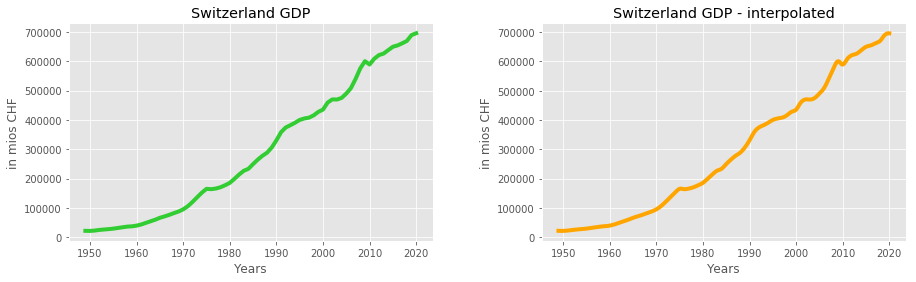

In [565]:
filename = "/Users/BawBawBaw/Desktop/Extension School/Applied Datascience Machine learning/05-Capstone Project/Data/GDP/GDP_long.xlsx"
gdp_ori = pd.read_excel(filename, encoding='latin1', header=4, skipfooter=5, parse_dates=True, usecols='A:B')

# adding the GDP for 2019 based on the estimate of the SECO - a growth of 0.90 % on the year
#https://www.seco.admin.ch/seco/fr/home/wirtschaftslage---wirtschaftspolitik/Wirtschaftslage/bip-quartalsschaetzungen-.html

gdp_ori = gdp_ori.append({'Unnamed: 0':'2019', 'PIB à prix courants,\nen millions de francs':gdp_ori['PIB à prix courants,\nen millions de francs'][gdp_ori['Unnamed: 0'] == 2018].values[0] * 1.009}, ignore_index=True)

# creating an index for the values
gdp_index = pd.date_range('1948-12-31', periods=72, freq='Y')

# replacing the index
gdp_ori.set_index(gdp_index, inplace=True)

# droping the column which hosts the year
gdp_ori = gdp_ori.drop('Unnamed: 0', axis=1)

# renaming the columns
gdp_ori.rename(columns={"PIB à prix courants,\nen millions de francs":"GDP"}, inplace=True)

# interpolating the GDP from yearly to daily, using the method spline
gdp_int = gdp_ori.asfreq('D')
gdp_int.interpolate(method='spline', order=2, inplace=True)

# copying the data to the dataframe
data_ofac_cleaned['GDP'] = gdp_int

# plotting the feature
plt.style.use('ggplot')

plt.figure(figsize=(15,4))
plt.subplots_adjust(wspace=0.3)

plt.subplot(1,2,1)
plt.title('Switzerland GDP')
plt.plot(gdp_ori.index, gdp_ori['GDP'], marker='', color='limegreen', linewidth=4, alpha=1, label='GDP')
plt.xlabel('Years')
plt.ylabel('in mios CHF')

plt.subplot(1,2,2)
plt.title('Switzerland GDP - interpolated')
plt.plot(gdp_int['GDP'], marker='', color='orange', linewidth=4, alpha=1, label='interpolated GDP')
plt.xlabel('Years')
plt.ylabel('in mios CHF')

plt.show()

### 2.6.8 Adding a feature - total population of the french part of Switzerland

**TEXT TO ADD**



Source : https://www.bfs.admin.ch/bfs/fr/home/statistiques/population.assetdetail.9566502.html

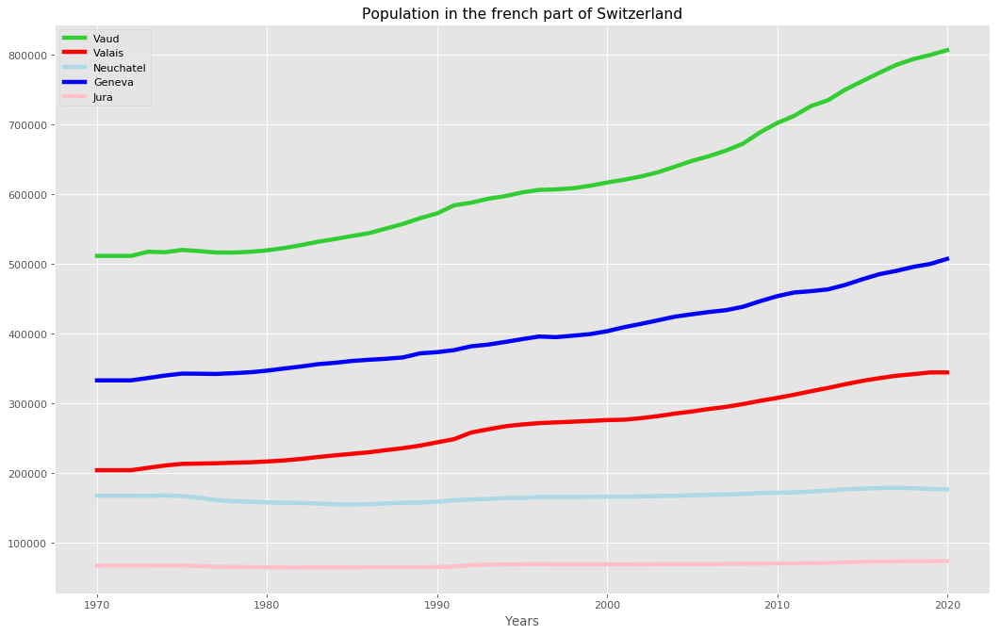

/Applications/anaconda3/envs/exts-ml_NEW/lib/python3.6/site-packages/scipy/interpolate/fitpack2.py:227: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


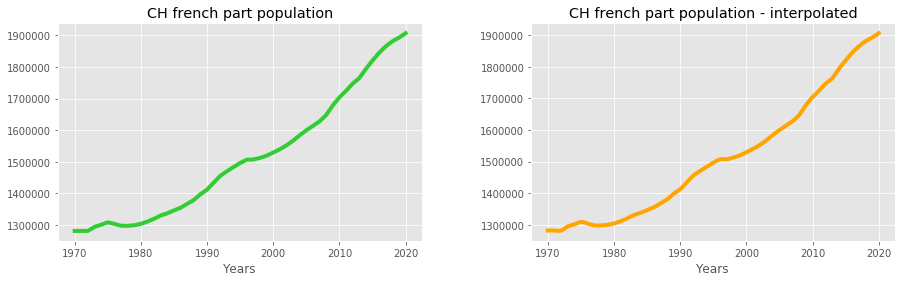

In [566]:
filename = "/Users/BawBawBaw/Desktop/Extension School/Applied Datascience Machine learning/05-Capstone Project/Data/Population/popcantons.xlsx"
pop_ori = pd.read_excel(filename, encoding='latin1', header=2,skipfooter=40, usecols='B:AZ')  # importing the data

pop_ori = pop_ori.drop(['Unnamed: 2', 'Unnamed: 3'],axis=1)  # droping two columns describing the data

pop_ori.rename(columns={"Unnamed: 1":"canton"}, inplace=True)  # renaming the columns canton

# filling the data for 2019
pop_ori['2019'] = [806088, 343955, 176328, 506765, 73563]
    # Sources  - figures in real numbers
        # Vaud : http://www.scris.vd.ch//Data_Dir/ElementsDir/7831/8/F/Population_communes_origine_2019.pdf
        # Valais : data not available for 2019!
        # Neuchatel : https://www.ne.ch/autorites/DEAS/STAT/population/Pages/accueil.aspx
        # Geneva : https://www.ge.ch/statistique/tel/publications/2020/informations_statistiques/autres_themes/is_population_05_2020.pdf
        # Jura (estimate) : https://stat.jura.ch/fr/Actualites/Toutes-les-actualites/Donnees-provisoires-de-la-population-2019.html

# filling the years 1969 to 1970 with the values of 1971. This is done to match the original dataframe - the data will not be used.
pop_ori.insert(0, '1970', [511085, 203743, 167222, 332595, 66900])
pop_ori.insert(0, '1969', [511085, 203743, 167222, 332595, 66900])
        
pop_ori.set_index('canton', inplace=True)  # setting the canton column as an index, so the index will be properly transposed
pop_ori = pop_ori.T  # transposing the data

pop_ori['tot_pop'] = pop_ori.sum(axis=1)  # adding a column suming the population

# creating an index for the values
pop_ori_index = pd.date_range('1969-12-31', periods=51, freq='Y')

# replacing the index
pop_ori.set_index(pop_ori_index, inplace=True)


# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=80)

# setting the x axis
x = pop_ori.index

plt.plot(x, pop_ori['Vaud'], marker='', color='limegreen', linewidth=4, alpha=1, label='Vaud')
plt.plot(x, pop_ori['Valais / Wallis'], marker='', color='red', linewidth=4, alpha=1, label='Valais')
plt.plot(x, pop_ori['Neuchâtel'], marker='', color='lightblue', linewidth=4, alpha=1, label='Neuchatel')
plt.plot(x, pop_ori['Genève'], marker='', color='blue', linewidth=4, alpha=1, label='Geneva')
plt.plot(x, pop_ori['Jura'], marker='', color='pink', linewidth=4, alpha=1, label='Jura')
#plt.plot(x, pop_ori['tot_pop'], marker='', color='orange', linewidth=4, alpha=1, label='TOTAL')

# Add title & legend
plt.title('Population in the french part of Switzerland', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
#plt.ylabel("in mios CHF")
plt.legend()
plt.show()

# interpolating the GDP from yearly to daily, using the method spline
pop_int = pop_ori.asfreq('D')
pop_int.interpolate(method='spline', order=2, inplace=True)

# copying the data to the dataframe
data_ofac_cleaned['population'] = pop_int['tot_pop'].astype(int)


# plotting the feature
plt.style.use('ggplot')

plt.figure(figsize=(15,4))
plt.subplots_adjust(wspace=0.3)

plt.subplot(1,2,1)
plt.title('CH french part population')
plt.plot(pop_ori.index, pop_ori['tot_pop'], marker='', color='limegreen', linewidth=4, alpha=1, label='population')
plt.xlabel('Years')

plt.subplot(1,2,2)
plt.title('CH french part population - interpolated')
plt.plot(pop_int['tot_pop'], marker='', color='orange', linewidth=4, alpha=1, label='interpolated population')
plt.xlabel('Years')

plt.show()

## 2.6.9 Some work on the two previous features 

1. Create a scaled version with StandardScaler()
2. As they are time series data, create a differencied serie for each

In [567]:
## 2.6.9 Some works on the two previous features

from sklearn.preprocessing import StandardScaler

# Standardizing the features
scaler = StandardScaler()
data_ofac_cleaned['GDP_stand'] = scaler.fit_transform(data_ofac_cleaned['GDP'].values.reshape(-1, 1))
data_ofac_cleaned['population_stand'] = scaler.fit_transform(data_ofac_cleaned['population'].values.reshape(-1, 1))

# differiencing the features
data_ofac_cleaned['GDP_diff'] = data_ofac_cleaned['GDP'].diff()
data_ofac_cleaned['population_diff'] = data_ofac_cleaned['population'].diff()

/Applications/anaconda3/envs/exts-ml_NEW/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Applications/anaconda3/envs/exts-ml_NEW/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


# 3. Models

## Model selection

The model I intend to use are :  
**Simple models - naive approach (last value)**  
- A baseline model using Scikit's Dummy Regressor, with the untransformed dataset.  
- SciKit LinearRegression : this model is the simpliest model seen in the course, and could be used as a second Dummy Regressor with the transformed dataset.
- SciKit Huber Regressor : using this model to see whether it is of any improvement to the LinearRegression. The optimal epsilon parameter is found through a loop.  
>These models used a static train/test set. From now I'll be using the TimeSeriesSplit from Scikit learn to have dynamic train/test split in order to try to improve the fitting of the models.  

**More complex models with additional features**  
- KNN as this model is recommended for time series analysis
- Random Forest as this model is recommended for time series analysis

**Complex models with additional features**
- Neural network using Keras

**Last model, out-of-scope of the course**
- An ARIMA model will be used.

## 3.1 Preparing the data

Defining functions to logdiff the data and reverse logdiff the data

In [568]:
"""Function to transform values to log nth difference
It takes a numpy array and take the log difference. We can specify the shift with the variable n.
Source : # https://groups.google.com/forum/#!topic/pystatsmodels/rdyNYlxJyg8 -> for the
np.diff(np.log. The function has been written by me
"""

def transdiff(source, n):
    
    c = np.diff(np.log(source), n=n)
    return c

In [569]:
"""Function to reverse transform values from log n-difference, and converts the data type to integer.
Source : # https://groups.google.com/forum/#!topic/pystatsmodels/rdyNYlxJyg8 -> for the
np.exp(np.cumsum(np.concatenate(([np.log(orig[0])], logdiff)))). The function has bee
written by me
"""

def revtransdiff(logdiff, orig): 
    d = np.exp(np.cumsum(np.concatenate(([np.log(orig[0])], logdiff))))
    d = d.astype(int)
    return d

#### 3.1.1 Preparing the dataframe

In [570]:
# ???

#### 3.1.1.1 Preparing the data for GVA airport

In [571]:
%store data_ofac_cleaned

Stored 'data_ofac_cleaned' (DataFrame)


In [572]:
"""To help visualise the different steps of the data transformation, the dataframe GVA_dly, containing the daily values of GVA
airport, is used. The different steps of the transformation standard to shift log diff, are done in a separate column.
"""

# Preparing the data for GVA airport
data_ofac_cleaned['x_GVA'] = data_ofac_cleaned['GVA'].shift()
data_ofac_cleaned['x7_GVA'] = data_ofac_cleaned['GVA'].shift(7)
data_ofac_cleaned['y_GVA'] = data_ofac_cleaned['GVA']
data_ofac_cleaned['x 1st diff_GVA'] = data_ofac_cleaned['x_GVA'].diff()
data_ofac_cleaned['x Log Transform_GVA'] = np.log(data_ofac_cleaned['x_GVA'])
data_ofac_cleaned['x Log 1st diff_GVA'] = data_ofac_cleaned['x Log Transform_GVA'].diff()
data_ofac_cleaned['y 1st diff_GVA'] = data_ofac_cleaned['y_GVA'].diff()
data_ofac_cleaned['y Log Transform_GVA'] = np.log(data_ofac_cleaned['y_GVA'])
data_ofac_cleaned['y Log 1st diff_GVA'] = data_ofac_cleaned['y Log Transform_GVA'].diff()
data_ofac_cleaned[['GVA', 'x_GVA', 'x7_GVA', 'y_GVA', 'x 1st diff_GVA', 'x Log Transform_GVA', 
                   'x Log 1st diff_GVA', 'y 1st diff_GVA', 'y Log Transform_GVA', 'y Log 1st diff_GVA']].head(8)

,GVA,x_GVA,x7_GVA,y_GVA,x 1st diff_GVA,x Log Transform_GVA,x Log 1st diff_GVA,y 1st diff_GVA,y Log Transform_GVA,y Log 1st diff_GVA
date,,,,,,,,,,
1970-01-01,2254752.0,NaN,NaN,2254752.0,NaN,NaN,NaN,NaN,14.628551,NaN
1971-01-01,2487270.0,2254752.0,NaN,2487270.0,NaN,14.628551,NaN,232518.0,14.726696,0.098146
1972-01-01,2657988.0,2487270.0,NaN,2657988.0,232518.0,14.726696,0.098146,170718.0,14.793080,0.066384
1973-01-01,2882865.0,2657988.0,NaN,2882865.0,170718.0,14.793080,0.066384,224877.0,14.874295,0.081215
1974-01-01,2845841.0,2882865.0,NaN,2845841.0,224877.0,14.874295,0.081215,-37024.0,14.861369,-0.012926
1975-01-01,2882353.0,2845841.0,NaN,2882353.0,-37024.0,14.861369,-0.012926,36512.0,14.874118,0.012748
1976-01-01,3149394.0,2882353.0,NaN,3149394.0,36512.0,14.874118,0.012748,267041.0,14.962721,0.088603
1977-01-01,3352376.0,3149394.0,2254752.0,3352376.0,267041.0,14.962721,0.088603,202982.0,15.025180,0.062459


#### 3.1.2 Splitting the data into a training and a test set for the real data. This splitting is done manually for the first models.
A ratio of 70% training and 30% testing is used.

In [573]:
data_ofac_cleaned.loc['1983-01-01':'1984-01-05']

,ZRH,GVA,EAP,year,month,FirstDifferenceEAP,FirstDifferenceGVA,FirstDifferenceZRH,LogTransformEAP,LogTransformGVA,...,population_diff,x_GVA,x7_GVA,y_GVA,x 1st diff_GVA,x Log Transform_GVA,x Log 1st diff_GVA,y 1st diff_GVA,y Log Transform_GVA,y Log 1st diff_GVA
date,,,,,,,,,,,,,,,,,,,,,
1983-01-01,6323707.0,3777932.0,658716.0,1983,Jan,22843.0,40946.0,-554622.0,13.398048,15.144687,...,10298.0,3736986.0,3149394.0,3777932.0,-59028.0,15.133790,-0.015672,40946.0,15.144687,0.010897
1984-01-01,22988.0,8011.0,1165.0,1984,Jan,-657551.0,-3769921.0,-6300719.0,7.060476,8.988571,...,6880.0,3777932.0,3352376.0,8011.0,40946.0,15.144687,0.010897,-3769921.0,8.988571,-6.156116
1984-01-02,22914.0,15318.0,1254.0,1984,Jan,89.0,7307.0,-74.0,7.134094,9.636784,...,22.0,8011.0,3504238.0,15318.0,-3769921.0,8.988571,-6.156116,7307.0,9.636784,0.648213
1984-01-03,18335.0,11596.0,941.0,1984,Jan,-313.0,-3722.0,-4579.0,6.846943,9.358415,...,21.0,15318.0,3599321.0,11596.0,7307.0,9.636784,0.648213,-3722.0,9.358415,-0.278368
1984-01-04,17576.0,12820.0,993.0,1984,Jan,52.0,1224.0,-759.0,6.900731,9.458762,...,22.0,11596.0,3603715.0,12820.0,-3722.0,9.358415,-0.278368,1224.0,9.458762,0.100346
1984-01-05,16707.0,11230.0,729.0,1984,Jan,-264.0,-1590.0,-869.0,6.591674,9.326344,...,22.0,12820.0,3796014.0,11230.0,1224.0,9.458762,0.100346,-1590.0,9.326344,-0.132418


In [574]:
# splitting the data into a train/test set

x_gva_train_real = data_ofac_cleaned['x_GVA'].loc['1984-01-02':'2019-12-31'][:int(len(data_ofac_cleaned)*0.7)]
x_gva_test_real = data_ofac_cleaned['x_GVA'].loc['1984-01-02':'2019-12-31'][int((len(data_ofac_cleaned)-1)*0.7):]
y_gva_train_real = data_ofac_cleaned['y_GVA'].loc['1984-01-02':'2019-12-31'][:int(len(data_ofac_cleaned)*0.7)]
y_gva_test_real = data_ofac_cleaned['y_GVA'].loc['1984-01-02':'2019-12-31'][int((len(data_ofac_cleaned)-1)*0.7):]

print('Train set real {} {}'.format(x_gva_train_real.shape,y_gva_train_real.shape))
print('Test  set real {} {}'.format(x_gva_test_real.shape,y_gva_test_real.shape))

Train set real (9214,) (9214,)
Test  set real (3935,) (3935,)


#### 3.1.3 Splitting the data into a training and a test set for the logdiff data. This splitting is done manually for the first models.

In [575]:
# splitting the data into a train/test set

x_gva_train_logdiff = transdiff(source = x_gva_train_real,n=1)
x_gva_test_logdiff  = transdiff(source = x_gva_test_real, n=1)
y_gva_train_logdiff = transdiff(source = y_gva_train_real,n=1)
y_gva_test_logdiff  = transdiff(source = y_gva_test_real, n=1)

print('Train set log diff {} {}'.format(x_gva_train_logdiff.shape, y_gva_train_logdiff.shape))
print('Test  set log diff {} {}'.format(x_gva_test_logdiff.shape, y_gva_test_logdiff.shape))

Train set log diff (9213,) (9213,)
Test  set log diff (3934,) (3934,)


#### 3.1.4 Droping the first value
In order to align the train set to the shifted values, we drop the first value of X and y.

In [576]:
x_gva_train_real    = x_gva_train_real.drop(index = x_gva_train_real.index[0:1])
y_gva_train_real    = y_gva_train_real.drop(index = y_gva_train_real.index[0:1])

x_gva_train_logdiff = np.delete(x_gva_train_logdiff, 0)
y_gva_train_logdiff = np.delete(y_gva_train_logdiff, 0)


print('Final shapes :')
print('Train set real {} {}'.format(x_gva_train_real.shape, y_gva_train_real.shape))
print('Test  set real {} {}'.format(x_gva_test_real.shape, y_gva_test_real.shape))
print('Train set log diff {} {}'.format(x_gva_train_logdiff.shape, y_gva_train_logdiff.shape))
print('Test  set log diff {} {}'.format(x_gva_test_logdiff.shape, y_gva_test_logdiff.shape))

Final shapes :
Train set real (9213,) (9213,)
Test  set real (3935,) (3935,)
Train set log diff (9212,) (9212,)
Test  set log diff (3934,) (3934,)


In [577]:
# Reshaping the data

x_gva_train_logdiff = x_gva_train_logdiff.reshape(-1, 1)
x_gva_test_logdiff = x_gva_test_logdiff.reshape(-1, 1)

#### 3.1.5 Creating a dataset with standardized data, to be used for some models

Standardizing the data with Scikit StandardScaler

In [578]:
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler

In [579]:
# Standardizing the data and creating two new variables

scaler = StandardScaler()
scaler.fit(x_gva_train_logdiff) # fitting the standardization on the training set
x_gva_train_logdiff_trans = scaler.transform(x_gva_train_logdiff)
x_gva_test_logdiff_trans = scaler.transform(x_gva_test_logdiff)

y_gva_train_logdiff_trans = scaler.transform(y_gva_train_logdiff.reshape(-1,1))
y_gva_test_logdiff_trans = scaler.transform(y_gva_test_logdiff.reshape(-1,1))

# Reshaping the new variables
y_gva_train_logdiff_trans.reshape(-1)
y_gva_test_logdiff_trans.reshape(-1)

array([ 0.41346123,  0.63180634,  0.80199615, ..., -0.36521347,
       -0.67203435, -1.32447171])

In [580]:
# Reshaping the new variables
x_gva_train_logdiff = x_gva_train_logdiff.reshape(-1, 1)
x_gva_test_logdiff = x_gva_test_logdiff.reshape(-1, 1)

x_gva_train_logdiff_trans = x_gva_train_logdiff_trans.reshape(-1, 1)
x_gva_test_logdiff_trans = x_gva_test_logdiff_trans.reshape(-1, 1)

In [581]:
#x_gva_train_logdiff = transdiff(source = x_gva_train_real,n=1)
#x_gva_test_logdiff  = transdiff(source = x_gva_test_real, n=1)
#y_gva_train_logdiff = transdiff(source = y_gva_train_real,n=1)
#y_gva_test_logdiff  = transdiff(source = y_gva_test_real, n=1)
#
#print('Train set log diff {} {}'.format(x_gva_train_logdiff.shape, y_gva_train_logdiff.shape))
#print('Test  set log diff {} {}'.format(x_gva_test_logdiff.shape, y_gva_test_logdiff.shape))

**Retransforming the data from the scaled version**
>To retransform (inverse) the data from a standardized version, we need to use inverse_transform  
inversed = scaler.inverse_transform(scaled)

#### 3.1.6 Preview of the dataframe

In [582]:
#GVA_dly.loc['2009-03-09':'2009-03-13']

#### 3.1.7 Checking visually the begining and the end of the different variables.  
This is done to make sure that the splitting has been done correctly, and also to make sure that the real values VS the logdiff variables are aligned.

In [583]:
print('Checking the values of the series :')
print('First values of the train set')
print('X real      {}'.format(x_gva_train_real[0]))
print('y real     {}'.format(y_gva_train_real[0]))
print('X logdiff  {:.3f}'.format(x_gva_train_logdiff[0][0]))   
print('y logdiff {:.3f}'.format(y_gva_train_logdiff[0]))
print('Last values of the train set')
print('X real      {}'.format(x_gva_train_real[len(x_gva_train_real)-1]))
print('y real     {}'.format(y_gva_train_real[len(y_gva_train_real)-1]))
print('X logdiff  {:.3f}'.format(x_gva_train_logdiff[len(x_gva_train_logdiff)-1][0]))
print('y logdiff {:.3f}'.format(y_gva_train_logdiff[len(y_gva_train_logdiff)-1]))
print('First values of the test set')
print('X real      {}'.format(x_gva_test_real[0]))
print('y real     {}'.format(y_gva_test_real[0]))
print('X logdiff  {:.3f}'.format(x_gva_test_logdiff[0][0]))
print('y logdiff {:.3f}'.format(y_gva_test_logdiff[0]))
print('Last values of the test set')
print('X real      {}'.format(x_gva_test_real[len(x_gva_test_real)-1]))
print('y real     {}'.format(y_gva_test_real[len(y_gva_test_real)-1]))
print('X logdiff  {:.3f}'.format(x_gva_test_logdiff[len(x_gva_test_logdiff)-1][0]))
print('y logdiff {:.3f}'.format(y_gva_test_logdiff[len(y_gva_test_logdiff)-1]))

Checking the values of the series :
First values of the train set
X real      15318.0
y real     11596.0
X logdiff  -0.278
y logdiff 0.100
Last values of the train set
X real      30579.0
y real     23548.0
X logdiff  -0.380
y logdiff -0.261
First values of the test set
X real      30579.0
y real     23548.0
X logdiff  -0.261
y logdiff 0.092
Last values of the test set
X real      57813.0
y real     43044.0
X logdiff  -0.150
y logdiff -0.295


## 3.2 Cost functions - definitions

### 3.2.1 Cost functions - definitions

In [584]:
# importing the cost functions from Scikit learn

# MAE - mean absolute error
from sklearn.metrics import mean_absolute_error

# MSE - mean squared error
from sklearn.metrics import mean_squared_error

# MSLE
from sklearn.metrics import mean_squared_log_error

# R2
from sklearn.metrics import r2_score

from math import sqrt


#### **MAE - mean absolute error**
**Definition**  
>It is the mean of the absolute errors. It has a clear interpretation, as it keeps the scale of the data.

#### **MSE - mean squared error**
**Definition**  
>It is the mean of the squared differences between predicted and actual, i.e. the residuals. It measures of the quality of the estimator  

#### **MSLE - mean squared log error**  
**Definition**  
>It is the mean of the squared differences between predicted and actual, i.e. the residuals. It measures of the quality of the estimator

#### **RMSE - root mean squared error**
**Definition** 
>It is a function that measures the average magnitude of the error. It is the squared root
of the average squared differences between the prediction and actual observation. It has the same unit as the quantity it tries to estimate. It is sensible to outliers.

#### **RMSLE - root mean squared log error**  
**Definition**  
>Similar to RMSE but more robust to outliers, but introduces a larger penalty for the underestimation of the actual variable than the overestimation  
(source : https://medium.com/analytics-vidhya/root-mean-square-log-error-rmse-vs-rmlse-935c6cc1802a).

#### **R2**
**Definition**  
>It is the coefficient of determination, indicates the explanation of the model.

### 3.2.2 Defining the functions for the cost functions not natively present in Scikit learn

#### 3.2.2.1 Root mean squared error

In [585]:
# function for the root_mean_squared_error
def RMSE(y_true, y_pred):
    return sqrt(mean_squared_error(y_true, y_pred))

#### 3.2.2.2 Root mean squared log error

In [586]:
# function for the root_mean_squared_log_error
def RMSLE(y_true, y_pred):
    return sqrt(mean_squared_log_error(y_true, y_pred))

## 3.3 Linear regressions

### 3.3.1 Baseline model

Scikit's Dummy regressor has been choosen as the baseline model. The model will be applied on the non-transformed datasets. The strategy mean has been choosen, as it optimizes the squares of the distances to the other values. 

In [587]:
from sklearn.dummy import DummyRegressor

dummy = DummyRegressor(strategy='mean')

dummy.fit(x_gva_train_real, y_gva_train_real)
baseline_gva_pred = dummy.predict(x_gva_test_real)

print('MAE of Dummy Regressor : {:.1f}'.format(mean_absolute_error(y_gva_test_real, baseline_gva_pred)))
print('RMSLE of Dummy Regressor : {:.3f}'.format(RMSLE(y_gva_test_real, baseline_gva_pred)))

MAE of Dummy Regressor : 22593.6
RMSLE of Dummy Regressor : 0.811


### 3.3.2 Linear Regression with ScikitLearn LinearRegression model

**Why choosing Linear Regression ?**
>The Linera Regressor from Scikit learn is known to give good results. It is a simple model which could serves as "the model to beat".

# Exporting the data to a csv file

In [588]:
data_ofac_cleaned.to_csv('data_ofac_cleaned.csv',sep=';', index=True) # Use Tab to seperate data

In [590]:
%store data_ofac_cleaned

Stored 'data_ofac_cleaned' (DataFrame)


# 4. Other ressource *(not already mentioned)*

- Forecasting: Principles and Practice by Rob J Hyndman and George Athanasopoulos | https://otexts.com/fpp2/
- Python Data Science Handbook by Jake VanderPlas | https://jakevdp.github.io/PythonDataScienceHandbook/index.html
- Datacamp courses  
1 Manipulating time series data in Python  
2 Machine learning for time series data in Python by Chris Holdgraf  
3 Time series analysis in Python by Rob Reider
- Time Series Analysis in Python – A Comprehensive Guide with Examples by Selva Prabhakaran | https://www.machinelearningplus.com/time-series/time-series-analysis-python/
- A Simple Time Series Analysis Of The S&P 500 Index by John Wittenauer | https://www.johnwittenauer.net/a-simple-time-series-analysis-of-the-sp-500-index/
- Time Series Forecasting as Supervised Learning by Jason Brownlee | https://machinelearningmastery.com/time-series-forecasting-supervised-learning/
- Qantitative Investment Analysis book, 2nd Edition

---

# Under development

In [589]:
alogdifftrain = GVA_dly['x7'][7:][:int(len(GVA_dly['x7'])*0.7)]
alogdifftrain = np.diff(np.log(alogdifftrain))

blogdifftrain = GVA_dly['y'][7:][:int(len(GVA_dly['x7'])*0.7)]
blogdifftrain = np.diff(np.log(blogdifftrain))

alogdifftest = GVA_dly['x7'][7:][int(len(GVA_dly['x7'])*0.7):]
alogdifftest = np.diff(np.log(alogdifftest))

blogdifftest = GVA_dly['y'][7:][int(len(GVA_dly['x7'])*0.7):]
blogdifftest = np.diff(np.log(blogdifftest))

atrain = GVA_dly['x7'][7:][:int(len(GVA_dly['x7'])*0.7)]
btrain = GVA_dly['y'][7:][:int(len(GVA_dly['y'])*0.7)]
atest = GVA_dly['x7'][7:][int(len(GVA_dly['x7'])*0.7):]
btest = GVA_dly['y'][7:][int(len(GVA_dly['y'])*0.7):]

# Standardizing the data and creating two new variables
scaler = StandardScaler()
scaler.fit(alogdifftrain.reshape(-1, 1)) # fitting the standardization on the training set
alogdifftrain_scaled = scaler.transform(alogdifftrain.reshape(-1, 1))
alogdifftest_scaled = scaler.transform(alogdifftest.reshape(-1, 1))

blogdifftrain_scaled = scaler.transform(blogdifftrain.reshape(-1, 1))
blogdifftest_scaled = scaler.transform(blogdifftest.reshape(-1, 1))

KeyError: 'x7'

In [ ]:
# RIDGE REGRESSION

ridge_res = []

from sklearn.linear_model import Ridge

for alpha in np.logspace(-10, 10, num=100):
    # Ridge regression
    ridge = Ridge(alpha=alpha)
    ridge.fit(alogdifftrain_scaled.reshape(-1, 1), blogdifftrain_scaled)
        
    # Compute predictions
    y_values_ridge = ridge.predict(alogdifftest_scaled)
    y_values_ridge_train = ridge.predict(alogdifftrain_scaled)

    # retransforming the data
    # First let's remove the scaling
    y_gva_pred_ridge = scaler.inverse_transform(y_values_ridge)
    y_gva_pred_ridge_train = scaler.inverse_transform(y_values_ridge_train)
    
    # Then retransform from logg diff
    y_gva_pred_ridge_retrans = revtransdiff(y_gva_pred_ridge.reshape(-1), btest)
    y_gva_pred_ridge_retrans_train = revtransdiff(y_gva_pred_ridge_train.reshape(-1), btrain)

    mae = mean_absolute_error(btest, y_gva_pred_ridge_retrans)
    mse_train = mean_squared_error(btrain, y_gva_pred_ridge_retrans_train)
    mse_test = mean_squared_error(btest, y_gva_pred_ridge_retrans)
    msle = sqrt(mean_squared_log_error(btest, y_gva_pred_ridge_retrans))
    rmse = RMSE(btest, y_gva_pred_ridge_retrans)
    rmsle = RMSLE(btest, y_gva_pred_ridge_retrans)
    r2 = r2_score(btest, y_gva_pred_ridge_retrans)
        

    ridge_res.append({
        'alpha':alpha,
        'MAE':mae,
        'MSE_train':mse_train,
        'MSE_test':mse_test,
        'MSLE':msle,
        'RMSE':rmse,
        'RMSLE':rmsle,
        'R2':r2,
    })

ridge_res = pd.DataFrame(ridge_res)
ridge_res.head(10)

In [ ]:
# Plot the validation curves
plt.semilogx(ridge_res['alpha'], ridge_res['MSE_train'], label='train curve')
plt.semilogx(ridge_res['alpha'], ridge_res['MSE_test'], label='test curve')
plt.xlabel('$log_{10}(alpha)$')
plt.ylabel('MSE')
plt.legend()
plt.show()

In [ ]:
# plotting the cost functions
plt.style.use('ggplot')

plt.figure(figsize=(12,4))
plt.subplots_adjust(wspace=0.5)

plt.subplot(1,4,1)
plt.title('MAE')
plt.plot(ridge_res['alpha'], ridge_res['MAE'])
plt.xlabel('alpha')
plt.ylabel('MAE')

plt.subplot(1,4,2)
plt.title('MSLE')
plt.plot(ridge_res['alpha'], ridge_res['MSLE'])
plt.xlabel('alpha')
plt.ylabel('MSLE')

plt.subplot(1,4,3)
plt.title('RMSLE')
plt.plot(ridge_res['alpha'], ridge_res['RMSLE'])
plt.xlabel('alpha')
plt.ylabel('RMSLE')

plt.subplot(1,4,4)
plt.title('R2')
plt.plot(ridge_res['alpha'], ridge_res['R2'])
plt.xlabel('alpha')
plt.ylabel('R2')

plt.show()

In [ ]:
# finding the value which maximimizes MSLE and saving it into a variable to be reused later

ridge_bestvalue = ridge_res[ridge_res['MSLE'] == ridge_res['MSLE'].min()].alpha.values[0]
print('Ridge Regressor : alpha value which minimize MSLE is {:.10f}'.format(ridge_bestvalue))

---

# **TO DO** 

TO DO Use Pipe

TO DO use the regressor version of the ML

**TO DO** add a description of the airports

**TO DO** add conlusion on what's happening to the sector right now

**TO DO** situation right now - where do we stand with the level of passengers, VS 1945...

---

# **TESTING THE MULTIVARIATE LINEAR REGRESSION** 

In [ ]:
# TEST POUR LA REGRESSION LINEAIRE MULTIVARIEE
# ============================================

GVA_dly['date_temp'] = GVA_dly.index.values
GVA_dly['date_jour'] = GVA_dly['date_temp'].apply(lambda x: x.weekday())

x = GVA_dly[['x', 'date_jour']].iloc[1:]
y = GVA_dly['y'].iloc[1:]


from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(x, y)
x_pr = lr.predict(x)

# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=100)

# setting the x axis
x = y.index

plt.plot(x, x_pr, marker='', color='limegreen', linewidth=1, alpha=1, label='forecast')
plt.plot(x, y, marker='', color='seagreen', linewidth=1, alpha=0.4, label='true values')

# Add titles & legend
plt.title("Evolution of the trafic passengers at GVA airport - real VS forecasted with the TEST set", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

___

# **TESTING THE DATA** 

In [ ]:
# TRUE VALUES - without any transformations

# True values
a = GVA_dly['x'].values
a = np.delete(a,0)
b = GVA_dly['y'].values
b = np.delete(b,0)

from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(a.reshape(-1, 1), b)

# coefficients
print('Coefficients:', lr.coef_)
print('Intercept:   ', lr.intercept_)

# print('Score', lr.score(a.reshape(-1, 1), b))

pred = lr.predict(a.reshape(-1, 1))

#from sklearn.metrics import mean_absolute_error
#print('MAE', mean_absolute_error(b, pred))

print('Score', lr.score(a.reshape(-1, 1), b))
from sklearn.metrics import mean_absolute_error
print('MAE', mean_absolute_error(b, pred))

# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=120)

# setting the x axis
x = GVA_dly[1:].index

plt.plot(x, pred, marker='', color='limegreen', linewidth=1, alpha=1, label='forecast')
plt.plot(x, b, marker='', color='seagreen', linewidth=1, alpha=0.4, label='true values')

# Add titles & legend
plt.title("Evolution of the trafic passengers at GVA airport - real VS forecasted", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

In [ ]:
# LOG
alog = np.log(GVA_dly['x'][1:].values)
blog = np.log(GVA_dly['y'][1:].values)

b = GVA_dly['y'][1:].values

from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(alog.reshape(-1, 1), blog)

# coefficients
print('Coefficients:', lr.coef_)
print('Intercept:   ', lr.intercept_)

pred = lr.predict(alog.reshape(-1, 1))

ypred = np.exp(pred)
ytrue = b

print('Score', lr.score(ypred.reshape(-1, 1), ytrue))
from sklearn.metrics import mean_absolute_error
print('MAE', mean_absolute_error(ytrue, ypred))

# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=120)

# setting the x axis
x = GVA_dly[1:].index

plt.plot(x, ypred, marker='', color='limegreen', linewidth=1, alpha=1, label='forecast')
plt.plot(x, ytrue, marker='', color='seagreen', linewidth=1, alpha=0.4, label='true values')

# Add titles & legend
plt.title("Evolution of the trafic passengers at GVA airport - real VS forecasted", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

In [ ]:
# LOG DIFF (1)

alogdiff = np.diff(np.log(GVA_dly['x'][1:]))
blogdiff = np.diff(np.log(GVA_dly['y'][1:]))

b = GVA_dly['y'][1:].values

from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(alogdiff.reshape(-1, 1), blogdiff)

# coefficients
print('Coefficients:', lr.coef_)
print('Intercept:   ', lr.intercept_)

pred = lr.predict(alogdiff.reshape(-1, 1))

ypred = revtransdiff(pred, b)
ytrue = b

print('Score', lr.score(ypred.reshape(-1, 1), ytrue))
from sklearn.metrics import mean_absolute_error
print('MAE', mean_absolute_error(ytrue, ypred))

# Plotting
plt.style.use('ggplot')
plt.figure(figsize=(16,10), dpi=120)

# setting the x axis
x = GVA_dly[1:].index

plt.plot(x, ypred, marker='', color='limegreen', linewidth=1, alpha=1, label='forecast')
plt.plot(x, ytrue, marker='', color='seagreen', linewidth=1, alpha=0.4, label='true values')

# Add titles & legend
plt.title("Evolution of the trafic passengers at GVA airport - real VS forecasted", loc='left', fontsize=14, fontweight=0, color='black')
plt.xlabel("Years")
plt.ylabel("# passengers")
plt.legend()
plt.show()

---

In [ ]:
# TO BE USED FOR TRAINING PURPOSE ONLY

%store data_ofac_cleaned
%store x_gva_train_real
%store y_gva_train_real
%store x_gva_test_real
%store y_gva_test_real
%store x_gva_test_logdiff
%store y_gva_test_logdiff